# **Pre processing**

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [2]:
data = pd.read_csv('PlayerData.csv')

In [3]:
data.columns

Index(['player', 'short_name', 'country', 'position', 'club', 'league', 'age',
       'birth', 'matches', 'starts',
       ...
       'carry_final_3rd', 'carry_box', 'miscontrol', 'disposs',
       'pass_on_target', 'pass_rcv', 'prog_pass_rcv', 'team_abbr',
       'primary_color', 'secondary_color'],
      dtype='object', length=230)

In [4]:
data.head()

,player,short_name,country,position,club,league,age,birth,matches,starts,...,carry_final_3rd,carry_box,miscontrol,disposs,pass_on_target,pass_rcv,prog_pass_rcv,team_abbr,primary_color,secondary_color
0,Aaron Connolly,A. Connolly,Republic of Ireland,FW,Brighton,Premier League,21,2000,17,9,...,8,4,29,15,357,143,66,BHA,#FFFFFF,#0057B8
1,Aaron Cresswell,A. Cresswell,England,DF,West Ham,Premier League,32,1989,36,36,...,40,3,7,9,1366,1316,30,WHU,#7A263A,#1bb1e7
2,Aarón Escandell,A. Escandell,Spain,GK,Granada,La Liga,26,1995,5,5,...,0,0,0,0,54,54,0,GRA,#FFFFFF,#1C61AB
3,Aaron Hickey,A. Hickey,Scotland,DF,Bologna,Serie A,19,2002,11,10,...,18,2,10,13,301,280,16,BOL,#243D5F,#C7253A
4,Aaron Leya Iseka,A. Leya Iseka,Belgium,FW,Metz,Ligue 1,24,1997,21,12,...,12,10,32,20,543,252,62,MTZ,#FFFFFF,#892435


In [5]:
data_outfield = data[(data['position'] != 'GK') & (data['mins'] > 500)]

In [6]:
data_outfield.reset_index(drop=True, inplace=True)

In [7]:
data_attacking_outfield = data[~data['position'].isin(['GK', 'DF'])]

In [8]:
data_attacking_outfield.reset_index(drop=True, inplace=True)

In [9]:
outfield_column_names=data_outfield.columns

In [10]:
attacking_outfield_column_names=data_attacking_outfield.columns

In [11]:
features = data_outfield.columns.difference(['player_name'])
data_features = data_outfield[features]

In [12]:
attacking_outfield_features = data_attacking_outfield.columns.difference(['player_name'])
attacking_data_features=data_attacking_outfield[features]

In [294]:
data_features['npxGA']

0        3.7
1        6.7
2        0.4
3        3.1
4        1.4
        ... 
1822     2.1
1823     1.6
1824     3.4
1825    10.2
1826    13.6
Name: npxGA, Length: 1827, dtype: float64

NameError: name 'player' is not defined

In [223]:
print(data.describe())

               age        birth      matches       starts         mins  \
count  2823.000000  2823.000000  2823.000000  2823.000000  2823.000000   
mean     27.298973  1993.701027    19.273822    14.230252  1277.629118   
std      37.820062    37.820062    11.693210    11.485120   988.140192   
min      16.000000     0.000000     1.000000     0.000000     1.000000   
25%      23.000000  1991.000000     8.000000     3.000000   333.000000   
50%      26.000000  1995.000000    21.000000    13.000000  1181.000000   
75%      30.000000  1998.000000    30.000000    24.000000  2083.500000   
max    2021.000000  2005.000000    38.000000    38.000000  3420.000000   

          nineties  assists_p_90     npG_p_90    npGA_p_90      xA_p_90  ...  \
count  2823.000000   2823.000000  2823.000000  2823.000000  2823.000000  ...   
mean     14.195997      0.081034     0.093719     0.174754     0.078813  ...   
std      10.979574      0.231847     0.163769     0.300727     0.147889  ...   
min       0.0

In [227]:
data_outfield['xA_p_90'].describe()

count    1827.000000
mean        0.090153
std         0.080144
min         0.000000
25%         0.030000
50%         0.070000
75%         0.130000
max         0.540000
Name: xA_p_90, dtype: float64

In [228]:
print(data_outfield.describe())

               age        birth      matches       starts         mins  \
count  1827.000000  1827.000000  1827.000000  1827.000000  1827.000000   
mean     27.245211  1993.754789    25.438971    19.375479  1723.516147   
std       4.162640     4.162640     7.515517     8.947835   749.651005   
min      18.000000  1977.000000     6.000000     1.000000   502.000000   
25%      24.000000  1991.000000    20.000000    12.000000  1111.500000   
50%      27.000000  1994.000000    26.000000    19.000000  1661.000000   
75%      30.000000  1997.000000    32.000000    27.000000  2330.000000   
max      44.000000  2003.000000    38.000000    38.000000  3420.000000   

          nineties  assists_p_90     npG_p_90    npGA_p_90      xA_p_90  ...  \
count  1827.000000   1827.000000  1827.000000  1827.000000  1827.000000  ...   
mean     19.150411      0.093049     0.120421     0.213476     0.090153  ...   
std       8.329335      0.106822     0.153797     0.212703     0.080144  ...   
min       5.6

In [17]:
for column in outfield_column_names:
    print(column)

player
short_name
country
position
club
league
age
birth
matches
starts
mins
nineties
assists_p_90
npG_p_90
npGA_p_90
xA_p_90
npxG_p_90
npxGA_p_90
shots_p_90
shots_on_target_p_90
shot_on_target_pct
goals_p_shot
goals_p_shot_on_target
avg_shot_dist
fk_s_p_90
npxG_p_shot
npxG_difference
pass_cmp_p_90
pass_attempted_p_90
pass_cmp_pct
total_dist_pass_p_90
prog_dist_pass_p_90
short_cmp_p_90
short_attempted_p_90
short_cmp_pct
med_cmp_p_90
med_attempted_p_90
med_cmp_pct
long_cmp_p_90
long_attempted_p_90
long_cmp_pct
key_pass_p_90
pass_final_3rd_p_90
pass_box_p_90
cross_box_p_90
prog_pass_p_90
live_pass_attempted_p_90
dead_pass_attempted_p_90
fk_pass_attempted_p_90
through_ball_cmp_p_90
pass_under_pressure_p_90
switches_p_90
crosses_p_90
ground_pass_p_90
low_pass_p_90
high_pass_p_90
left_pass_p_90
right_pass_p_90
head_pass_p_90
throw_pass_p_90
other_pass_p_90
offside_pass_p_90
out_of_box_pass_p_90
intercepted_pass_p_90
blocked_pass_p_90
sca_p_90
sca_live_pass_p_90
sca_dead_pass_p_90
sca_dribbl

In [18]:
columns_of_interest = ['npG_p_90', 'key_pass_p_90', 'xA_p_90', 'pass_cmp_p_90']
data_subset = data_outfield[columns_of_interest]

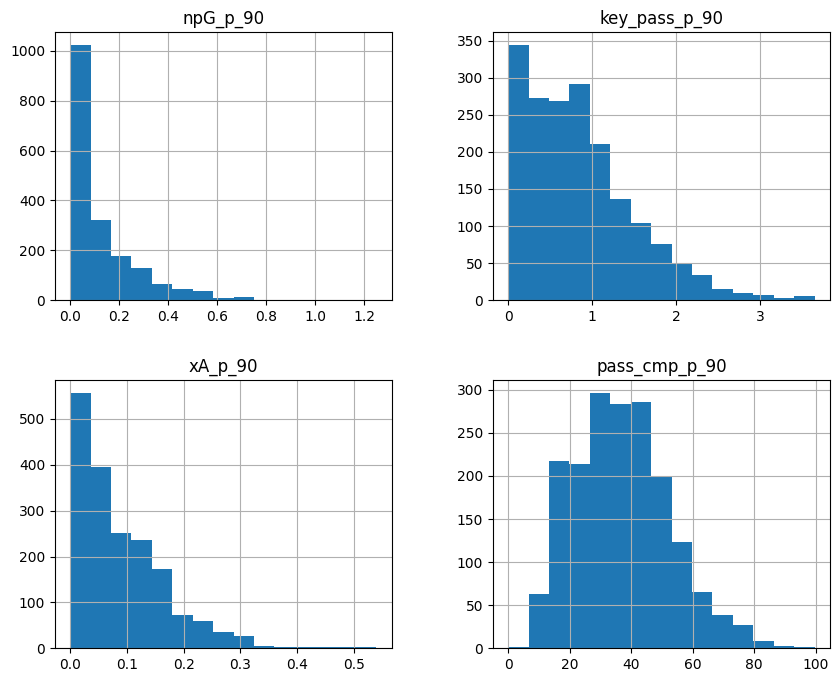

In [233]:
data_subset.hist(bins=15, figsize=(10, 8))
plt.show()

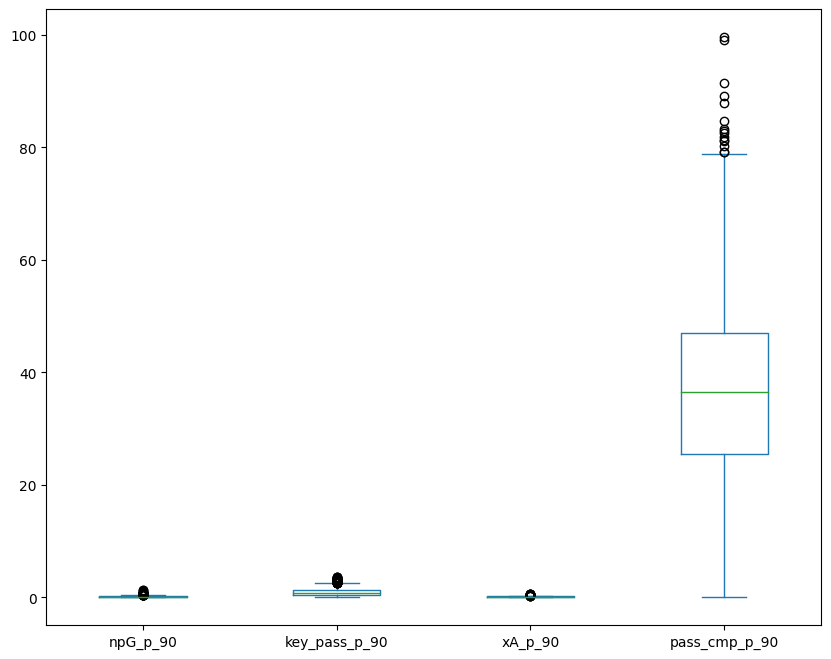

In [234]:
data_subset.plot(kind='box', figsize=(10, 8))
plt.show()

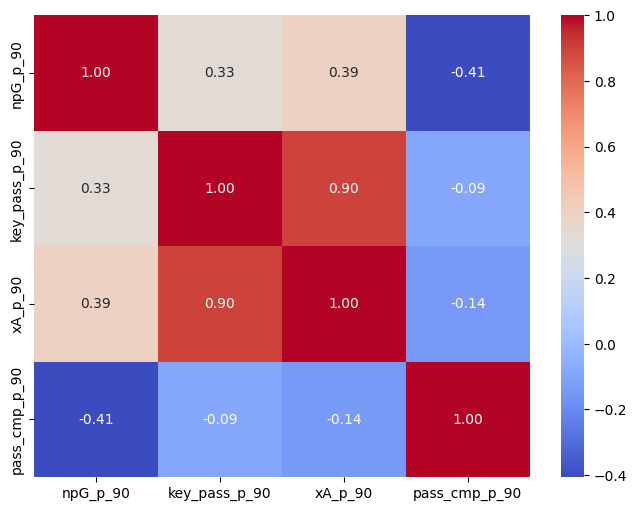

In [21]:
plt.figure(figsize=(8, 6))
sns.heatmap(data_subset.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

# **1st Selection**

In [22]:
first_p_90 = [
    "player", "assists_p_90", "npG_p_90", "xA_p_90",
    "npxG_p_90","shots_p_90", "shot_on_target_pct", "goals_p_shot",
    "npxG_p_shot", "pass_cmp_p_90", "pass_cmp_pct", "short_cmp_p_90",
    "med_cmp_p_90", "long_cmp_p_90", "key_pass_p_90", "pass_final_3rd_p_90",
    "prog_pass_p_90",  "cross_box_p_90", "through_ball_cmp_p_90", "switches_p_90",
    "crosses_p_90", "intercepted_pass_p_90", "blocked_pass_p_90", "sca_dribble_p_90",
    "sca_shot_p_90", "sca_live_pass_p_90","sca_def_p_90", "gca_live_pass_p_90",
    "gca_dribble_p_90", "gca_shot_p_90", "gca_def_p_90", "tackle_won_p_90",
    "def_3rd_tackle_p_90", "mid_3rd_tackle_p_90", "att_3rd_tackle_p_90",
    "dribblers_tackled_p_90", "success_press_p_90", "def_3rd_press_p_90",
    "mid_3rd_press_p_90", "att_3rd_press_p_90", "blocks_p_90", "intercepts_p_90",
    "clearances_p_90", "pct_touch_def_3rd", "pct_touch_mid_3rd",
    "pct_touch_att_3rd", "success_dribble_p_90", "players_dribble_past_p_90",
    "carry_p_90","prog_carry_p_90","disposs_p_90"
]


In [23]:
first_p_90_data = data_outfield[first_p_90]

In [24]:
first_p_90_data.dtypes

player                        object
assists_p_90                 float64
npG_p_90                     float64
xA_p_90                      float64
npxG_p_90                    float64
shots_p_90                   float64
shot_on_target_pct           float64
goals_p_shot                 float64
npxG_p_shot                  float64
pass_cmp_p_90                float64
pass_cmp_pct                 float64
short_cmp_p_90               float64
med_cmp_p_90                 float64
long_cmp_p_90                float64
key_pass_p_90                float64
pass_final_3rd_p_90          float64
prog_pass_p_90               float64
cross_box_p_90               float64
through_ball_cmp_p_90        float64
switches_p_90                float64
crosses_p_90                 float64
intercepted_pass_p_90        float64
blocked_pass_p_90            float64
sca_dribble_p_90             float64
sca_shot_p_90                float64
sca_live_pass_p_90           float64
sca_def_p_90                 float64
g

In [25]:
first_p_90_data

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,intercepts_p_90,clearances_p_90,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90
0,Aaron Connolly,0.11,0.23,0.02,0.40,2.61,34.8,0.09,0.15,8.98,...,0.00,0.11,7.0,42.0,58.0,0.91,0.91,14.1,1.93,1.70
1,Aaron Cresswell,0.23,0.00,0.17,0.03,0.54,21.1,0.00,0.05,43.80,...,1.02,2.81,33.0,46.0,26.0,0.17,0.23,36.0,2.76,0.26
2,Aaron Hickey,0.00,0.00,0.04,0.01,0.36,33.3,0.00,0.03,40.40,...,1.43,1.79,32.0,49.0,27.0,0.95,1.19,38.3,4.05,1.55
3,Aaron Leya Iseka,0.00,0.18,0.06,0.21,1.61,33.3,0.11,0.13,13.50,...,0.18,0.36,10.0,56.0,40.0,1.25,1.43,18.3,2.68,1.79
4,Aarón Martín,0.18,0.00,0.07,0.01,0.35,16.7,0.00,0.03,40.40,...,0.99,2.92,30.0,49.0,26.0,0.88,0.88,36.9,4.74,0.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0.00,0.03,0.03,0.04,1.21,7.1,0.02,0.03,42.20,...,1.73,1.94,28.0,58.0,22.0,1.45,1.53,42.5,4.54,0.90
1823,Zaydou Youssouf,0.07,0.07,0.05,0.06,1.09,26.7,0.07,0.06,28.60,...,1.61,0.95,31.0,57.0,18.0,1.75,1.75,36.1,2.41,2.26
1824,Zeki Çelik,0.08,0.11,0.10,0.03,0.60,37.5,0.19,0.05,49.40,...,1.25,2.64,27.0,54.0,25.0,1.06,1.17,45.1,6.30,0.75
1825,Zinedine Ferhat,0.30,0.15,0.18,0.13,1.85,36.1,0.08,0.07,25.00,...,1.03,1.06,15.0,44.0,48.0,1.95,2.22,35.6,4.53,2.07


In [26]:
numeric_data = first_p_90_data.drop('player', axis=1)

In [27]:
for col in numeric_data:
    numeric_data[col] = first_p_90_data[col] / first_p_90_data[col].max()

In [28]:
first_p_90_data

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,intercepts_p_90,clearances_p_90,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90
0,Aaron Connolly,0.11,0.23,0.02,0.40,2.61,34.8,0.09,0.15,8.98,...,0.00,0.11,7.0,42.0,58.0,0.91,0.91,14.1,1.93,1.70
1,Aaron Cresswell,0.23,0.00,0.17,0.03,0.54,21.1,0.00,0.05,43.80,...,1.02,2.81,33.0,46.0,26.0,0.17,0.23,36.0,2.76,0.26
2,Aaron Hickey,0.00,0.00,0.04,0.01,0.36,33.3,0.00,0.03,40.40,...,1.43,1.79,32.0,49.0,27.0,0.95,1.19,38.3,4.05,1.55
3,Aaron Leya Iseka,0.00,0.18,0.06,0.21,1.61,33.3,0.11,0.13,13.50,...,0.18,0.36,10.0,56.0,40.0,1.25,1.43,18.3,2.68,1.79
4,Aarón Martín,0.18,0.00,0.07,0.01,0.35,16.7,0.00,0.03,40.40,...,0.99,2.92,30.0,49.0,26.0,0.88,0.88,36.9,4.74,0.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0.00,0.03,0.03,0.04,1.21,7.1,0.02,0.03,42.20,...,1.73,1.94,28.0,58.0,22.0,1.45,1.53,42.5,4.54,0.90
1823,Zaydou Youssouf,0.07,0.07,0.05,0.06,1.09,26.7,0.07,0.06,28.60,...,1.61,0.95,31.0,57.0,18.0,1.75,1.75,36.1,2.41,2.26
1824,Zeki Çelik,0.08,0.11,0.10,0.03,0.60,37.5,0.19,0.05,49.40,...,1.25,2.64,27.0,54.0,25.0,1.06,1.17,45.1,6.30,0.75
1825,Zinedine Ferhat,0.30,0.15,0.18,0.13,1.85,36.1,0.08,0.07,25.00,...,1.03,1.06,15.0,44.0,48.0,1.95,2.22,35.6,4.53,2.07


In [29]:
numeric_data

,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,pass_cmp_pct,...,intercepts_p_90,clearances_p_90,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90
0,0.144737,0.184,0.037037,0.444444,0.461947,0.348,0.09,0.312500,0.090161,0.812890,...,0.000000,0.010891,0.097222,0.560000,0.816901,0.147249,0.133431,0.147335,0.125325,0.340
1,0.302632,0.000,0.314815,0.033333,0.095575,0.211,0.00,0.104167,0.439759,0.777547,...,0.296512,0.278218,0.458333,0.613333,0.366197,0.027508,0.033724,0.376176,0.179221,0.052
2,0.000000,0.000,0.074074,0.011111,0.063717,0.333,0.00,0.062500,0.405622,0.872141,...,0.415698,0.177228,0.444444,0.653333,0.380282,0.153722,0.174487,0.400209,0.262987,0.310
3,0.000000,0.144,0.111111,0.233333,0.284956,0.333,0.11,0.270833,0.135542,0.788981,...,0.052326,0.035644,0.138889,0.746667,0.563380,0.202265,0.209677,0.191223,0.174026,0.358
4,0.236842,0.000,0.129630,0.011111,0.061947,0.167,0.00,0.062500,0.405622,0.833680,...,0.287791,0.289109,0.416667,0.653333,0.366197,0.142395,0.129032,0.385580,0.307792,0.128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,0.000000,0.024,0.055556,0.044444,0.214159,0.071,0.02,0.062500,0.423695,0.906445,...,0.502907,0.192079,0.388889,0.773333,0.309859,0.234628,0.224340,0.444096,0.294805,0.180
1823,0.092105,0.056,0.092593,0.066667,0.192920,0.267,0.07,0.125000,0.287149,0.811850,...,0.468023,0.094059,0.430556,0.760000,0.253521,0.283172,0.256598,0.377220,0.156494,0.452
1824,0.105263,0.088,0.185185,0.033333,0.106195,0.375,0.19,0.104167,0.495984,0.820166,...,0.363372,0.261386,0.375000,0.720000,0.352113,0.171521,0.171554,0.471264,0.409091,0.150
1825,0.394737,0.120,0.333333,0.144444,0.327434,0.361,0.08,0.145833,0.251004,0.689189,...,0.299419,0.104950,0.208333,0.586667,0.676056,0.315534,0.325513,0.371996,0.294156,0.414


In [30]:
scaler = MinMaxScaler(feature_range=(0, 1))
minmax_scaled_features = scaler.fit_transform(numeric_data)

In [31]:
minmax_scaled_features

array([[0.14473684, 0.184     , 0.03703704, ..., 0.14733542, 0.12532468,
        0.34      ],
       [0.30263158, 0.        , 0.31481481, ..., 0.37617555, 0.17922078,
        0.052     ],
       [0.        , 0.        , 0.07407407, ..., 0.40020899, 0.26298701,
        0.31      ],
       ...,
       [0.10526316, 0.088     , 0.18518519, ..., 0.47126437, 0.40909091,
        0.15      ],
       [0.39473684, 0.12      , 0.33333333, ..., 0.37199582, 0.29415584,
        0.414     ],
       [0.15789474, 0.576     , 0.16666667, ..., 0.27168234, 0.25454545,
        0.228     ]])

In [32]:
scaler = StandardScaler()
stsc_scaled_features = scaler.fit_transform(numeric_data)

In [33]:
stsc_scaled_features

array([[ 1.58730885e-01,  7.12684457e-01, -8.75577953e-01, ...,
        -1.85306558e+00, -1.01090277e+00,  6.23968730e-01],
       [ 1.28240409e+00, -7.83205332e-01,  9.96561690e-01, ...,
        -4.30923390e-02, -6.33771808e-01, -1.06772612e+00],
       [-8.71302886e-01, -7.83205332e-01, -6.25959334e-01, ...,
         1.46996174e-01, -4.76285107e-02,  4.47750516e-01],
       ...,
       [-1.22187416e-01, -6.77797806e-02,  1.22896523e-01, ...,
         7.08996997e-01,  9.74714449e-01, -4.92079959e-01],
       [ 1.93788012e+00,  1.92374965e-01,  1.12137100e+00, ...,
        -7.61512109e-02,  1.70471321e-01,  1.05864032e+00],
       [ 2.52370318e-01,  3.89958010e+00, -1.91278635e-03, ...,
        -8.69564137e-01, -1.06697215e-01, -3.39126021e-02]])

In [34]:
X=numeric_data

In [35]:
X_minmax=minmax_scaled_features

In [36]:
X_STSC=stsc_scaled_features

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

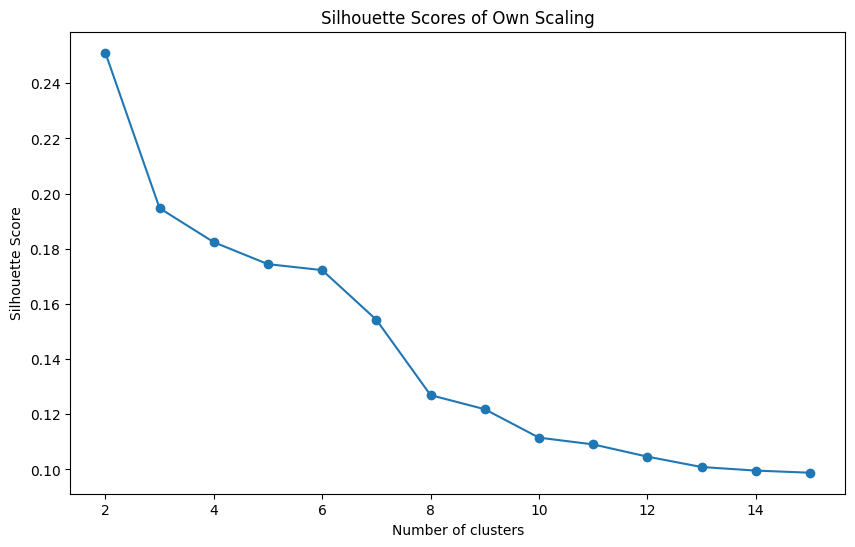

In [37]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    score = silhouette_score(X, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores of Own Scaling')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

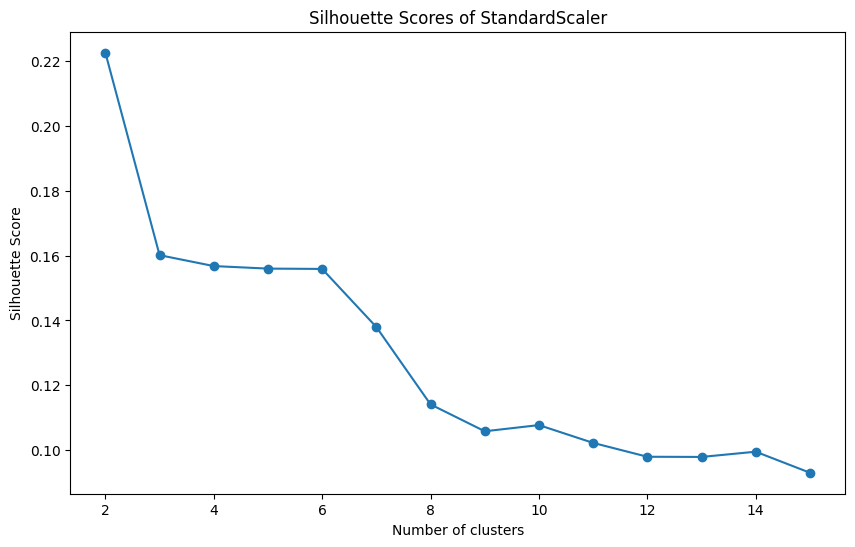

In [38]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_STSC)
    score = silhouette_score(X_STSC, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores of StandardScaler')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

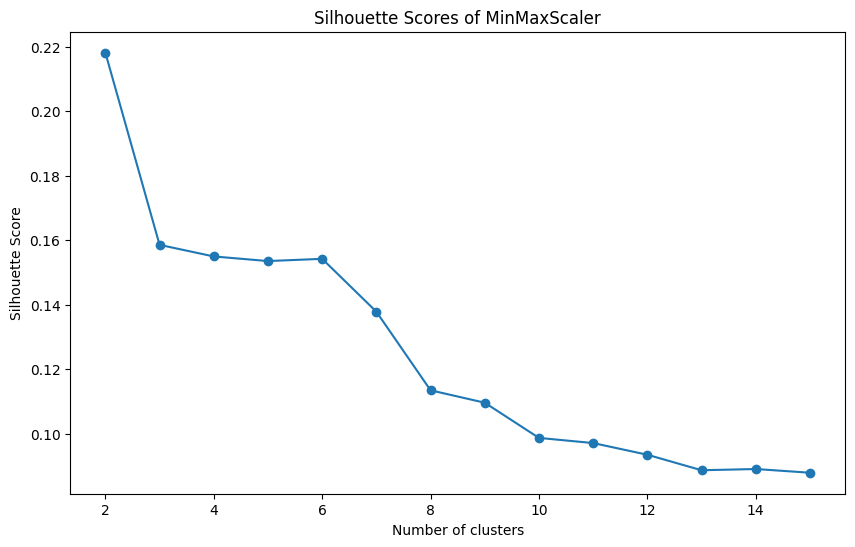

In [39]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_minmax)
    score = silhouette_score(X_STSC, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores of MinMaxScaler')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [40]:
kmeans = KMeans(n_clusters=15, random_state=42)
kmeans.fit(X)
first_p_90_data['cluster'] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-40-77dfa51ff1d9>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_p_90_data['cluster'] = kmeans.labels_


In [41]:
first_p_90_data.head()

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,clearances_p_90,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90,cluster
0,Aaron Connolly,0.11,0.23,0.02,0.40,2.61,34.8,0.09,0.15,8.98,...,0.11,7.0,42.0,58.0,0.91,0.91,14.1,1.93,1.70,2
1,Aaron Cresswell,0.23,0.00,0.17,0.03,0.54,21.1,0.00,0.05,43.80,...,2.81,33.0,46.0,26.0,0.17,0.23,36.0,2.76,0.26,7
2,Aaron Hickey,0.00,0.00,0.04,0.01,0.36,33.3,0.00,0.03,40.40,...,1.79,32.0,49.0,27.0,0.95,1.19,38.3,4.05,1.55,4
3,Aaron Leya Iseka,0.00,0.18,0.06,0.21,1.61,33.3,0.11,0.13,13.50,...,0.36,10.0,56.0,40.0,1.25,1.43,18.3,2.68,1.79,2
4,Aarón Martín,0.18,0.00,0.07,0.01,0.35,16.7,0.00,0.03,40.40,...,2.92,30.0,49.0,26.0,0.88,0.88,36.9,4.74,0.64,4


In [42]:
first_p_90_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=numeric_data.columns)
print(first_p_90_cluster_centers)

    assists_p_90  npG_p_90   xA_p_90  npxG_p_90  shots_p_90  \
0       0.298379  0.133980  0.378601   0.180022    0.315473   
1       0.031699  0.038000  0.036476   0.049747    0.090359   
2       0.112988  0.269419  0.164875   0.388961    0.410071   
3       0.202408  0.141021  0.286052   0.200827    0.350857   
4       0.047866  0.028627  0.083884   0.045646    0.104214   
5       0.018517  0.028742  0.024268   0.045341    0.078047   
6       0.129520  0.030367  0.170194   0.042630    0.106399   
7       0.199682  0.056703  0.286528   0.087912    0.172985   
8       0.148246  0.145000  0.190741   0.227037    0.310737   
9       0.111890  0.086307  0.177886   0.129603    0.235825   
10      0.060673  0.024356  0.086008   0.032099    0.076146   
11      0.262878  0.337277  0.326044   0.421868    0.502316   
12      0.139505  0.044530  0.188755   0.078447    0.180041   
13      0.070489  0.034929  0.099702   0.057242    0.136536   
14      0.500000  0.248400  0.629167   0.318056    0.51

In [43]:
print(first_p_90_data['cluster'].value_counts())

cluster
5     248
4     185
2     155
6     147
9     137
1     132
8     120
13    112
0      99
3      94
11     94
7      91
10     90
12     83
14     40
Name: count, dtype: int64


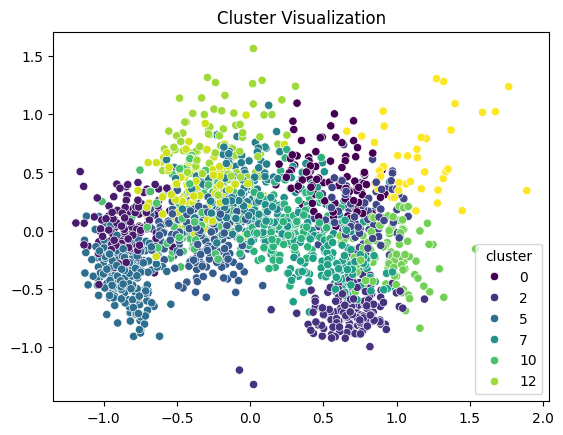

In [44]:
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X)

sns.scatterplot(x=principal_components[:,0], y=principal_components[:,1], hue=first_p_90_data['cluster'], palette='viridis')
plt.title('Cluster Visualization')
plt.show()

In [45]:
examples_per_cluster = first_p_90_data.groupby('cluster').apply(lambda x: x.sample(n=2)).reset_index(drop=True)
print(examples_per_cluster[['player','cluster']])

                 player  cluster
0          José Campaña        0
1         Lucas Vázquez        0
2          Sergio Ramos        1
3                Danilo        1
4         Danny Welbeck        2
5   Sebastian Andersson        2
6         Marco Richter        3
7        Sofiane Boufal        3
8           Manu García        4
9           Lucas Torró        4
10         Nehuén Pérez        5
11        Néstor Araújo        5
12  Marvin Plattenhardt        6
13      Sergio Reguilón        6
14      Fabián Orellana        7
15                Salvi        7
16      Sergi Guardiola        8
17       Emmanuel Gyasi        8
18        Morgan Sanson        9
19              Hernani        9
20         Hiroki Sakai       10
21           Luis Pérez       10
22         Duván Zapata       11
23    Francisco Trincão       11
24           Toni Kroos       12
25                 Fred       12
26               Otávio       13
27     Christoph Kramer       13
28   Callum Hudson-Odoi       14
29        

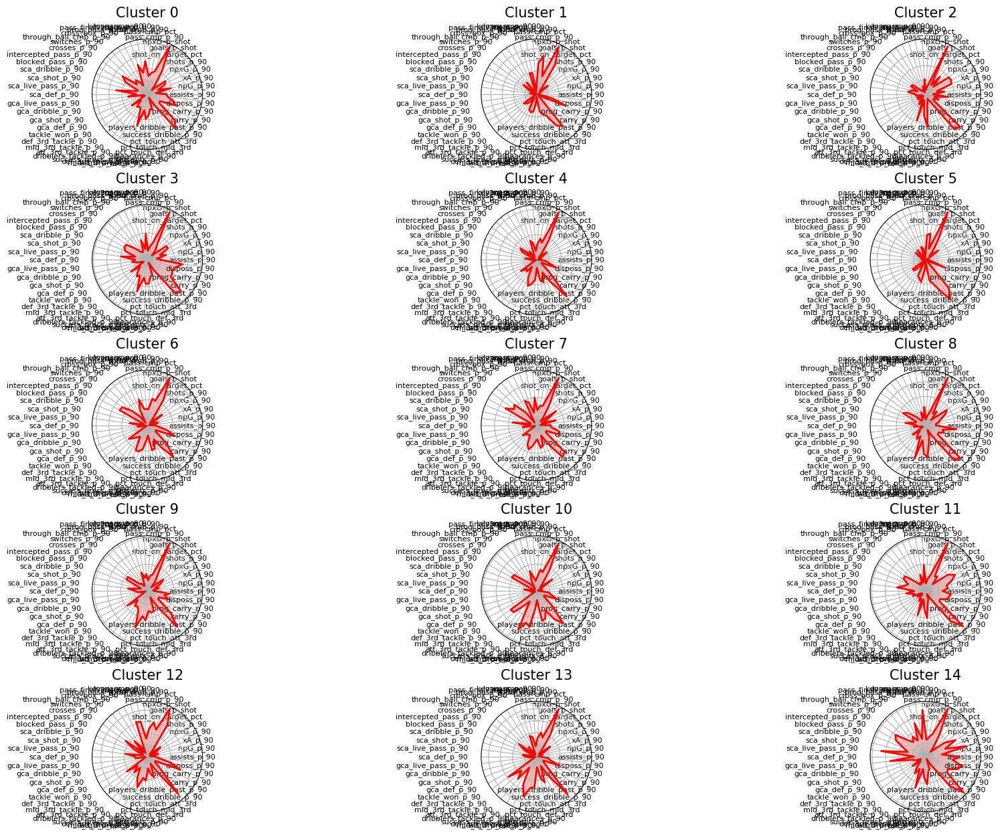

In [46]:
def make_radar_chart(ax, stats, feature_names, num_vars):

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]

    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=8, rotation=45, ha="right")

num_clusters = 15
feature_names = first_p_90_cluster_centers.columns.tolist()
num_vars = len(feature_names)

fig, axes = plt.subplots(nrows=5, ncols=3, subplot_kw=dict(polar=True), figsize=(20, 15))
fig.subplots_adjust(hspace=0.5, wspace=0.5)


for i, ax in enumerate(axes.flatten()[:num_clusters]):
    make_radar_chart(ax, first_p_90_cluster_centers.iloc[i].values.tolist(), feature_names, num_vars)
    ax.set_title(f'Cluster {i}', size=15, position=(0.5, 1.1))

for j in range(num_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()

# **1st Category**

In [47]:
categories = {
    "G/A": ["assists_p_90", "npG_p_90"],
    "xG/xA": ["xA_p_90", "npxG_p_90"],
    "Shooting": [
        "shots_p_90", "shot_on_target_pct", "goals_p_shot",
        "npxG_p_shot", "sca_shot_p_90", "gca_shot_p_90"
    ],
    "Passing": [
        "pass_cmp_p_90", "pass_cmp_pct", "short_cmp_p_90", "med_cmp_p_90",
        "long_cmp_p_90", "sca_live_pass_p_90", "gca_live_pass_p_90"
    ],
    "Progressive Passing": [
        "key_pass_p_90", "pass_final_3rd_p_90", "prog_pass_p_90",
        "through_ball_cmp_p_90"
    ],
    "High Balls": [
        "cross_box_p_90", "switches_p_90", "crosses_p_90"
    ],
    "Giveaway": [
        "intercepted_pass_p_90", "blocked_pass_p_90", "disposs_p_90"
    ],
    "Dribbling": [
        "sca_dribble_p_90", "gca_dribble_p_90", "success_dribble_p_90",
        "players_dribble_past_p_90"
    ],
    "Defending": [
        "sca_def_p_90", "gca_def_p_90", "blocks_p_90", "intercepts_p_90",
        "clearances_p_90"
    ],
    "1v1 Defending": [
        "tackle_won_p_90", "dribblers_tackled_p_90"
    ],
    "Defensive 3rd": [
        "def_3rd_tackle_p_90", "def_3rd_press_p_90", "pct_touch_def_3rd"
    ],
    "Middle 3rd": [
        "mid_3rd_tackle_p_90", "mid_3rd_press_p_90", "pct_touch_mid_3rd"
    ],
    "Attacking 3rd": [
        "att_3rd_tackle_p_90", "att_3rd_press_p_90", "pct_touch_att_3rd"
    ],
    "Carry": [
        "carry_p_90", "prog_carry_p_90"
    ],
    "Pressing": [
        "success_press_p_90"
    ]
}


In [48]:
first_clustered_data=pd.DataFrame(index=first_p_90_data['cluster'].unique())

In [49]:
for category, features in categories.items():
    first_clustered_data[category] = first_p_90_data.groupby('cluster')[features].mean().mean(axis=1)

In [50]:
for category in categories:
    first_clustered_data[category] = first_clustered_data[category] / first_clustered_data[category].max()

In [51]:
first_clustered_data.reset_index(inplace=True)
first_clustered_data.rename(columns={"index": "cluster"}, inplace=True)

In [52]:
first_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
0,2,0.612086,0.701433,0.967173,0.468022,0.195995,0.163234,0.555618,0.310879,0.205756,0.196305,0.158105,0.739377,0.870686,0.323486,0.556250
1,7,0.322429,0.373556,0.810985,0.655172,0.486759,1.000000,0.751237,0.375954,0.490748,0.472767,0.450161,0.672788,0.690545,0.616230,0.521844
2,4,0.104507,0.137985,0.468821,0.713032,0.466478,0.369131,0.469596,0.216164,0.591364,0.547725,0.573551,0.869047,0.345983,0.554018,0.629590
3,0,0.570952,0.585407,0.835072,0.768035,0.747693,0.695808,0.800954,0.530285,0.309815,0.504062,0.285800,0.826782,0.753183,0.802768,0.746429
4,6,0.197530,0.208102,0.653123,0.802361,0.564953,0.744898,0.749547,0.345810,0.641245,0.690933,0.567168,0.727165,0.513964,0.733325,0.617176
5,1,0.103680,0.102987,0.578941,0.972356,0.582940,0.372665,0.304582,0.111711,0.798780,0.509842,0.835140,0.795045,0.104247,0.876354,0.475712
6,3,0.478069,0.535484,0.834567,0.602102,0.443245,0.559942,0.926925,1.000000,0.299611,0.512513,0.283131,0.748689,0.878736,0.696039,0.706809
7,8,0.425658,0.490948,0.865274,0.499545,0.284645,0.354886,0.769481,0.480303,0.292069,0.354130,0.262473,0.754700,0.866590,0.463129,0.693702
8,9,0.279391,0.339778,0.704049,0.620951,0.430472,0.411935,0.728681,0.453425,0.434945,0.633265,0.410927,0.850165,0.641276,0.567635,0.824560
9,5,0.072411,0.086120,0.600566,0.748692,0.313031,0.278354,0.224396,0.077027,1.000000,0.486424,1.000000,0.667168,0.073615,0.539286,0.476894


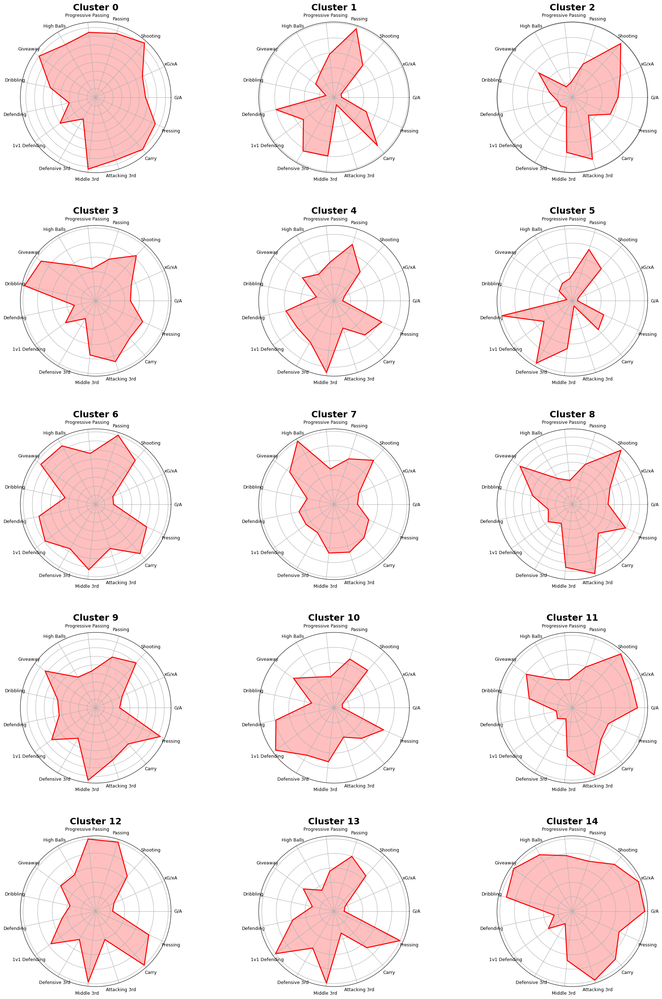

In [53]:
import matplotlib.pyplot as plt
import numpy as np

def make_radar_chart(ax, stats, feature_names, num_vars, max_val):
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]
    stats = [s / max_val for s in stats]
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=9, rotation=45, ha="center")

first_clustered_data = first_clustered_data.sort_values('cluster')
clusters = first_clustered_data['cluster'].unique()
feature_names =first_clustered_data.columns[1:]
num_vars = len(feature_names)
max_val = first_clustered_data[feature_names].max().max()

n_clusters = len(clusters)
n_cols = 3
n_rows = (n_clusters // n_cols) + (n_clusters % n_cols > 0)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, subplot_kw=dict(polar=True), figsize=(25, n_rows * 7))
fig.subplots_adjust(hspace=0.35, wspace=0.1)

for i, cluster_label in enumerate(clusters):
    ax = axes.flatten()[i]
    cluster_data = first_clustered_data[first_clustered_data['cluster'] == cluster_label]
    stats = cluster_data.mean().drop('cluster').tolist()
    make_radar_chart(ax, stats, feature_names, num_vars, max_val)
    ax.set_title(f'Cluster {cluster_label}', size=18, fontweight='bold', position=(0.5, 100))

for j in range(n_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()


In [54]:
players_in_cluster_3 = first_p_90_data[first_p_90_data['cluster'] == 0]['player']

players_in_cluster_3.head(30)

5             Aaron Ramsey
23          Adil Aouchiche
24           Admir Mehmedi
118        Andreas Pereira
134         Angelo Fulgini
146       Antonin Bobichon
178           Aymen Barkok
194    Benjamin Bourigeaud
201         Bernardo Silva
202         Bersant Celina
241           Carles Aleñá
269      Christian Eriksen
286        Clément Grenier
306          Daichi Kamada
319              Dani Olmo
321           Daniel Bessa
325          Daniel Didavi
355            David Silva
375          Dennis Geiger
392          Dimitri Payet
438        Emanuel Vignato
442       Emile Smith Rowe
449            Enis Bardhi
488          Farid Boulaya
498      Federico Valverde
517           Flavien Tait
527        Florian Thauvin
528          Florian Wirtz
547            Gaël Kakuta
557         Gastón Ramírez
Name: player, dtype: object

# **2nd Selection**

In [55]:
first_full = ['player',
    "assists", "npG", "xA", "npxG", "shots", "shot_on_target_pct", "goals_p_shot",
    "npxG_p_shot", "pass_cmp", "pass_cmp_pct", "short_cmp", "med_cmp",
    "long_cmp", "key_pass", "pass_final_3rd", "prog_pass", "cross_box", "through_ball_cmp",
    "switches", "crosses", "intercepted_pass", "blocked_pass", "sca_dribble", "sca_shot",
    "sca_live_pass", "sca_def", "gca_live_pass", "gca_dribble", "gca_shot", "gca_def",
    "tackle_won", "def_3rd_tackle", "mid_3rd_tackle", "att_3rd_tackle", "dribblers_tackled",
    "success_press", "def_3rd_press", "mid_3rd_press", "att_3rd_press", "blocks",
    "intercepts", "clearances", "pct_touch_def_3rd", "pct_touch_mid_3rd", "pct_touch_att_3rd",
    "success_dribble", "players_dribble_past", "carry", "prog_carry", "disposs"
]



In [56]:
first_full_data = data_outfield[first_full]

In [57]:
first_full_data.dtypes

player                   object
assists                   int64
npG                       int64
xA                      float64
npxG                    float64
shots                     int64
shot_on_target_pct      float64
goals_p_shot            float64
npxG_p_shot             float64
pass_cmp                  int64
pass_cmp_pct            float64
short_cmp                 int64
med_cmp                   int64
long_cmp                  int64
key_pass                  int64
pass_final_3rd            int64
prog_pass                 int64
cross_box                 int64
through_ball_cmp          int64
switches                  int64
crosses                   int64
intercepted_pass          int64
blocked_pass              int64
sca_dribble               int64
sca_shot                  int64
sca_live_pass             int64
sca_def                   int64
gca_live_pass             int64
gca_dribble               int64
gca_shot                  int64
gca_def                   int64
tackle_w

In [58]:
first_full_data

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,intercepts,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,Aaron Connolly,1,2,0.2,3.5,23,34.8,0.09,0.15,79,...,0,1,7.0,42.0,58.0,8,8,124,17,15
1,Aaron Cresswell,8,0,6.0,1.1,19,21.1,0.00,0.05,1542,...,36,99,33.0,46.0,26.0,6,8,1267,97,9
2,Aaron Hickey,0,0,0.3,0.1,3,33.3,0.00,0.03,339,...,12,15,32.0,49.0,27.0,8,10,322,34,13
3,Aaron Leya Iseka,0,2,0.7,2.4,18,33.3,0.11,0.13,151,...,2,4,10.0,56.0,40.0,14,16,205,30,20
4,Aarón Martín,3,0,1.2,0.2,6,16.7,0.00,0.03,691,...,17,50,30.0,49.0,26.0,15,15,631,81,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0,1,1.0,1.4,42,7.1,0.02,0.03,1460,...,60,67,28.0,58.0,22.0,50,53,1470,157,31
1823,Zaydou Youssouf,1,1,0.7,0.8,15,26.7,0.07,0.06,392,...,22,13,31.0,57.0,18.0,24,24,495,33,31
1824,Zeki Çelik,2,3,2.7,0.8,16,37.5,0.19,0.05,1309,...,33,70,27.0,54.0,25.0,28,31,1195,167,20
1825,Zinedine Ferhat,10,5,5.9,4.3,61,36.1,0.08,0.07,822,...,34,35,15.0,44.0,48.0,64,73,1171,149,68


In [59]:
numeric_data = first_full_data.drop('player', axis=1)

In [60]:
for col in numeric_data:
    numeric_data[col] = first_full_data[col] / first_full_data[col].max()

In [61]:
first_full_data

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,intercepts,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,Aaron Connolly,1,2,0.2,3.5,23,34.8,0.09,0.15,79,...,0,1,7.0,42.0,58.0,8,8,124,17,15
1,Aaron Cresswell,8,0,6.0,1.1,19,21.1,0.00,0.05,1542,...,36,99,33.0,46.0,26.0,6,8,1267,97,9
2,Aaron Hickey,0,0,0.3,0.1,3,33.3,0.00,0.03,339,...,12,15,32.0,49.0,27.0,8,10,322,34,13
3,Aaron Leya Iseka,0,2,0.7,2.4,18,33.3,0.11,0.13,151,...,2,4,10.0,56.0,40.0,14,16,205,30,20
4,Aarón Martín,3,0,1.2,0.2,6,16.7,0.00,0.03,691,...,17,50,30.0,49.0,26.0,15,15,631,81,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0,1,1.0,1.4,42,7.1,0.02,0.03,1460,...,60,67,28.0,58.0,22.0,50,53,1470,157,31
1823,Zaydou Youssouf,1,1,0.7,0.8,15,26.7,0.07,0.06,392,...,22,13,31.0,57.0,18.0,24,24,495,33,31
1824,Zeki Çelik,2,3,2.7,0.8,16,37.5,0.19,0.05,1309,...,33,70,27.0,54.0,25.0,28,31,1195,167,20
1825,Zinedine Ferhat,10,5,5.9,4.3,61,36.1,0.08,0.07,822,...,34,35,15.0,44.0,48.0,64,73,1171,149,68


In [62]:
numeric_data

,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,pass_cmp_pct,...,intercepts,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,0.052632,0.060606,0.014599,0.142276,0.121053,0.348,0.09,0.312500,0.029610,0.812890,...,0.000000,0.003745,0.097222,0.560000,0.816901,0.05000,0.046243,0.050966,0.032882,0.141509
1,0.421053,0.000000,0.437956,0.044715,0.100000,0.211,0.00,0.104167,0.577961,0.777547,...,0.395604,0.370787,0.458333,0.613333,0.366197,0.03750,0.046243,0.520756,0.187621,0.084906
2,0.000000,0.000000,0.021898,0.004065,0.015789,0.333,0.00,0.062500,0.127061,0.872141,...,0.131868,0.056180,0.444444,0.653333,0.380282,0.05000,0.057803,0.132347,0.065764,0.122642
3,0.000000,0.060606,0.051095,0.097561,0.094737,0.333,0.11,0.270833,0.056597,0.788981,...,0.021978,0.014981,0.138889,0.746667,0.563380,0.08750,0.092486,0.084258,0.058027,0.188679
4,0.157895,0.000000,0.087591,0.008130,0.031579,0.167,0.00,0.062500,0.258996,0.833680,...,0.186813,0.187266,0.416667,0.653333,0.366197,0.09375,0.086705,0.259351,0.156673,0.103774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,0.000000,0.030303,0.072993,0.056911,0.221053,0.071,0.02,0.062500,0.547226,0.906445,...,0.659341,0.250936,0.388889,0.773333,0.309859,0.31250,0.306358,0.604192,0.303675,0.292453
1823,0.052632,0.030303,0.051095,0.032520,0.078947,0.267,0.07,0.125000,0.146927,0.811850,...,0.241758,0.048689,0.430556,0.760000,0.253521,0.15000,0.138728,0.203453,0.063830,0.292453
1824,0.105263,0.090909,0.197080,0.032520,0.084211,0.375,0.19,0.104167,0.490630,0.820166,...,0.362637,0.262172,0.375000,0.720000,0.352113,0.17500,0.179191,0.491163,0.323017,0.188679
1825,0.526316,0.151515,0.430657,0.174797,0.321053,0.361,0.08,0.145833,0.308096,0.689189,...,0.373626,0.131086,0.208333,0.586667,0.676056,0.40000,0.421965,0.481299,0.288201,0.641509


In [63]:
scaler = MinMaxScaler(feature_range=(0, 1))
minmax_scaled_features = scaler.fit_transform(numeric_data)

In [64]:
minmax_scaled_features

array([[0.05263158, 0.06060606, 0.01459854, ..., 0.05096589, 0.03288201,
        0.14150943],
       [0.42105263, 0.        , 0.4379562 , ..., 0.52075627, 0.18762089,
        0.08490566],
       [0.        , 0.        , 0.02189781, ..., 0.1323469 , 0.06576402,
        0.12264151],
       ...,
       [0.10526316, 0.09090909, 0.19708029, ..., 0.49116317, 0.32301741,
        0.18867925],
       [0.52631579, 0.15151515, 0.43065693, ..., 0.48129881, 0.28820116,
        0.64150943],
       [0.10526316, 0.36363636, 0.10948905, ..., 0.17755857, 0.12572534,
        0.17924528]])

In [65]:
scaler = StandardScaler()
stsc_scaled_features = scaler.fit_transform(numeric_data)

In [66]:
stsc_scaled_features

array([[-0.35741616, -0.10271029, -0.84115169, ..., -1.42452918,
        -1.10397911, -0.3516178 ],
       [ 2.68180945, -0.7031957 ,  2.33651249, ...,  1.35689234,
         0.29202891, -0.68444176],
       [-0.79159125, -0.7031957 , -0.78636438, ..., -0.94270813,
        -0.80732741, -0.46255912],
       ...,
       [ 0.07675892,  0.19753242,  0.52853114, ...,  1.18168469,
         1.51353593, -0.0742645 ],
       [ 3.55015963,  0.79801784,  2.28172518, ...,  1.12328214,
         1.19943412,  2.58832721],
       [ 0.07675892,  2.8997168 , -0.12891662, ..., -0.67502977,
        -0.2663743 , -0.12973516]])

In [67]:
X=numeric_data

In [68]:
numeric_data

,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,pass_cmp_pct,...,intercepts,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,0.052632,0.060606,0.014599,0.142276,0.121053,0.348,0.09,0.312500,0.029610,0.812890,...,0.000000,0.003745,0.097222,0.560000,0.816901,0.05000,0.046243,0.050966,0.032882,0.141509
1,0.421053,0.000000,0.437956,0.044715,0.100000,0.211,0.00,0.104167,0.577961,0.777547,...,0.395604,0.370787,0.458333,0.613333,0.366197,0.03750,0.046243,0.520756,0.187621,0.084906
2,0.000000,0.000000,0.021898,0.004065,0.015789,0.333,0.00,0.062500,0.127061,0.872141,...,0.131868,0.056180,0.444444,0.653333,0.380282,0.05000,0.057803,0.132347,0.065764,0.122642
3,0.000000,0.060606,0.051095,0.097561,0.094737,0.333,0.11,0.270833,0.056597,0.788981,...,0.021978,0.014981,0.138889,0.746667,0.563380,0.08750,0.092486,0.084258,0.058027,0.188679
4,0.157895,0.000000,0.087591,0.008130,0.031579,0.167,0.00,0.062500,0.258996,0.833680,...,0.186813,0.187266,0.416667,0.653333,0.366197,0.09375,0.086705,0.259351,0.156673,0.103774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,0.000000,0.030303,0.072993,0.056911,0.221053,0.071,0.02,0.062500,0.547226,0.906445,...,0.659341,0.250936,0.388889,0.773333,0.309859,0.31250,0.306358,0.604192,0.303675,0.292453
1823,0.052632,0.030303,0.051095,0.032520,0.078947,0.267,0.07,0.125000,0.146927,0.811850,...,0.241758,0.048689,0.430556,0.760000,0.253521,0.15000,0.138728,0.203453,0.063830,0.292453
1824,0.105263,0.090909,0.197080,0.032520,0.084211,0.375,0.19,0.104167,0.490630,0.820166,...,0.362637,0.262172,0.375000,0.720000,0.352113,0.17500,0.179191,0.491163,0.323017,0.188679
1825,0.526316,0.151515,0.430657,0.174797,0.321053,0.361,0.08,0.145833,0.308096,0.689189,...,0.373626,0.131086,0.208333,0.586667,0.676056,0.40000,0.421965,0.481299,0.288201,0.641509


In [69]:
X_minmax=minmax_scaled_features

In [70]:
X_STSC=stsc_scaled_features

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

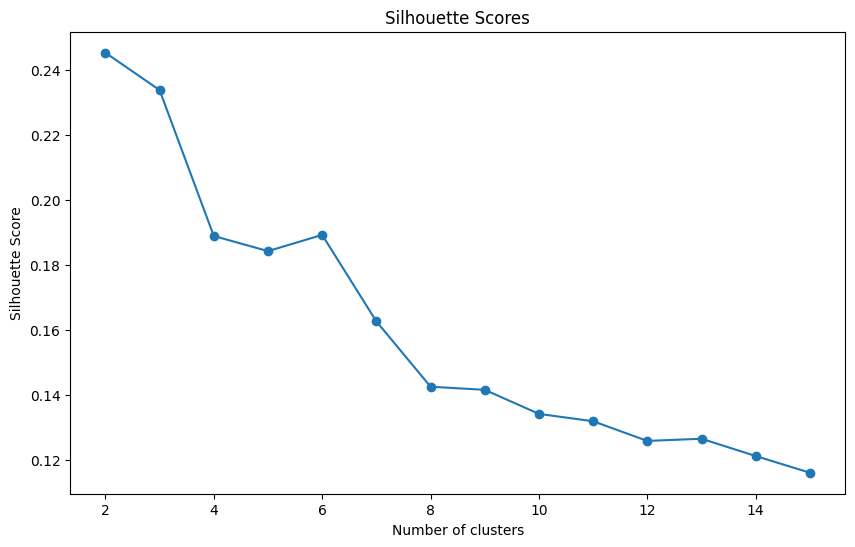

In [71]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    score = silhouette_score(X, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

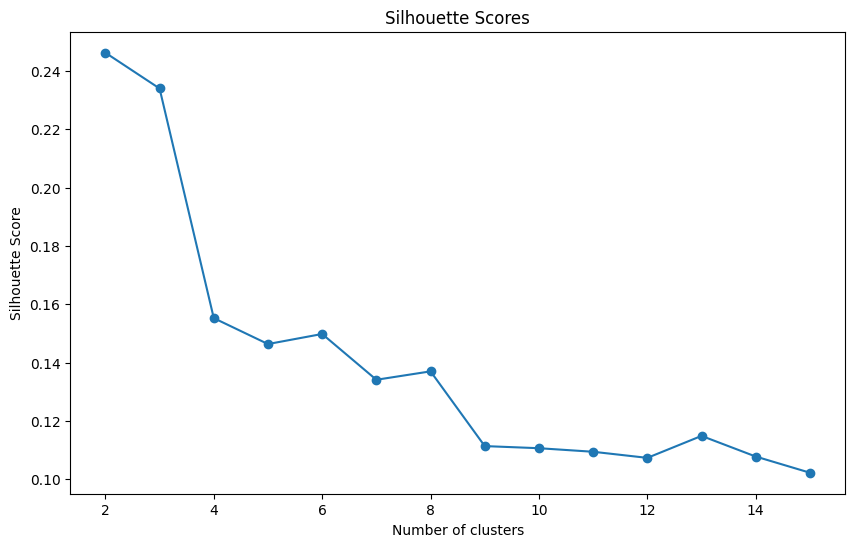

In [72]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_STSC)
    score = silhouette_score(X_STSC, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

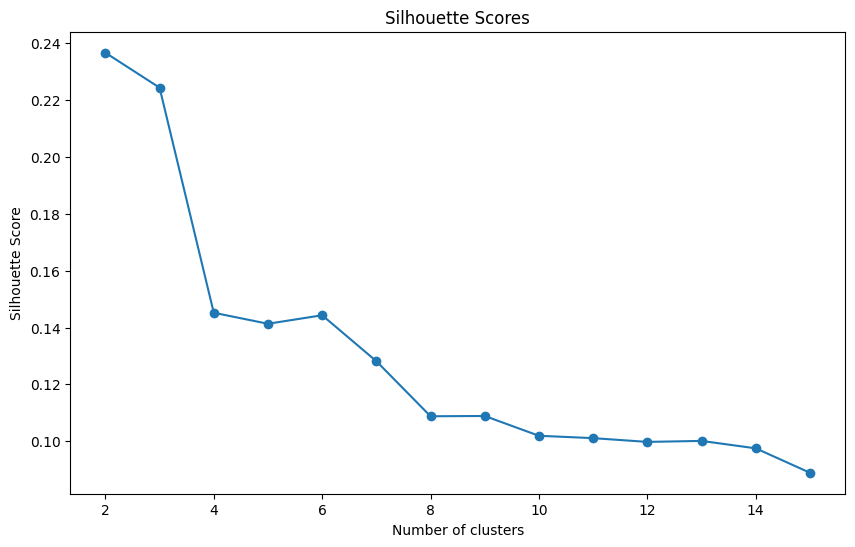

In [73]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_minmax)
    score = silhouette_score(X_STSC, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [74]:
kmeans = KMeans(n_clusters=15, random_state=42)
kmeans.fit(X)
first_full_data['cluster'] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-74-4cf656c8740a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_full_data['cluster'] = kmeans.labels_


In [75]:
first_full_data.head()

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs,cluster
0,Aaron Connolly,1,2,0.2,3.5,23,34.8,0.09,0.15,79,...,1,7.0,42.0,58.0,8,8,124,17,15,9
1,Aaron Cresswell,8,0,6.0,1.1,19,21.1,0.00,0.05,1542,...,99,33.0,46.0,26.0,6,8,1267,97,9,8
2,Aaron Hickey,0,0,0.3,0.1,3,33.3,0.00,0.03,339,...,15,32.0,49.0,27.0,8,10,322,34,13,1
3,Aaron Leya Iseka,0,2,0.7,2.4,18,33.3,0.11,0.13,151,...,4,10.0,56.0,40.0,14,16,205,30,20,9
4,Aarón Martín,3,0,1.2,0.2,6,16.7,0.00,0.03,691,...,50,30.0,49.0,26.0,15,15,631,81,11,11


In [76]:
first_full_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=numeric_data.columns)
print(first_full_cluster_centers)

     assists       npG        xA      npxG     shots  shot_on_target_pct  \
0   0.064404  0.031499  0.094410  0.048861  0.091101            0.268980   
1   0.023296  0.005796  0.041482  0.015927  0.033880            0.161022   
2   0.264706  0.367201  0.322671  0.465387  0.396130            0.411574   
3   0.206230  0.134508  0.279607  0.174506  0.229270            0.344724   
4   0.033358  0.040120  0.034851  0.055880  0.077168            0.276873   
5   0.136529  0.136964  0.181217  0.177413  0.198254            0.369416   
6   0.455809  0.219554  0.533673  0.274735  0.368322            0.362528   
7   0.014184  0.023211  0.021898  0.034337  0.047256            0.275730   
8   0.166842  0.042121  0.221679  0.055447  0.098211            0.302780   
9   0.056338  0.068289  0.078878  0.098248  0.100185            0.380194   
10  0.010088  0.010606  0.012287  0.016226  0.024474            0.202567   
11  0.074371  0.029809  0.101912  0.039457  0.068135            0.330136   
12  0.040602

In [77]:
print(first_full_data['cluster'].value_counts())

cluster
9     284
5     202
11    184
1     183
0     152
7     141
10    120
8     100
3      98
4      71
12     70
2      68
14     55
6      53
13     46
Name: count, dtype: int64


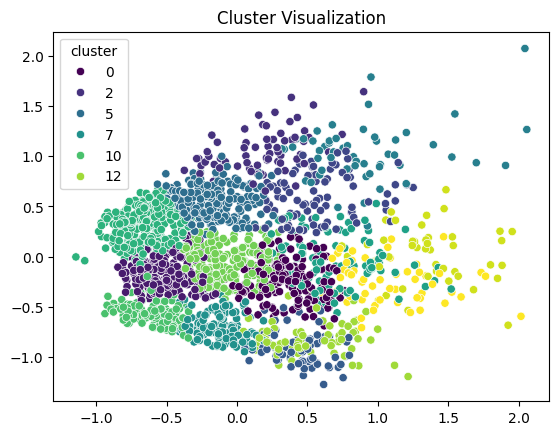

In [78]:
pca = PCA(n_components=3)
principal_components = pca.fit_transform(X)

sns.scatterplot(x=principal_components[:,0], y=principal_components[:,1], hue=first_full_data['cluster'], palette='viridis')
plt.title('Cluster Visualization')
plt.show()

In [79]:
examples_per_cluster = first_full_data.groupby('cluster').apply(lambda x: x.sample(n=5)).reset_index(drop=True)
print(examples_per_cluster[['player','cluster']])

              player  cluster
0       Ximo Navarro        0
1      Lucas Tousart        0
2      Oier Sanjurjo        0
3      Carlos Gruezo        0
4     Gastón Brugman        0
..               ...      ...
70    Benjamin André       14
71     Manuel Prietl       14
72  Valentin Rongier       14
73          Jorginho       14
74      Renato Tapia       14

[75 rows x 2 columns]


In [80]:
first_full_data['mins']=data_outfield['mins']

<ipython-input-80-871ff1988b91>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  first_full_data['mins']=data_outfield['mins']


In [81]:
average_min_per_cluster = first_full_data.groupby('cluster')['mins'].mean().reset_index()

# Rename columns for clarity
average_min_per_cluster.columns = ['cluster', 'average_min']

# Display the result
print(average_min_per_cluster)

    cluster  average_min
0         0  2056.684211
1         1   943.049180
2         2  2446.250000
3         3  2324.622449
4         4  2729.676056
5         5  1641.188119
6         6  2528.716981
7         7  1816.595745
8         8  2494.170000
9         9   894.010563
10       10   982.250000
11       11  1515.293478
12       12  2609.314286
13       13  2763.826087
14       14  2622.454545


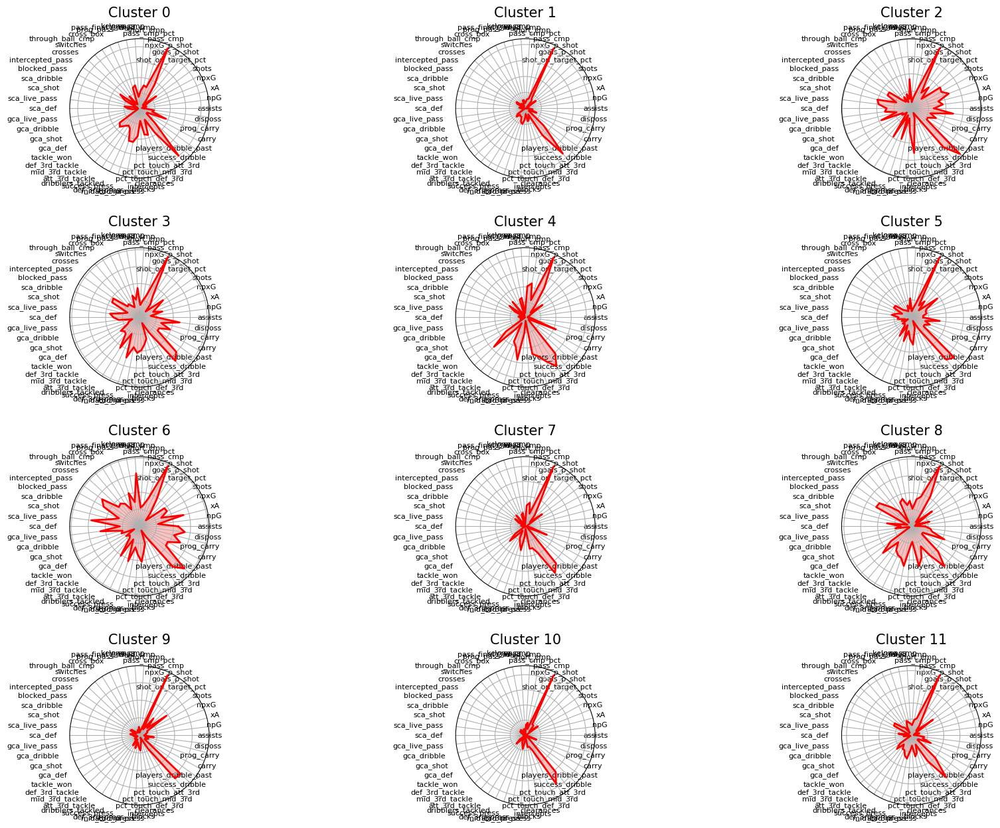

In [82]:
def make_radar_chart(ax, stats, feature_names, num_vars):

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]

    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=8, rotation=45, ha="right")

num_clusters = 20
feature_names = first_full_cluster_centers.columns.tolist()
num_vars = len(feature_names)

fig, axes = plt.subplots(nrows=4, ncols=3, subplot_kw=dict(polar=True), figsize=(20, 15))
fig.subplots_adjust(hspace=0.5, wspace=0.5)


for i, ax in enumerate(axes.flatten()[:num_clusters]):
    make_radar_chart(ax, first_full_cluster_centers.iloc[i].values.tolist(), feature_names, num_vars)
    ax.set_title(f'Cluster {i}', size=15, position=(0.5, 1.1))

for j in range(num_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()

# **2nd Category**

In [83]:
second_categories = {
    'G/A': ['assists', 'npG'],
    'xG/xA': ['xA', 'npxG'],
    'Shooting': [
        'shots', 'shot_on_target_pct', 'goals_p_shot', 'npxG_p_shot',
        'sca_shot', 'gca_shot'
    ],
    'Passing': [
        'pass_cmp', 'pass_cmp_pct', 'short_cmp', 'med_cmp', 'long_cmp', 'sca_live_pass',
        'gca_live_pass'
    ],
    'Progressive Passing': [
        'key_pass', 'pass_final_3rd', 'prog_pass', 'through_ball_cmp'
    ],
    'High Balls': ['cross_box', 'switches', 'crosses'],
    'Giveaway': ['intercepted_pass', 'blocked_pass', 'disposs'],
    'Dribbling': [
        'sca_dribble', 'gca_dribble', 'success_dribble', 'players_dribble_past'
    ],
    'Defending': [
        'sca_def', 'gca_def', 'blocks', 'intercepts', 'clearances'
    ],
    '1v1 Defending': [
        'tackle_won', 'dribblers_tackled'
    ],
    'Defensive 3rd': [
        'def_3rd_tackle', 'def_3rd_press', 'pct_touch_def_3rd'
    ],
    'Middle 3rd': [
        'mid_3rd_tackle', 'mid_3rd_press', 'pct_touch_mid_3rd'
    ],
    'Attacking 3rd': [
        'att_3rd_tackle', 'att_3rd_press', 'pct_touch_att_3rd'
    ],
    'Pressing': ['success_press'],
    'Carry': ['carry', 'prog_carry']
}


In [84]:
second_clustered_data=pd.DataFrame(index=first_full_data['cluster'].unique())

In [85]:
for category, features in second_categories.items():
    second_clustered_data[category] = first_full_data.groupby('cluster')[features].mean().mean(axis=1)

In [86]:
for category in second_clustered_data:
    second_clustered_data[category] = second_clustered_data[category] / second_clustered_data[category].max()

In [87]:
second_clustered_data

,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
9,0.193849,0.220399,0.468301,0.132700,0.104238,0.143052,0.256254,0.189489,0.089052,0.117088,0.156454,0.320181,0.448592,0.227410,0.160559
8,0.265935,0.277331,0.403897,0.608673,0.499690,0.900569,0.742975,0.389532,0.585640,0.639655,0.780443,0.521641,0.418142,0.583899,0.613559
1,0.036967,0.060502,0.184159,0.228038,0.166912,0.185498,0.219372,0.128850,0.197859,0.230450,0.372972,0.362874,0.201850,0.266033,0.212792
11,0.139776,0.149148,0.375055,0.372884,0.282633,0.413949,0.419503,0.237371,0.306111,0.359070,0.502236,0.423018,0.317157,0.387819,0.372930
5,0.414874,0.431469,0.623779,0.248454,0.230299,0.340889,0.512168,0.456071,0.164376,0.221976,0.256432,0.493287,0.669872,0.425170,0.340793
7,0.060387,0.072133,0.298108,0.479160,0.253769,0.256596,0.191867,0.081570,0.609798,0.330806,0.641262,0.333666,0.070778,0.348018,0.422954
0,0.131985,0.157248,0.362397,0.535522,0.450432,0.371301,0.447077,0.283264,0.423957,0.593088,0.704109,0.719983,0.335362,0.657215,0.524232
12,0.139133,0.120990,0.359093,0.934374,0.578172,0.446173,0.312152,0.147823,0.766398,0.447291,0.698950,0.420243,0.100290,0.461081,0.869131
6,0.927603,0.886616,0.902663,0.561600,0.659541,1.000000,1.000000,1.000000,0.247284,0.355671,0.370949,0.617545,0.842981,0.638767,0.777197
3,0.487381,0.511904,0.654884,0.429833,0.432333,0.576322,0.794761,0.686211,0.301434,0.489209,0.535688,0.770721,0.764410,0.740769,0.571935


In [88]:
second_clustered_data.reset_index(inplace=True)
second_clustered_data.rename(columns={"index": "cluster"}, inplace=True)

In [89]:
second_clustered_data.head(15)

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
0,9,0.193849,0.220399,0.468301,0.132700,0.104238,0.143052,0.256254,0.189489,0.089052,0.117088,0.156454,0.320181,0.448592,0.227410,0.160559
1,8,0.265935,0.277331,0.403897,0.608673,0.499690,0.900569,0.742975,0.389532,0.585640,0.639655,0.780443,0.521641,0.418142,0.583899,0.613559
2,1,0.036967,0.060502,0.184159,0.228038,0.166912,0.185498,0.219372,0.128850,0.197859,0.230450,0.372972,0.362874,0.201850,0.266033,0.212792
3,11,0.139776,0.149148,0.375055,0.372884,0.282633,0.413949,0.419503,0.237371,0.306111,0.359070,0.502236,0.423018,0.317157,0.387819,0.372930
4,5,0.414874,0.431469,0.623779,0.248454,0.230299,0.340889,0.512168,0.456071,0.164376,0.221976,0.256432,0.493287,0.669872,0.425170,0.340793
5,7,0.060387,0.072133,0.298108,0.479160,0.253769,0.256596,0.191867,0.081570,0.609798,0.330806,0.641262,0.333666,0.070778,0.348018,0.422954
6,0,0.131985,0.157248,0.362397,0.535522,0.450432,0.371301,0.447077,0.283264,0.423957,0.593088,0.704109,0.719983,0.335362,0.657215,0.524232
7,12,0.139133,0.120990,0.359093,0.934374,0.578172,0.446173,0.312152,0.147823,0.766398,0.447291,0.698950,0.420243,0.100290,0.461081,0.869131
8,6,0.927603,0.886616,0.902663,0.561600,0.659541,1.000000,1.000000,1.000000,0.247284,0.355671,0.370949,0.617545,0.842981,0.638767,0.777197
9,3,0.487381,0.511904,0.654884,0.429833,0.432333,0.576322,0.794761,0.686211,0.301434,0.489209,0.535688,0.770721,0.764410,0.740769,0.571935


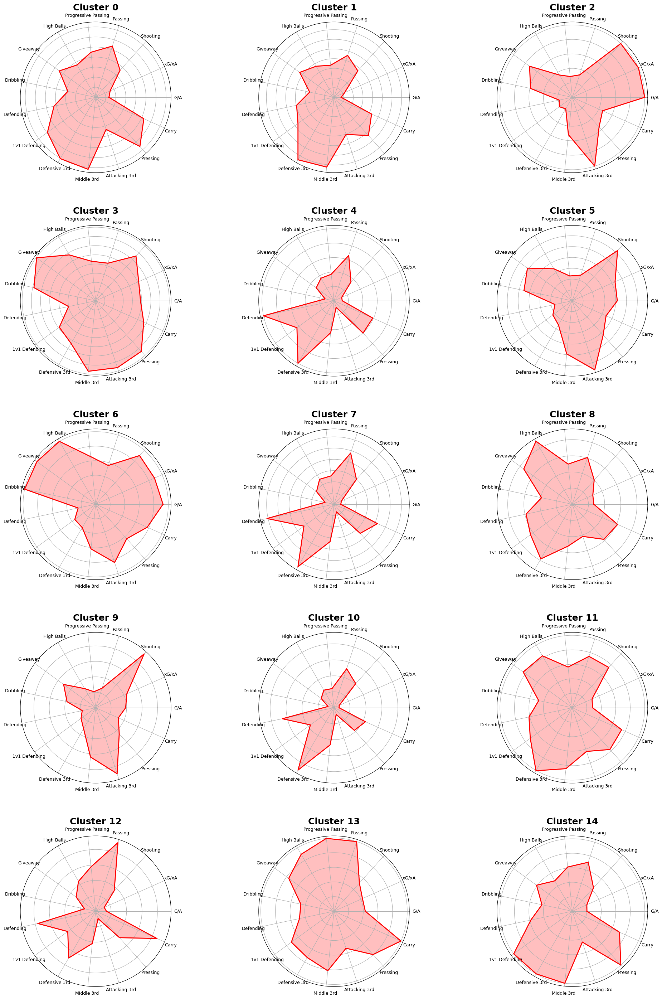

In [90]:
import matplotlib.pyplot as plt
import numpy as np

def make_radar_chart(ax, stats, feature_names, num_vars, max_val):
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]
    stats = [s / max_val for s in stats]
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=9, rotation=45, ha="center")

second_clustered_data = second_clustered_data.sort_values('cluster')
clusters = second_clustered_data['cluster'].unique()
feature_names =second_clustered_data.columns[1:]
num_vars = len(feature_names)
max_val = second_clustered_data[feature_names].max().max()

n_clusters = len(clusters)
n_cols = 3
n_rows = (n_clusters // n_cols) + (n_clusters % n_cols > 0)

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, subplot_kw=dict(polar=True), figsize=(25, n_rows * 7))
fig.subplots_adjust(hspace=0.35, wspace=0.1)

for i, cluster_label in enumerate(clusters):
    ax = axes.flatten()[i]
    cluster_data = second_clustered_data[second_clustered_data['cluster'] == cluster_label]
    stats = cluster_data.mean().drop('cluster').tolist()
    make_radar_chart(ax, stats, feature_names, num_vars, max_val)
    ax.set_title(f'Cluster {cluster_label}', size=18, fontweight='bold', position=(0.5, 100))

for j in range(n_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()


In [91]:
players_in_cluster_3 = first_full_data[first_full_data['cluster'] == 2]
players_in_cluster_3.head(30)

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs,cluster,mins
69,Alexander Isak,2,17,2.3,14.8,78,50.0,0.22,0.19,330,...,4.0,49.0,54.0,34,40,499,72,38,2,2340
87,Álvaro Morata,9,10,4.9,10.3,54,42.6,0.19,0.19,457,...,8.0,48.0,51.0,27,27,580,74,39,2,2014
94,Amine Gouiri,7,8,5.2,11.0,75,38.7,0.11,0.15,881,...,9.0,41.0,56.0,53,53,1071,205,63,2,2747
107,André Silva,7,21,5.5,19.0,107,49.5,0.20,0.18,583,...,5.0,44.0,56.0,30,32,697,97,58,2,2760
109,Andrea Belotti,6,9,7.1,10.0,102,33.3,0.09,0.10,501,...,7.0,52.0,49.0,51,51,844,162,62,2,2888
122,Andrej Kramarić,5,15,4.8,12.4,92,43.5,0.16,0.14,779,...,9.0,46.0,54.0,41,42,1019,172,48,2,2379
127,Andy Delort,9,15,5.8,10.2,91,37.4,0.16,0.11,558,...,7.0,44.0,53.0,38,39,657,86,41,2,2482
138,Ante Rebić,4,11,5.3,7.3,44,52.3,0.25,0.17,307,...,7.0,30.0,67.0,25,26,471,86,44,2,1776
214,Boulaye Dia,1,9,1.6,9.5,58,37.9,0.16,0.16,502,...,14.0,48.0,48.0,48,49,747,94,69,2,2930
260,Che Adams,5,9,5.6,8.9,56,55.4,0.16,0.16,444,...,10.0,46.0,50.0,25,28,630,67,52,2,2667


In [92]:
first_full_data[first_full_data['player'] == 'Lionel Messi']

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs,cluster,mins
975,Lionel Messi,9,27,10.8,19.5,190,44.7,0.14,0.1,1989,...,2.0,48.0,60.0,147,156,2433,517,95,6,3023


# **P_90_PCA**

In [238]:
second_p_90 = [
    "player",
    "assists_p_90",
    "npG_p_90",
    "xA_p_90",
    "npxG_p_90",
    "shots_p_90",
    "shot_on_target_pct",
    "goals_p_shot",
    "npxG_p_shot",
    "pass_cmp_p_90",
    "pass_cmp_pct",
    "short_cmp_p_90",
    "med_cmp_p_90",
    "long_cmp_p_90",
    "key_pass_p_90",
    "pass_final_3rd_p_90",
    "prog_pass_p_90",
    "cross_box_p_90",
    "through_ball_cmp_p_90",
    "switches_p_90",
    "crosses_p_90",
    "intercepted_pass_p_90",
    "blocked_pass_p_90",
    "sca_dribble_p_90",
    "sca_shot_p_90",
    "sca_live_pass_p_90",
    "sca_def_p_90",
    "gca_live_pass_p_90",
    "gca_dribble_p_90",
    "gca_shot_p_90",
    "gca_def_p_90",
    "tackle_won_p_90",
    "def_3rd_tackle_p_90",
    "mid_3rd_tackle_p_90",
    "att_3rd_tackle_p_90",
    "dribblers_tackled_p_90",
    "success_press_p_90",
    "def_3rd_press_p_90",
    "mid_3rd_press_p_90",
    "att_3rd_press_p_90",
    "blocks_p_90",
    "intercepts_p_90",
    "clearances_p_90",
    "pct_touch_def_3rd",
    "pct_touch_mid_3rd",
    "pct_touch_att_3rd",
    "success_dribble_p_90",
    "players_dribble_past_p_90",
    "carry_p_90",
    "prog_carry_p_90",
    "disposs_p_90"
]


In [239]:
second_p_90_data = data_outfield[second_p_90]

In [240]:
second_p_90_data

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,intercepts_p_90,clearances_p_90,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90
0,Aaron Connolly,0.11,0.23,0.02,0.40,2.61,34.8,0.09,0.15,8.98,...,0.00,0.11,7.0,42.0,58.0,0.91,0.91,14.1,1.93,1.70
1,Aaron Cresswell,0.23,0.00,0.17,0.03,0.54,21.1,0.00,0.05,43.80,...,1.02,2.81,33.0,46.0,26.0,0.17,0.23,36.0,2.76,0.26
2,Aaron Hickey,0.00,0.00,0.04,0.01,0.36,33.3,0.00,0.03,40.40,...,1.43,1.79,32.0,49.0,27.0,0.95,1.19,38.3,4.05,1.55
3,Aaron Leya Iseka,0.00,0.18,0.06,0.21,1.61,33.3,0.11,0.13,13.50,...,0.18,0.36,10.0,56.0,40.0,1.25,1.43,18.3,2.68,1.79
4,Aarón Martín,0.18,0.00,0.07,0.01,0.35,16.7,0.00,0.03,40.40,...,0.99,2.92,30.0,49.0,26.0,0.88,0.88,36.9,4.74,0.64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0.00,0.03,0.03,0.04,1.21,7.1,0.02,0.03,42.20,...,1.73,1.94,28.0,58.0,22.0,1.45,1.53,42.5,4.54,0.90
1823,Zaydou Youssouf,0.07,0.07,0.05,0.06,1.09,26.7,0.07,0.06,28.60,...,1.61,0.95,31.0,57.0,18.0,1.75,1.75,36.1,2.41,2.26
1824,Zeki Çelik,0.08,0.11,0.10,0.03,0.60,37.5,0.19,0.05,49.40,...,1.25,2.64,27.0,54.0,25.0,1.06,1.17,45.1,6.30,0.75
1825,Zinedine Ferhat,0.30,0.15,0.18,0.13,1.85,36.1,0.08,0.07,25.00,...,1.03,1.06,15.0,44.0,48.0,1.95,2.22,35.6,4.53,2.07


In [241]:
second_numeric_data = second_p_90_data.drop('player', axis=1)

In [242]:
scaler = MinMaxScaler(feature_range=(0, 1))
second_minmax_scaled_features = scaler.fit_transform(second_numeric_data)

In [243]:
for col in second_numeric_data:
  second_numeric_data[col]=second_numeric_data[col]/second_numeric_data[col].max()

In [244]:
second_numeric_data

,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,pass_cmp_pct,...,intercepts_p_90,clearances_p_90,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90
0,0.144737,0.184,0.037037,0.444444,0.461947,0.348,0.09,0.312500,0.090161,0.812890,...,0.000000,0.010891,0.097222,0.560000,0.816901,0.147249,0.133431,0.147335,0.125325,0.340
1,0.302632,0.000,0.314815,0.033333,0.095575,0.211,0.00,0.104167,0.439759,0.777547,...,0.296512,0.278218,0.458333,0.613333,0.366197,0.027508,0.033724,0.376176,0.179221,0.052
2,0.000000,0.000,0.074074,0.011111,0.063717,0.333,0.00,0.062500,0.405622,0.872141,...,0.415698,0.177228,0.444444,0.653333,0.380282,0.153722,0.174487,0.400209,0.262987,0.310
3,0.000000,0.144,0.111111,0.233333,0.284956,0.333,0.11,0.270833,0.135542,0.788981,...,0.052326,0.035644,0.138889,0.746667,0.563380,0.202265,0.209677,0.191223,0.174026,0.358
4,0.236842,0.000,0.129630,0.011111,0.061947,0.167,0.00,0.062500,0.405622,0.833680,...,0.287791,0.289109,0.416667,0.653333,0.366197,0.142395,0.129032,0.385580,0.307792,0.128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,0.000000,0.024,0.055556,0.044444,0.214159,0.071,0.02,0.062500,0.423695,0.906445,...,0.502907,0.192079,0.388889,0.773333,0.309859,0.234628,0.224340,0.444096,0.294805,0.180
1823,0.092105,0.056,0.092593,0.066667,0.192920,0.267,0.07,0.125000,0.287149,0.811850,...,0.468023,0.094059,0.430556,0.760000,0.253521,0.283172,0.256598,0.377220,0.156494,0.452
1824,0.105263,0.088,0.185185,0.033333,0.106195,0.375,0.19,0.104167,0.495984,0.820166,...,0.363372,0.261386,0.375000,0.720000,0.352113,0.171521,0.171554,0.471264,0.409091,0.150
1825,0.394737,0.120,0.333333,0.144444,0.327434,0.361,0.08,0.145833,0.251004,0.689189,...,0.299419,0.104950,0.208333,0.586667,0.676056,0.315534,0.325513,0.371996,0.294156,0.414


Explained Variance Ratio: [3.62724855e-01 1.60158604e-01 8.65964613e-02 5.99192348e-02
 3.11431890e-02 2.86369466e-02 2.73169705e-02 2.00939412e-02
 1.92517258e-02 1.64809722e-02 1.47495866e-02 1.31388151e-02
 1.27540669e-02 1.16281838e-02 1.05307866e-02 9.16647601e-03
 8.32847473e-03 8.09983693e-03 7.85176388e-03 7.22745922e-03
 7.07891992e-03 6.60255667e-03 6.16631426e-03 5.46010145e-03
 5.25960912e-03 4.99250311e-03 4.61114864e-03 4.33511235e-03
 4.28532168e-03 3.93144441e-03 3.88987706e-03 3.23110975e-03
 3.06713179e-03 2.80539865e-03 2.22044290e-03 2.11064170e-03
 1.97979577e-03 1.83267678e-03 1.76523230e-03 1.55104270e-03
 1.48705469e-03 1.16114006e-03 1.07396263e-03 9.51569530e-04
 9.18605487e-04 6.39564505e-04 4.15474549e-04 3.17688297e-04
 5.60590663e-05 4.15010393e-06]
Cumulative Explained Variance: [0.36272485 0.52288346 0.60947992 0.66939916 0.70054234 0.72917929
 0.75649626 0.7765902  0.79584193 0.8123229  0.82707249 0.8402113
 0.85296537 0.86459355 0.87512434 0.88429082 0

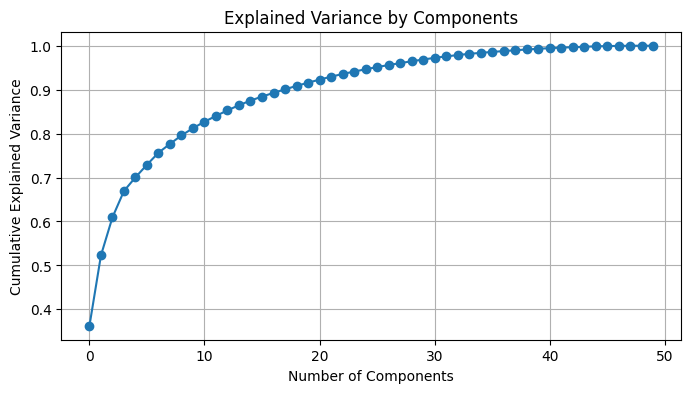

In [245]:
from sklearn.decomposition import PCA

pca = PCA()
X_pca = pca.fit_transform(second_numeric_data)

print("Explained Variance Ratio:", pca.explained_variance_ratio_)

cumulative_variance = pca.explained_variance_ratio_.cumsum()
print("Cumulative Explained Variance:", cumulative_variance)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,4))
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()

In [246]:
pca = PCA(n_components=15)
X_pca = pca.fit_transform(second_numeric_data)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

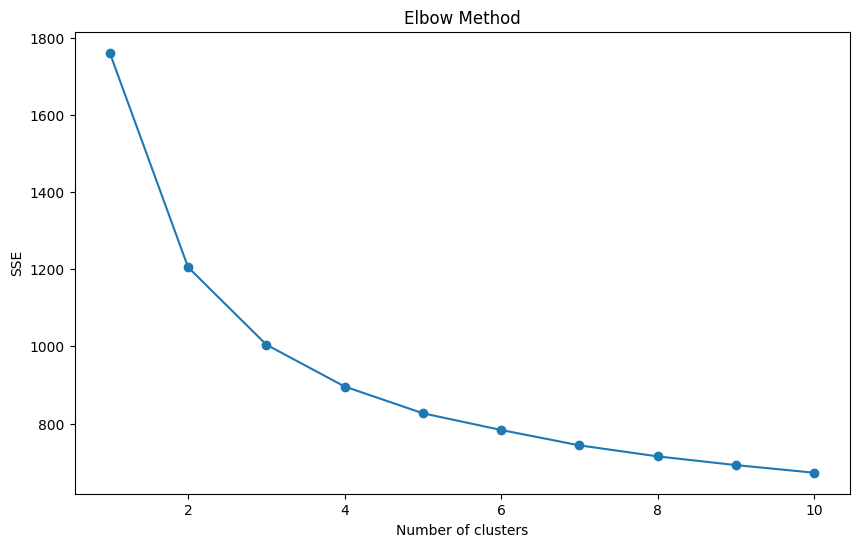

In [247]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

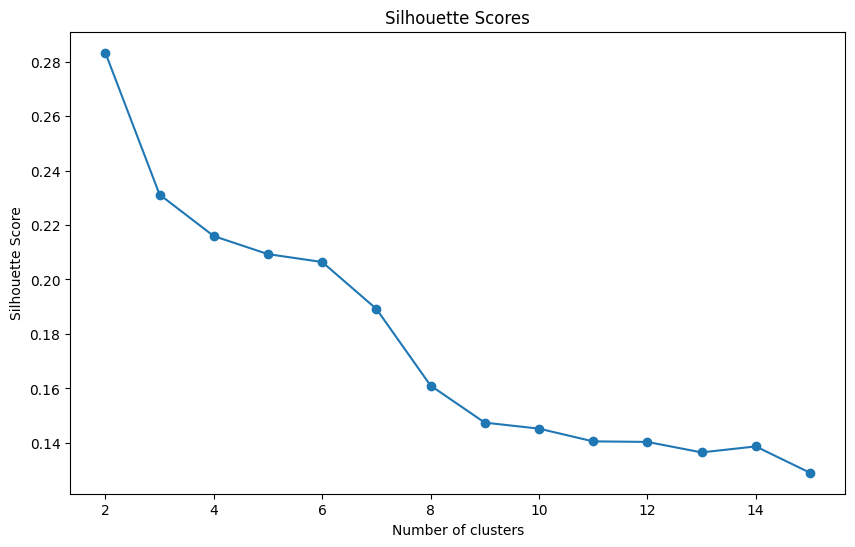

In [248]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    score = silhouette_score(X_pca, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [249]:
kmeans = KMeans(n_clusters=15, random_state=42)
kmeans.fit(X_pca)
second_p_90_data['cluster'] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-249-5caf10afc1e3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_p_90_data['cluster'] = kmeans.labels_


In [250]:
pca_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=[f'PCA_{i+1}' for i in range(kmeans.cluster_centers_.shape[1])])
print(pca_cluster_centers)

       PCA_1     PCA_2     PCA_3     PCA_4     PCA_5     PCA_6     PCA_7  \
0   0.552554  0.443926  0.415798  0.047894 -0.060349 -0.094819 -0.019622   
1  -0.265528  0.190927 -0.259090  0.316311  0.050147  0.035192  0.139211   
2  -0.294247 -0.060255 -0.106444 -0.051802 -0.190620 -0.022506 -0.013535   
3   0.734132  0.080061 -0.047513  0.036138  0.034164  0.271709 -0.107564   
4  -0.836704  0.043659  0.425129 -0.170280 -0.006272  0.074879  0.064475   
5   0.942383 -0.217110  0.225494 -0.029126  0.153418  0.012924 -0.009698   
6  -0.234889  0.688698  0.186685 -0.310157 -0.080914 -0.044009  0.060654   
7  -0.827118 -0.099369 -0.076993  0.019697  0.173359  0.016190 -0.060067   
8  -0.854617 -0.448440  0.189790  0.055246  0.096770  0.000616 -0.114359   
9  -0.318392  0.337405 -0.452899 -0.282449  0.030434 -0.027469 -0.008005   
10  0.342732 -0.096142 -0.233444 -0.006676 -0.079295  0.015118  0.018551   
11  1.169306  0.581249  0.462238  0.116630  0.231334 -0.040268 -0.202619   
12  0.675336

In [251]:
print(second_p_90_data[['player', 'cluster']])

                  player  cluster
0         Aaron Connolly       12
1        Aaron Cresswell       14
2           Aaron Hickey        2
3       Aaron Leya Iseka       12
4           Aarón Martín        2
...                  ...      ...
1822       Yves Bissouma        9
1823     Zaydou Youssouf        2
1824          Zeki Çelik        1
1825     Zinedine Ferhat        3
1826  Zlatan Ibrahimović        5

[1827 rows x 2 columns]


In [252]:
players_in_cluster_3 = second_p_90_data[second_p_90_data['cluster'] == 13]['player']

players_in_cluster_3.head(20)

15           Adam Lallana
23         Adil Aouchiche
24          Admir Mehmedi
91         Amadou Haidara
146      Antonin Bobichon
178          Aymen Barkok
306         Daichi Kamada
321          Daniel Bessa
323      Daniel Caligiuri
368             Dele Alli
375         Dennis Geiger
391       Dimitri Liénard
452           Enzo Le Fée
460           Érik Lamela
495       Federico Chiesa
498     Federico Valverde
517          Flavien Tait
557        Gastón Ramírez
583      Giovani Lo Celso
631    Henrikh Mkhitaryan
Name: player, dtype: object

In [253]:
print(second_p_90_data['cluster'].value_counts())

cluster
12    201
8     192
2     174
1     162
10    155
14    141
3     121
9     117
4     106
7     101
5      97
6      97
0      66
13     59
11     38
Name: count, dtype: int64


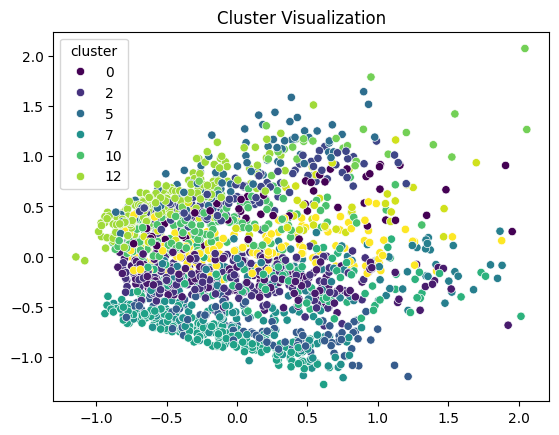

In [254]:
sns.scatterplot(x=principal_components[:,0], y=principal_components[:,1], hue=second_p_90_data['cluster'], palette='viridis')
plt.title('Cluster Visualization')
plt.show()

In [255]:
original_space_centers = kmeans.cluster_centers_.dot(pca.components_)

In [256]:
original_space_centers = scaler.inverse_transform(pca.inverse_transform(kmeans.cluster_centers_))
original_cluster_centers = pd.DataFrame(original_space_centers, columns=second_p_90_data.columns.drop(['player', 'cluster']))

print(original_cluster_centers)

    assists_p_90  npG_p_90   xA_p_90  npxG_p_90  shots_p_90  \
0       0.239031  0.170295  0.218850   0.161285    1.776588   
1       0.055596  0.045097  0.060053   0.035517    0.513552   
2       0.039088  0.015698  0.045575   0.039331    0.647854   
3       0.152765  0.190110  0.148824   0.195135    1.956280   
4       0.003050  0.046085  0.014976   0.044069    0.501989   
5       0.189627  0.391245  0.175799   0.372191    2.813982   
6       0.095566  0.064023  0.104248   0.062256    0.988192   
7       0.021707  0.049876  0.016916   0.041285    0.450167   
8       0.026042  0.038748  0.012578   0.043988    0.423193   
9       0.048966  0.043605  0.052021   0.047886    0.749331   
10      0.089688  0.123909  0.095080   0.142297    1.367964   
11      0.396094  0.324271  0.321811   0.307210    2.820826   
12      0.086123  0.314242  0.092575   0.316747    2.237855   
13      0.220935  0.141492  0.185986   0.153125    1.680896   
14      0.139884  0.043024  0.135394   0.051881    0.82

In [257]:
cluster_groups = second_p_90_data.groupby('cluster')
cluster_summary = cluster_groups.describe()

print(cluster_summary)


        assists_p_90                                                       \
               count      mean       std   min    25%   50%     75%   max   
cluster                                                                     
0               66.0  0.225606  0.099971  0.00  0.150  0.22  0.2900  0.42   
1              162.0  0.056543  0.061577  0.00  0.000  0.04  0.0900  0.32   
2              174.0  0.035920  0.046769  0.00  0.000  0.00  0.0600  0.26   
3              121.0  0.149421  0.086046  0.00  0.100  0.14  0.2100  0.41   
4              106.0  0.021132  0.038380  0.00  0.000  0.00  0.0300  0.26   
5               97.0  0.197320  0.096776  0.00  0.140  0.20  0.2500  0.49   
6               97.0  0.099794  0.083815  0.00  0.040  0.09  0.1500  0.43   
7              101.0  0.021386  0.036525  0.00  0.000  0.00  0.0300  0.18   
8              192.0  0.015104  0.029763  0.00  0.000  0.00  0.0300  0.17   
9              117.0  0.050342  0.058677  0.00  0.000  0.04  0.0800  0.28   

In [258]:
second_p_90_data['mins']=data_outfield['mins']

<ipython-input-258-29042a639ebd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_p_90_data['mins']=data_outfield['mins']


In [259]:
second_p_90_data['mins']=data_outfield['mins']
average_min_per_cluster = second_p_90_data.groupby('cluster')['mins'].mean().reset_index()

# Rename columns for clarity
average_min_per_cluster.columns = ['cluster', 'average_min']

# Display the result
print(average_min_per_cluster)

    cluster  average_min
0         0  1705.560606
1         1  1694.382716
2         2  1737.270115
3         3  1612.363636
4         4  1901.716981
5         5  1828.752577
6         6  1890.690722
7         7  1828.485149
8         8  1855.911458
9         9  1821.418803
10       10  1515.961290
11       11  1718.052632
12       12  1491.870647
13       13  1660.254237
14       14  1772.049645


<ipython-input-259-758152301fe8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_p_90_data['mins']=data_outfield['mins']


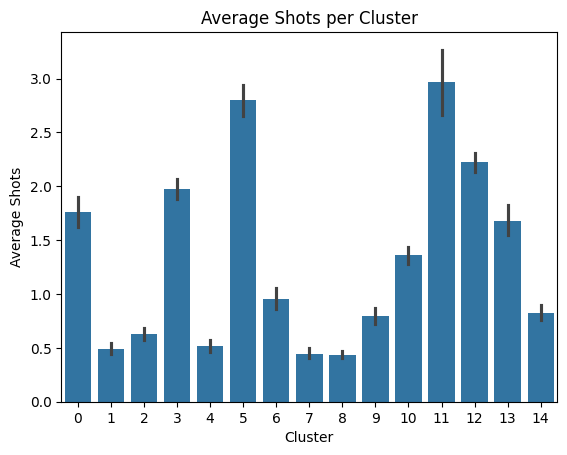

In [260]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Visualize average 'shots' across clusters
sns.barplot(x=second_p_90_data['cluster'], y=second_p_90_data['shots_p_90'])
plt.title('Average Shots per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Shots')
plt.show()

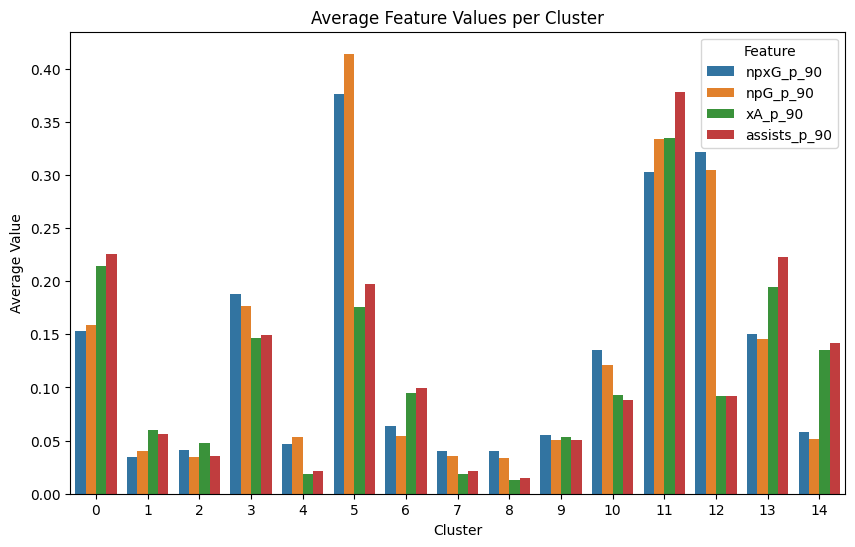

In [261]:
feature_means = second_p_90_data.groupby('cluster')[['npxG_p_90', 'npG_p_90', 'xA_p_90', 'assists_p_90']].mean().reset_index()

melted_data = feature_means.melt(id_vars="cluster", var_name="feature", value_name="average")

plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='average', hue='feature', data=melted_data)
plt.title('Average Feature Values per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Value')
plt.legend(title='Feature')
plt.show()

# **PCA p_90_Category**

In [262]:
pca_p_90_categories = {
    "G/A": ["assists_p_90", "npG_p_90"],
    "xG/xA": ["xA_p_90", "npxG_p_90"],
    "Shooting": [
        "shots_p_90", "shot_on_target_pct", "goals_p_shot",
        "npxG_p_shot", "sca_shot_p_90", "gca_shot_p_90"
    ],
    "Passing": [
        "pass_cmp_p_90", "pass_cmp_pct", "short_cmp_p_90", "med_cmp_p_90",
        "long_cmp_p_90", "sca_live_pass_p_90", "gca_live_pass_p_90"
    ],
    "Progressive Passing": [
        "key_pass_p_90", "pass_final_3rd_p_90", "prog_pass_p_90",
        "through_ball_cmp_p_90"
    ],
    "High Balls": [
        "cross_box_p_90", "switches_p_90", "crosses_p_90"
    ],
    "Giveaway": [
        "intercepted_pass_p_90", "blocked_pass_p_90", "disposs_p_90"
    ],
    "Dribbling": [
        "sca_dribble_p_90", "gca_dribble_p_90", "success_dribble_p_90",
        "players_dribble_past_p_90"
    ],
    "Defending": [
        "sca_def_p_90", "gca_def_p_90", "blocks_p_90", "intercepts_p_90",
        "clearances_p_90"
    ],
    "1v1 Defending": [
        "tackle_won_p_90", "dribblers_tackled_p_90"
    ],
    "Defensive 3rd": [
        "def_3rd_tackle_p_90", "def_3rd_press_p_90", "pct_touch_def_3rd"
    ],
    "Middle 3rd": [
        "mid_3rd_tackle_p_90", "mid_3rd_press_p_90", "pct_touch_mid_3rd"
    ],
    "Attacking 3rd": [
        "att_3rd_tackle_p_90", "att_3rd_press_p_90", "pct_touch_att_3rd"
    ],
    "Carry": [
        "carry_p_90", "prog_carry_p_90"
    ],
    "Pressing": [
        "success_press_p_90"
    ]
}


In [263]:
pca_p_90_clustered_data=pd.DataFrame(index=second_p_90_data['cluster'].unique())

In [264]:
for category, features in pca_p_90_categories.items():
    pca_p_90_clustered_data[category] = second_p_90_data.groupby('cluster')[features].mean().mean(axis=1)

In [265]:
for category in categories:
    pca_p_90_clustered_data[category] = pca_p_90_clustered_data[category] / pca_p_90_clustered_data[category].max()

In [266]:
pca_p_90_clustered_data.reset_index(inplace=True)
pca_p_90_clustered_data.rename(columns={"index": "cluster"}, inplace=True)

In [267]:
first_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.570952,0.585407,0.835072,0.768035,0.747693,0.695808,0.800954,0.530285,0.309815,0.504062,0.285800,0.826782,0.753183,0.802768,0.746429
5,1,0.103680,0.102987,0.578941,0.972356,0.582940,0.372665,0.304582,0.111711,0.798780,0.509842,0.835140,0.795045,0.104247,0.876354,0.475712
0,2,0.612086,0.701433,0.967173,0.468022,0.195995,0.163234,0.555618,0.310879,0.205756,0.196305,0.158105,0.739377,0.870686,0.323486,0.556250
6,3,0.478069,0.535484,0.834567,0.602102,0.443245,0.559942,0.926925,1.000000,0.299611,0.512513,0.283131,0.748689,0.878736,0.696039,0.706809
2,4,0.104507,0.137985,0.468821,0.713032,0.466478,0.369131,0.469596,0.216164,0.591364,0.547725,0.573551,0.869047,0.345983,0.554018,0.629590
9,5,0.072411,0.086120,0.600566,0.748692,0.313031,0.278354,0.224396,0.077027,1.000000,0.486424,1.000000,0.667168,0.073615,0.539286,0.476894
4,6,0.197530,0.208102,0.653123,0.802361,0.564953,0.744898,0.749547,0.345810,0.641245,0.690933,0.567168,0.727165,0.513964,0.733325,0.617176
1,7,0.322429,0.373556,0.810985,0.655172,0.486759,1.000000,0.751237,0.375954,0.490748,0.472767,0.450161,0.672788,0.690545,0.616230,0.521844
7,8,0.425658,0.490948,0.865274,0.499545,0.284645,0.354886,0.769481,0.480303,0.292069,0.354130,0.262473,0.754700,0.866590,0.463129,0.693702
8,9,0.279391,0.339778,0.704049,0.620951,0.430472,0.411935,0.728681,0.453425,0.434945,0.633265,0.410927,0.850165,0.641276,0.567635,0.824560


In [268]:
pca_p_90_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
0,12,0.556747,0.648299,0.944930,0.473296,0.220560,0.211367,0.606682,0.355755,0.216898,0.219039,0.169037,0.745212,0.873140,0.350066,0.577016
1,14,0.271397,0.302788,0.656681,0.745790,0.558622,1.000000,0.747584,0.362067,0.562267,0.557538,0.497252,0.693270,0.612567,0.697807,0.555040
2,2,0.099180,0.140001,0.449264,0.709893,0.495833,0.409044,0.482850,0.238245,0.573978,0.548802,0.553541,0.892516,0.352394,0.558906,0.645533
3,0,0.540199,0.576709,0.842955,0.787425,0.842071,0.941260,0.817668,0.588429,0.289409,0.372754,0.277619,0.792814,0.757940,0.861035,0.610767
4,1,0.135935,0.149015,0.745418,0.715096,0.483969,0.651238,0.721654,0.347185,0.740011,0.826101,0.657640,0.725962,0.454612,0.612257,0.660036
5,4,0.104737,0.102320,0.595617,1.000000,0.632976,0.409150,0.299758,0.116938,0.801227,0.483206,0.822804,0.809948,0.101784,0.925274,0.461221
6,3,0.458647,0.524713,0.830677,0.595413,0.453240,0.604722,0.909685,1.000000,0.303384,0.485079,0.278835,0.751722,0.872491,0.682490,0.692975
7,13,0.518779,0.541911,0.779392,0.735333,0.694135,0.700491,0.849846,0.572901,0.392687,0.793186,0.345528,0.873044,0.721315,0.768579,0.955239
8,8,0.068510,0.082894,0.574508,0.754320,0.312279,0.319555,0.205845,0.072399,1.000000,0.407170,1.000000,0.662207,0.066516,0.544193,0.422885
9,11,1.000000,1.000000,0.895342,0.726623,0.796220,0.966491,1.000000,0.987092,0.260758,0.381580,0.190959,0.682611,1.000000,0.900519,0.685247


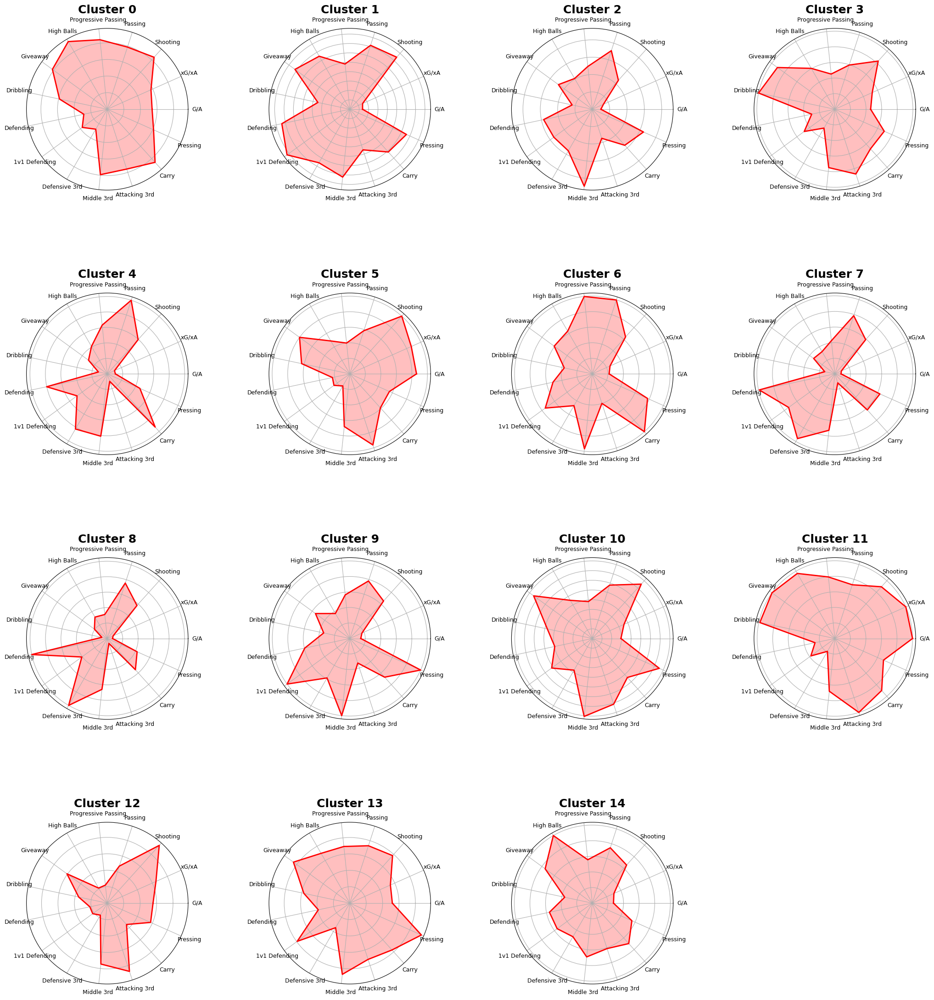

In [269]:
import matplotlib.pyplot as plt
import numpy as np

def make_radar_chart(ax, stats, feature_names, num_vars, max_val):
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]
    stats = [s / max_val for s in stats]
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=9, rotation=45, ha="center")

pca_p_90_clustered_data = pca_p_90_clustered_data.sort_values('cluster')
clusters = pca_p_90_clustered_data['cluster'].unique()
feature_names =pca_p_90_clustered_data.columns[1:]
num_vars = len(feature_names)
max_val = pca_p_90_clustered_data[feature_names].max().max()

n_clusters = len(clusters)
n_cols = 4
n_rows = (n_clusters // n_cols) + (n_clusters % n_cols > 0)

# Create a figure with appropriate size
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, subplot_kw=dict(polar=True), figsize=(25, n_rows * 7))
fig.subplots_adjust(hspace=0.35, wspace=0.5)

for i, cluster_label in enumerate(clusters):
    ax = axes.flatten()[i]
    cluster_data = pca_p_90_clustered_data[pca_p_90_clustered_data['cluster'] == cluster_label]
    stats = cluster_data.mean().drop('cluster').tolist()
    make_radar_chart(ax, stats, feature_names, num_vars, max_val)
    ax.set_title(f'Cluster {cluster_label}', size=18, fontweight='bold', position=(0.5, 100))  # Move title higher

for j in range(n_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()


In [275]:
players_in_cluster_0 = second_p_90_data[second_p_90_data['cluster'] ==0]['player']

players_in_cluster_0.head(40
                          )

5                Aaron Ramsey
118           Andreas Pereira
134            Angelo Fulgini
148          Antonio Candreva
194       Benjamin Bourigeaud
201            Bernardo Silva
202            Bersant Celina
254             Cesc Fàbregas
269         Christian Eriksen
286           Clément Grenier
325             Daniel Didavi
351            David Ferreiro
355               David Silva
392             Dimitri Payet
438           Emanuel Vignato
488             Farid Boulaya
492     Federico Bernardeschi
527           Florian Thauvin
536            Franck Honorat
592            Gonzalo Castro
609          Hakan Çalhanoğlu
610              Hakim Ziyech
657              Iker Muniain
660            İlkay Gündoğan
669                      Isco
710           James Rodríguez
774                   Joaquín
801            Jonathan Bamba
814                      Jony
835              José Campaña
852             Josip Brekalo
858             Juan Cuadrado
860                 Juan Mata
866       

In [278]:
players_in_cluster_1 = second_p_90_data[second_p_90_data['cluster'] ==1]['player']

players_in_cluster_1.head(40)

6            Aaron Wan-Bissaka
9              Abdoulaye Bamba
37                 Aihen Muñoz
64                 Álex Moreno
76              Alfonso Espino
92             Ambroise Oyongo
100                 Ander Capa
103           Anderson Lucoqui
104           Andoni Gorosabel
111               Andrea Conti
140               Anthony Caci
164             Arnaud Souquet
182        Bartosz Bereszyński
188                Ben Johnson
195          Benjamin Henrichs
205              Birger Meling
218              Brandon Soppy
243               Carlos Akapo
245               Carlos Clerc
250             Cédric Brunner
255    Charalambos Lykogiannis
258             Charles Traore
259             Charlie Taylor
280           Christopher Lenz
289                       Coke
293             Conor Townsend
305                Daam Foulon
308              Damián Suárez
311                   Dan Burn
314              Dani Carvajal
358            Davide Calabria
359             Davide Faraoni
374     

In [279]:
players_in_cluster_2 = second_p_90_data[second_p_90_data['cluster'] ==2]['player']

players_in_cluster_2.head(40)

2             Aaron Hickey
4             Aarón Martín
10      Abdoulaye Doucouré
11         Abdoulaye Touré
32           Adrien Tameze
43          Alberto Grassi
48          Alejandro Pozo
55       Alessandro Deiola
61          Álex Fernández
78           Alfred Duncan
101          Ander Guevara
123        Andrés Guardado
131          Ángel Montoro
136           Aníbal Chalá
165             Arne Maier
168           Artur Ioniță
171        Ashley Westwood
177            Axel Witsel
184        Bastian Oczipka
186             Ben Davies
191              Ben White
200         Berat Djimsiti
229             Bryan Dabo
247            Carlos Neva
248           Carlos Soler
272      Christian Gentner
310       Damien Le Tallec
317            Dani García
329            Daniel Wass
347        Darnell Furlong
356            David Timor
357        Davide Biraschi
360          Davide Santon
365            Declan Rice
373          Denis Zakaria
382           Didier Ndong
390      Dimitri Foulquier
4

In [280]:
players_in_cluster_3 = second_p_90_data[second_p_90_data['cluster'] ==3]['player']

players_in_cluster_3.head(40)

8           Abdoul Kader Bamba
13            Aboubakar Kamara
17                  Adam Ounas
21                Adama Traoré
22             Ademola Lookman
41                Aitor Ruibal
44               Alberto Perea
60              Álex Berenguer
72       Alexis Claude-Maurice
83         Allan Saint-Maximin
93                 Amin Younes
95                 Amine Harit
99           Ander Barrenetxea
119         Andreas Skov Olsen
129               Ángel Correa
154               Arber Zeneli
160           Armand Lauriente
180                Ayoze Pérez
203            Bertrand Traoré
215                Brahim Díaz
230                  Bryan Gil
231                Bukayo Saka
276          Christian Pulisic
294              Corentin Jean
303                      Cucho
328             Daniel Podence
348              Darwin Machís
367           Dejan Kulusevski
369              Denis Bouanga
376                 Dennis Man
378              Dereck Kutesa
388               Diego Laínez
400     

In [281]:
players_in_cluster_4 = second_p_90_data[second_p_90_data['cluster'] ==4]['player']

players_in_cluster_4.head(40)

7             Abdou Diallo
19            Adam Webster
49     Aleksandar Dragović
53      Alessandro Bastoni
86         Álvaro González
98          Anaitz Arbilla
114       Andrea Ranocchia
116    Andreas Christensen
128           Andy Pelmard
150        Antonio Rüdiger
157        Aritz Elustondo
176            Axel Disasi
179        Aymeric Laporte
199      Benoît Badiashile
233         Çağlar Söyüncü
270        Christian Fuchs
285          Claudio Terzi
287        Clément Lenglet
309        Damien Da Silva
334      Danilo D'Ambrosio
336         Danilo Pereira
341                  Dante
344          Dario Marešić
353             David Luiz
364        Dayot Upamecano
408       Dominique Heintz
427         Edmond Tapsoba
478                Fabinho
483         Facundo Medina
518       Flavius Daniliuc
532       Francesco Acerbi
544     Gabriel Martinelli
565           Gerard Piqué
569         Gerzino Nyamsi
573     Gian Marco Ferrari
578       Gianluca Mancini
581      Giorgio Chiellini
6

In [282]:
players_in_cluster_5 = second_p_90_data[second_p_90_data['cluster'] ==5]['player']

players_in_cluster_5.head(40)

42          Alassane Pléa
70      Alexander Sørloth
79     Alfreð Finnbogason
87          Álvaro Morata
94           Amine Gouiri
107           André Silva
109        Andrea Belotti
113        Andrea Petagna
122       Andrej Kramarić
127           Andy Delort
138            Ante Rebić
142       Anthony Martial
143     Antoine Griezmann
153        Anwar El Ghazi
162     Arnaud Kalimuendo
163         Arnaud Nordin
220          Breel Embolo
242          Carles Pérez
284         Ciro Immobile
299        Cristian Tello
302     Cristiano Ronaldo
331         Daniele Verde
385          Diego Farias
396            Diogo Jota
411         Dries Mertens
414          Duván Zapata
421           Eden Hazard
425            Edin Džeko
440         Emil Forsberg
462        Erling Haaland
510         Ferrán Torres
513         Filip Đuričić
535     Francisco Trincão
543         Gabriel Jesus
549        Gaëtan Laborde
553           Gareth Bale
563       Gerard Deulofeu
564         Gerard Moreno
620         

In [283]:
players_in_cluster_6 = second_p_90_data[second_p_90_data['cluster'] ==6]['player']

players_in_cluster_6.head(40)

46             Aleix Vidal
65             Alex Sandro
85         Alphonso Davies
102          Ander Herrera
167            Arthur Melo
169           Arturo Vidal
197        Benjamin Pavard
213      Boubakary Soumaré
226        Bruno Guimarães
228        Bryan Cristante
253      César Azpilicueta
295       Corentin Tolisso
304           Curtis Jones
307       Daley Sinkgraven
315          Dani Ceballos
327          Daniel Parejo
332                 Danilo
333         Danilo Cataldi
350            David Alaba
371           Denis Suárez
384            Diego Demme
398         Djibril Sidibé
446               Emre Can
474            Fabián Ruiz
504            Fernandinho
515       Filip Krovinović
520     Florian Grillitsch
524        Florian Neuhaus
537          Franck Kessié
539                   Fred
542        Frenkie de Jong
556         Gastón Brugman
584    Giovanni Di Lorenzo
596         Gonzalo Villar
599           Granit Xhaka
622            Harry Winks
628         Héctor Herrera
6

In [284]:
players_in_cluster_7 = second_p_90_data[second_p_90_data['cluster'] ==7]['player']

players_in_cluster_7.head(40)

58        Alessandro Tuia
62           Alex Ferrari
67        Alexander Djiku
68         Alexander Hack
97            Amos Pieper
110        Andrea Carboni
121        Andrei Girotto
161          Armando Izzo
174        Atakan Karazor
187           Ben Godfrey
198    Benjamin Stambouli
212      Boubakar Kouyaté
221    Brendan Chardonnet
264          Chris Basham
265        Chris Richards
298       Cristian Romero
300       Cristián Zapata
320        Daniel Amartey
342           Dara O'Shea
349         David Abraham
363      Davinson Sánchez
386           Diego Godín
389        Diego Llorente
394      Dinos Mavropanos
403     Domenico Criscito
417           Dylan Bronn
465          Ethan Ampadu
512         Fikayo Tomori
521        Florian Hübner
555            Gary Medel
558          Gastón Silva
587        Giuseppe Cuomo
589        Gleison Bremer
618       Harold Moukoudi
689         Jack Stephens
718    Jannik Vestergaard
759       Jerry St. Juste
789           John Brooks
809        J

In [285]:
players_in_cluster_8 = second_p_90_data[second_p_90_data['cluster'] ==8]['player']

players_in_cluster_8.head(40)

20            Adama Soumaoro
40               Aïssa Mandi
54     Alessandro Buongiorno
59         Alessio Romagnoli
96             Amir Rrahmani
112          Andrea Masiello
124         Andrew Gravillon
135           Angelo Ogbonna
139         Anthony Briançon
147         Antonio Barragán
155           Ardian Ismajli
156        Aridane Hernández
189                  Ben Mee
217            Bram Nuytinck
219       Branislav Ivanović
222              Bruno Alves
223       Bruno Ecuele Manga
225           Bruno González
235                     Cala
262         Cheikhou Kouyaté
263                    Chema
266           Chris Smalling
279       Christophe Hérelle
283             Ciaran Clark
291              Conor Coady
296             Craig Dawson
313               Dani Calvo
324            Daniel Congré
330           Daniele Rugani
335        Danilo Larangeira
352             David García
366           Dedryck Boyata
372              Denis Vavro
383             Diego Carlos
387           

In [286]:
players_in_cluster_9 = second_p_90_data[second_p_90_data['cluster'] ==9]['player']

players_in_cluster_9.head(40)

27                   Adrián Cubas
30                  Adrien Rabiot
31                   Adrien Silva
35                   Ahmad Benali
38                 Aimen Moueffek
45                    Albin Ekdal
81                          Allan
90                 Amadou Diawara
105                   André Gomes
108    Andre-Frank Zambo Anguissa
175           Aurélien Tchouaméni
181           Baptiste Santamaria
193                Benjamin André
211               Boubacar Kamara
240                  Can Bozdogan
246                 Carlos Gruezo
249                      Casemiro
257              Charles Aránguiz
261               Cheick Doucouré
273                Christian Groß
278              Christoph Kramer
292               Conor Gallagher
339                   Danny Latza
381             Diadie Samassékou
399                   Djibril Sow
407                  Dominik Kohr
430             Eduardo Camavinga
435                 Ellyes Skhiri
467             Exequiel Palacios
472           

In [287]:
players_in_cluster_10 = second_p_90_data[second_p_90_data['cluster'] ==10]['player']

players_in_cluster_10.head(40)

33           Adrien Thomasson
39     Ainsley Maitland-Niles
47           Alejandro Blanco
57          Alessandro Schöpf
73        Alexis Mac Allister
74        Alexis Saelemaekers
106                André Hahn
145             Antonín Barák
149           Antonio Puertas
190                Ben Osborn
192              Benito Raman
206                Bobby Reid
207              Borja García
216              Brais Méndez
241              Carles Aleñá
271         Christian Gebauer
277     Christoph Baumgartner
312                 Dan Ndoye
316             Dani Escriche
326              Daniel James
345            Darko Brašanac
361         Davide Zappacosta
370           Denis Cheryshev
377              Dennis Praet
380                 Deyverson
406          Dominick Drexler
409         Donny van de Beek
419             Ebrima Colley
423              Édgar Méndez
429              Edu Expósito
437           Elvis Rexhbeçaj
442          Emile Smith Rowe
443           Emiliano Rigoni
459       

In [288]:
players_in_cluster_11 = second_p_90_data[second_p_90_data['cluster'] ==11]['player']

players_in_cluster_11.head(40)

25            Adnan Januzaj
51        Aleksandr Golovin
52        Aleksei Miranchuk
75           Alexis Sánchez
80      Alireza Jahanbakhsh
130          Ángel Di María
224         Bruno Fernandes
236      Callum Hudson-Odoi
281      Christopher Nkunku
319               Dani Olmo
402        Domenico Berardi
514            Filip Kostić
638           Houssem Aouar
686           Jack Grealish
694            Jadon Sancho
853            Josip Iličić
905         Kevin De Bruyne
930          Kingsley Coman
962             Leon Bailey
969              Leroy Sané
975            Lionel Messi
982         Lorenzo Insigne
1017          Luis Henrique
1020            Luis Muriel
1183          Memphis Depay
1279                 Neymar
1339        Ousmane Dembélé
1350          Pablo Sarabia
1359             Papu Gómez
1376           Paulo Dybala
1434               Raphinha
1441           Rayan Cherki
1468           Riyad Mahrez
1503                Rodrygo
1537     Ruslan Malinovskyi
1591           Serge

In [289]:
players_in_cluster_12 = second_p_90_data[second_p_90_data['cluster'] ==12]['player']

players_in_cluster_12.head(40)

0           Aaron Connolly
3         Aaron Leya Iseka
12      Abdul Majeed Waris
18             Ádám Szalai
26            Adolfo Gaich
28            Adrian Grbić
29            Adrien Hunou
50     Aleksandar Mitrović
69          Alexander Isak
71     Alexandre Lacazette
88          Álvaro Negredo
117      Andreas Cornelius
120     Andreas Voglsammer
132        Ángel Rodríguez
137           Ante Budimir
141         Anthony Lozano
151       Antonio Sanabria
152       Antonio Sanabria
158        Arkadiusz Milik
170          Ashley Barnes
173       Asier Villalibre
183               Bas Dost
204            Billy Sharp
208         Borja Iglesias
209          Borja Mayoral
214            Boulaye Dia
232           Burak Yılmaz
237        Callum Robinson
238          Callum Wilson
244           Carlos Bacca
252        Cedric Teuchert
256            Charles Abi
260              Che Adams
267             Chris Wood
268      Christian Benteke
275       Christian Kouamé
318             Dani Gómez
3

In [290]:
players_in_cluster_13 = second_p_90_data[second_p_90_data['cluster'] ==13]['player']

players_in_cluster_13.head(40)

15              Adam Lallana
23            Adil Aouchiche
24             Admir Mehmedi
91            Amadou Haidara
146         Antonin Bobichon
178             Aymen Barkok
306            Daichi Kamada
321             Daniel Bessa
323         Daniel Caligiuri
368                Dele Alli
375            Dennis Geiger
391          Dimitri Liénard
452              Enzo Le Fée
460              Érik Lamela
495          Federico Chiesa
498        Federico Valverde
517             Flavien Tait
557           Gastón Ramírez
583         Giovani Lo Celso
631       Henrikh Mkhitaryan
658                    Ilaix
706           James Maddison
738        Jean-Paul Boëtius
800            Jonas Hofmann
824          Jorge de Frutos
863          Jude Bellingham
900           Kerem Demirbay
916             Kevin Stöger
948              Lars Stindl
965     Leonardo Bittencourt
1006           Lucas Paquetá
1011           Lucas Vázquez
1052          Manuel Lanzini
1059         Marc Albrighton
1073          

In [291]:
players_in_cluster_14 = second_p_90_data[second_p_90_data['cluster'] ==14]['player']

players_in_cluster_14.head(40)

1          Aaron Cresswell
14           Achraf Hakimi
16            Adam Marušić
34         Adrien Truffert
36        Ahmed Elmohamady
56     Alessandro Florenzi
63              Alex Iwobi
66             Alex Telles
77         Alfonso Pedraza
82              Allan Nyom
84            Almamy Touré
89        Álvaro Odriozola
115         Andrea Rispoli
125       Andrew Robertson
126        Andros Townsend
133               Angeliño
144       Antonee Robinson
159         Arkadiusz Reca
166         Arthur Masuaku
172           Ashley Young
185           Ben Chilwell
196         Benjamin Mendy
210             Borna Sosa
227            Bruno Peres
234          Caio Henrique
239         Calum Chambers
251          Cédric Soares
274       Christian Günter
282    Christopher Trimmel
288       Clément Michelin
290            Colin Dagba
297       Cristian Ansaldi
301      Cristiano Biraghi
322       Daniel Brosiński
337         Danny da Costa
346          Darko Lazović
401       Domagoj Bradarić
4

In [293]:
second_p_90_data[second_p_90_data['player']=='Ben White']

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90,cluster,mins
191,Ben White,0.0,0.0,0.02,0.02,0.28,0.0,0.0,0.07,41.4,...,46.0,48.0,13.0,0.68,0.87,38.8,3.04,0.42,2,3191


# **PCA_Full_90**

In [190]:
second_full = ['player',
    "assists", "npG", "xA", "npxG", "shots", "shot_on_target_pct", "goals_p_shot",
    "npxG_p_shot", "pass_cmp", "pass_cmp_pct", "short_cmp", "med_cmp",
    "long_cmp", "key_pass", "pass_final_3rd", "prog_pass", "cross_box", "through_ball_cmp",
    "switches", "crosses", "intercepted_pass", "blocked_pass", "sca_dribble", "sca_shot",
    "sca_live_pass", "sca_def", "gca_live_pass", "gca_dribble", "gca_shot", "gca_def",
    "tackle_won", "def_3rd_tackle", "mid_3rd_tackle", "att_3rd_tackle", "dribblers_tackled",
    "success_press", "def_3rd_press", "mid_3rd_press", "att_3rd_press", "blocks",
    "intercepts", "clearances", "pct_touch_def_3rd", "pct_touch_mid_3rd", "pct_touch_att_3rd",
    "success_dribble", "players_dribble_past", "carry", "prog_carry", "disposs"
]

In [191]:
second_full_data = data_outfield[second_full]

In [192]:
second_full_data

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,intercepts,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,Aaron Connolly,1,2,0.2,3.5,23,34.8,0.09,0.15,79,...,0,1,7.0,42.0,58.0,8,8,124,17,15
1,Aaron Cresswell,8,0,6.0,1.1,19,21.1,0.00,0.05,1542,...,36,99,33.0,46.0,26.0,6,8,1267,97,9
2,Aaron Hickey,0,0,0.3,0.1,3,33.3,0.00,0.03,339,...,12,15,32.0,49.0,27.0,8,10,322,34,13
3,Aaron Leya Iseka,0,2,0.7,2.4,18,33.3,0.11,0.13,151,...,2,4,10.0,56.0,40.0,14,16,205,30,20
4,Aarón Martín,3,0,1.2,0.2,6,16.7,0.00,0.03,691,...,17,50,30.0,49.0,26.0,15,15,631,81,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0,1,1.0,1.4,42,7.1,0.02,0.03,1460,...,60,67,28.0,58.0,22.0,50,53,1470,157,31
1823,Zaydou Youssouf,1,1,0.7,0.8,15,26.7,0.07,0.06,392,...,22,13,31.0,57.0,18.0,24,24,495,33,31
1824,Zeki Çelik,2,3,2.7,0.8,16,37.5,0.19,0.05,1309,...,33,70,27.0,54.0,25.0,28,31,1195,167,20
1825,Zinedine Ferhat,10,5,5.9,4.3,61,36.1,0.08,0.07,822,...,34,35,15.0,44.0,48.0,64,73,1171,149,68


In [193]:
second_full_numeric_data = second_full_data.drop('player', axis=1)

In [194]:
scaler = MinMaxScaler(feature_range=(0, 1))
second_full_minmax_scaled_features = scaler.fit_transform(second_full_numeric_data)

In [195]:
for col in second_full_numeric_data:
  second_full_numeric_data[col]=second_full_numeric_data[col]/second_full_numeric_data[col].max()

In [196]:
second_full_numeric_data

,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,pass_cmp_pct,...,intercepts,clearances,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,0.052632,0.060606,0.014599,0.142276,0.121053,0.348,0.09,0.312500,0.029610,0.812890,...,0.000000,0.003745,0.097222,0.560000,0.816901,0.05000,0.046243,0.050966,0.032882,0.141509
1,0.421053,0.000000,0.437956,0.044715,0.100000,0.211,0.00,0.104167,0.577961,0.777547,...,0.395604,0.370787,0.458333,0.613333,0.366197,0.03750,0.046243,0.520756,0.187621,0.084906
2,0.000000,0.000000,0.021898,0.004065,0.015789,0.333,0.00,0.062500,0.127061,0.872141,...,0.131868,0.056180,0.444444,0.653333,0.380282,0.05000,0.057803,0.132347,0.065764,0.122642
3,0.000000,0.060606,0.051095,0.097561,0.094737,0.333,0.11,0.270833,0.056597,0.788981,...,0.021978,0.014981,0.138889,0.746667,0.563380,0.08750,0.092486,0.084258,0.058027,0.188679
4,0.157895,0.000000,0.087591,0.008130,0.031579,0.167,0.00,0.062500,0.258996,0.833680,...,0.186813,0.187266,0.416667,0.653333,0.366197,0.09375,0.086705,0.259351,0.156673,0.103774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,0.000000,0.030303,0.072993,0.056911,0.221053,0.071,0.02,0.062500,0.547226,0.906445,...,0.659341,0.250936,0.388889,0.773333,0.309859,0.31250,0.306358,0.604192,0.303675,0.292453
1823,0.052632,0.030303,0.051095,0.032520,0.078947,0.267,0.07,0.125000,0.146927,0.811850,...,0.241758,0.048689,0.430556,0.760000,0.253521,0.15000,0.138728,0.203453,0.063830,0.292453
1824,0.105263,0.090909,0.197080,0.032520,0.084211,0.375,0.19,0.104167,0.490630,0.820166,...,0.362637,0.262172,0.375000,0.720000,0.352113,0.17500,0.179191,0.491163,0.323017,0.188679
1825,0.526316,0.151515,0.430657,0.174797,0.321053,0.361,0.08,0.145833,0.308096,0.689189,...,0.373626,0.131086,0.208333,0.586667,0.676056,0.40000,0.421965,0.481299,0.288201,0.641509


Explained Variance Ratio: [3.38333322e-01 2.88434648e-01 5.84864408e-02 4.21572418e-02
 4.05397828e-02 2.83869827e-02 2.04496888e-02 1.71133550e-02
 1.56945329e-02 1.47619294e-02 1.41621049e-02 1.15625204e-02
 9.77670260e-03 8.35462314e-03 7.93932716e-03 7.70442386e-03
 6.73923149e-03 6.24729586e-03 5.40584358e-03 5.08971634e-03
 4.51748294e-03 4.22324105e-03 3.92508985e-03 3.64339380e-03
 3.51533082e-03 3.32944268e-03 3.12093513e-03 2.93409917e-03
 2.59192378e-03 2.43351469e-03 2.41992089e-03 2.18056459e-03
 1.80322625e-03 1.70756052e-03 1.32099611e-03 1.21022314e-03
 1.09313534e-03 9.94595488e-04 9.36261153e-04 9.07284960e-04
 6.73279636e-04 6.44769300e-04 5.77874900e-04 4.71784232e-04
 4.61915139e-04 4.41743608e-04 3.59175413e-04 1.91563650e-04
 2.79515368e-05 2.00630814e-06]
Cumulative Explained Variance: [0.33833332 0.62676797 0.68525441 0.72741165 0.76795144 0.79633842
 0.81678811 0.83390146 0.849596   0.86435792 0.87852003 0.89008255
 0.89985925 0.90821388 0.9161532  0.92385763 

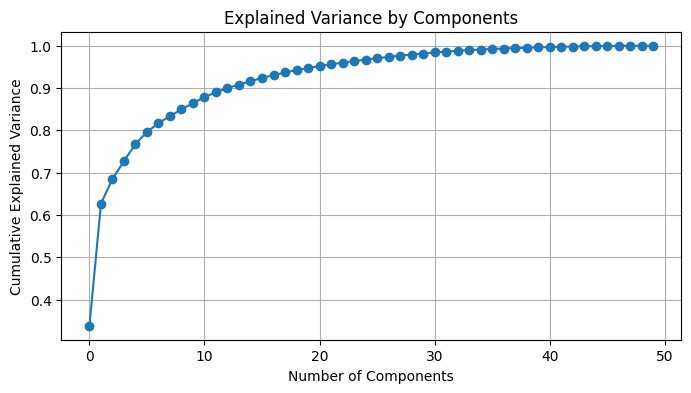

In [197]:
from sklearn.decomposition import PCA

pca = PCA()
X_pca = pca.fit_transform(second_full_numeric_data)

print("Explained Variance Ratio:", pca.explained_variance_ratio_)

cumulative_variance = pca.explained_variance_ratio_.cumsum()
print("Cumulative Explained Variance:", cumulative_variance)

import matplotlib.pyplot as plt
plt.figure(figsize=(8,4))
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()

In [198]:
pca = PCA(n_components=10)
X_pca = pca.fit_transform(second_full_numeric_data)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

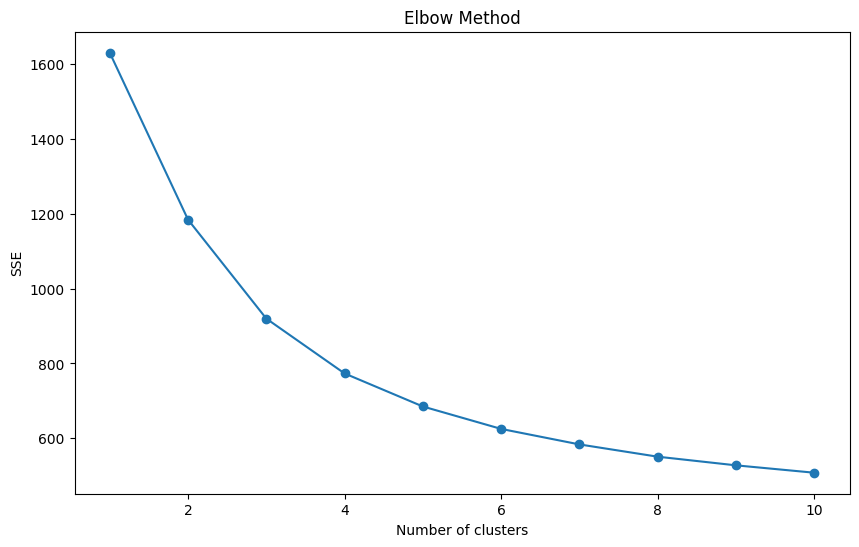

In [199]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

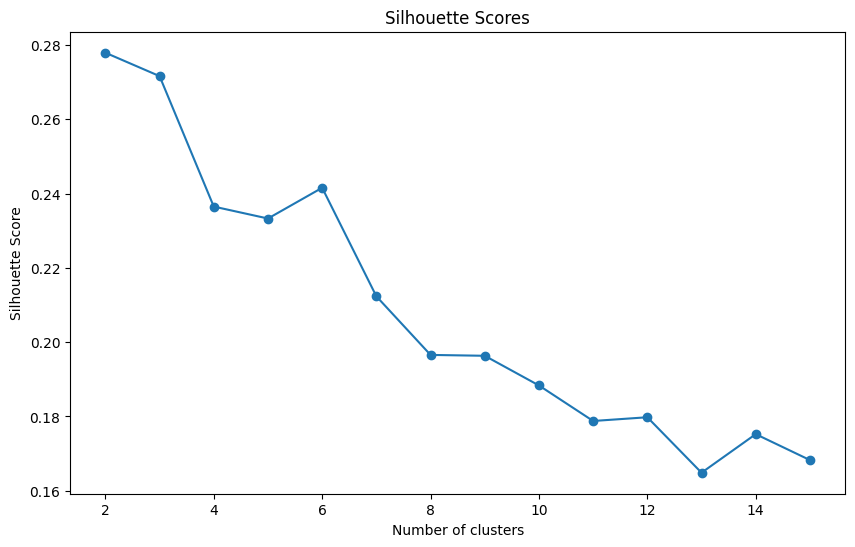

In [200]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    score = silhouette_score(X_pca, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [201]:
kmeans = KMeans(n_clusters=14, random_state=42)
kmeans.fit(X_pca)
second_full_data['cluster'] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-201-f7aa42f5c931>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_full_data['cluster'] = kmeans.labels_


In [202]:
full_pca_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=[f'PCA_{i+1}' for i in range(kmeans.cluster_centers_.shape[1])])
print(full_pca_cluster_centers)

       PCA_1     PCA_2     PCA_3     PCA_4     PCA_5     PCA_6     PCA_7  \
0  -0.327607  0.545487 -0.013771 -0.074969 -0.018349  0.047506 -0.016130   
1   0.039531 -0.226656 -0.100801 -0.040952  0.224841 -0.007733 -0.026899   
2   0.834629  0.993029  0.199310  0.001080 -0.068850 -0.176915  0.035061   
3   1.371452 -0.021619  0.188993  0.016011  0.359438  0.113658  0.088869   
4  -0.637529 -0.362223  0.008111  0.056918  0.078026 -0.165315  0.009812   
5   0.805668 -0.260991 -0.349810 -0.123021  0.196476  0.007596 -0.026564   
6   0.281181  0.443650 -0.074577  0.001470  0.017076 -0.037285 -0.018979   
7  -0.239572 -0.691524  0.120863 -0.093943 -0.144949 -0.069063  0.030663   
8   0.463577 -0.873764  0.227166 -0.181614 -0.118202  0.036379 -0.035294   
9  -0.728546  0.271869 -0.008593  0.021854  0.050962  0.126599  0.011177   
10  0.153372  1.013226  0.113289 -0.330068 -0.205692 -0.121244 -0.053830   
11  0.369126 -0.192007 -0.154594  0.212623 -0.142838  0.097799 -0.008160   
12 -0.301891

In [203]:
print(second_full_data[['player', 'cluster']])

                  player  cluster
0         Aaron Connolly        9
1        Aaron Cresswell       13
2           Aaron Hickey        4
3       Aaron Leya Iseka        9
4           Aarón Martín       12
...                  ...      ...
1822       Yves Bissouma        5
1823     Zaydou Youssouf       12
1824          Zeki Çelik       13
1825     Zinedine Ferhat        2
1826  Zlatan Ibrahimović       10

[1827 rows x 2 columns]


In [204]:
players_in_cluster_3 = second_full_data[second_full_data['cluster'] == 13]['player']

players_in_cluster_3.head(20)

1          Aaron Cresswell
6        Aaron Wan-Bissaka
14           Achraf Hakimi
16            Adam Marušić
126        Andros Townsend
133               Angeliño
140           Anthony Caci
148       Antonio Candreva
185           Ben Chilwell
210             Borna Sosa
245           Carlos Clerc
274       Christian Günter
282    Christopher Trimmel
297       Cristian Ansaldi
301      Cristiano Biraghi
323       Daniel Caligiuri
346          Darko Lazović
359         Davide Faraoni
416          Dwight McNeil
439                Emerson
Name: player, dtype: object

In [205]:
print(second_full_data['cluster'].value_counts())

cluster
9     229
0     187
12    174
4     172
7     171
1     142
8     140
11    129
6     127
5      93
2      82
10     75
13     57
3      49
Name: count, dtype: int64


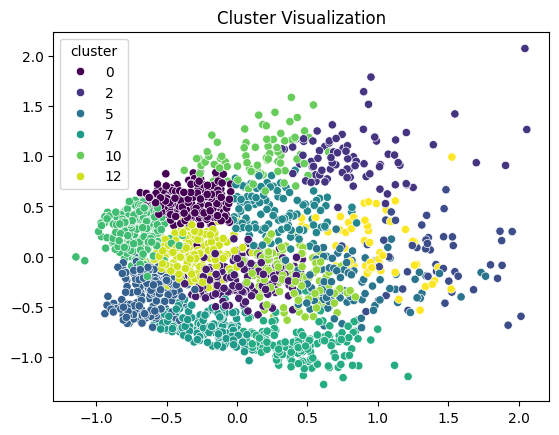

In [206]:
sns.scatterplot(x=principal_components[:,0], y=principal_components[:,1], hue=second_full_data['cluster'], palette='viridis')
plt.title('Cluster Visualization')
plt.show()

In [207]:
original_space_centers = kmeans.cluster_centers_.dot(pca.components_)

In [208]:
original_space_centers = scaler.inverse_transform(pca.inverse_transform(kmeans.cluster_centers_))
original_cluster_centers = pd.DataFrame(original_space_centers, columns=second_full_data.columns.drop(['player', 'cluster']))

print(original_cluster_centers)

     assists        npG        xA       npxG      shots  shot_on_target_pct  \
0   2.213073   4.703160  2.151593   4.566215  35.378138           40.149117   
1   0.870685   0.535662  0.956762   0.776086  13.461379           23.443190   
2   7.335687   7.848234  6.336147   7.241843  66.290483           35.010536   
3   4.484521   2.625306  4.189834   2.294875  32.808701           31.635623   
4   0.526380  -0.301841  0.345585   0.107618   4.025931           12.949385   
5   1.465973   1.131975  1.572547   1.315763  21.852008           26.304252   
6   3.285571   3.945444  3.082184   3.871696  37.422675           32.781028   
7   0.539295   1.066647  0.293479   0.907202   7.875476           26.860415   
8   0.258761   1.776697  0.381849   1.530731  15.765126           30.967939   
9   0.598846   2.132719  0.852789   2.179005  16.817098           39.501279   
10  4.877631  10.463779  4.201278  10.004466  73.036808           39.970297   
11  1.652157   0.670690  1.716916   0.751089  12.362

In [209]:
cluster_groups = second_full_data.groupby('cluster')
cluster_summary = cluster_groups.describe()

print(cluster_summary)


        assists                                                  npG  \
          count      mean       std  min  25%  50%  75%   max  count   
cluster                                                                
0         187.0  2.278075  1.605669  0.0  1.0  2.0  3.0   9.0  187.0   
1         142.0  0.823944  0.893628  0.0  0.0  1.0  1.0   4.0  142.0   
2          82.0  7.292683  3.206813  1.0  5.0  7.0  9.0  19.0   82.0   
3          49.0  4.326531  2.625101  0.0  2.0  4.0  6.0  10.0   49.0   
4         172.0  0.273256  0.552279  0.0  0.0  0.0  0.0   2.0  172.0   
5          93.0  1.580645  1.279628  0.0  1.0  1.0  2.0   5.0   93.0   
6         127.0  3.196850  1.838907  0.0  2.0  3.0  5.0  11.0  127.0   
7         171.0  0.245614  0.506918  0.0  0.0  0.0  0.0   3.0  171.0   
8         140.0  0.650000  0.864362  0.0  0.0  0.0  1.0   4.0  140.0   
9         229.0  0.895197  0.967645  0.0  0.0  1.0  1.0   5.0  229.0   
10         75.0  4.813333  2.453312  0.0  3.0  5.0  7.0  11.0   

In [210]:
second_full_data['mins']=data_outfield['mins']


<ipython-input-210-3d6b99d70773>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  second_full_data['mins']=data_outfield['mins']


In [211]:
average_min_per_cluster = second_full_data.groupby('cluster')['mins'].mean().reset_index()

# Rename columns for clarity
average_min_per_cluster.columns = ['cluster', 'average_min']

print(average_min_per_cluster)

    cluster  average_min
0         0  1489.518717
1         1  1649.845070
2         2  2526.036585
3         3  2779.897959
4         4   830.325581
5         5  2448.860215
6         6  2033.921260
7         7  1675.175439
8         8  2652.921429
9         9   789.803493
10       10  2435.986667
11       11  2119.038760
12       12  1237.666667
13       13  2696.315789


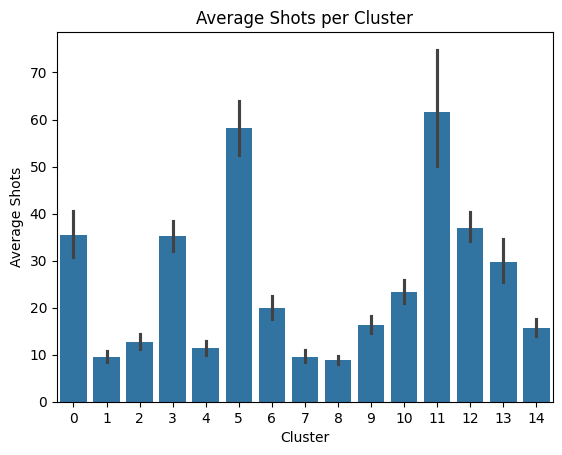

In [212]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Visualize average 'shots' across clusters
sns.barplot(x=second_p_90_data['cluster'], y=second_full_data['shots'])
plt.title('Average Shots per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Shots')
plt.show()

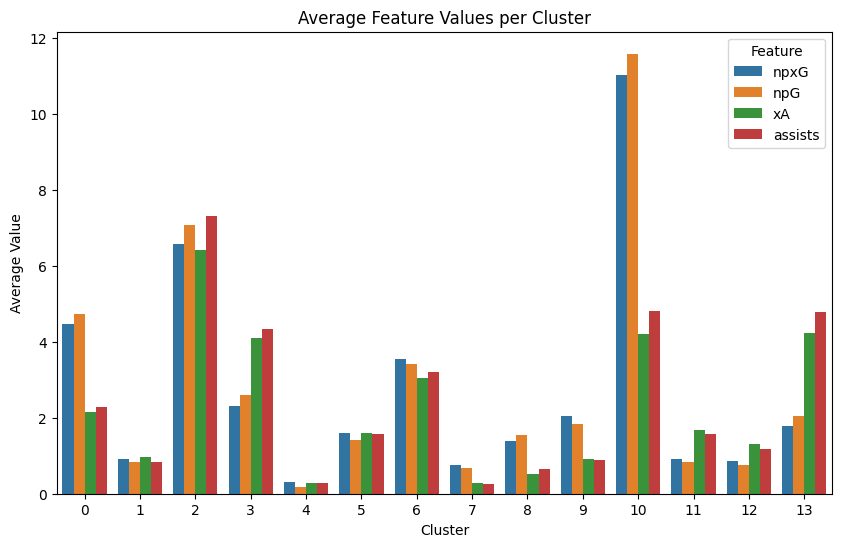

In [213]:
feature_means = second_full_data.groupby('cluster')[['npxG', 'npG', 'xA', 'assists']].mean().reset_index()

melted_data = feature_means.melt(id_vars="cluster", var_name="feature", value_name="average")

plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='average', hue='feature', data=melted_data)
plt.title('Average Feature Values per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Value')
plt.legend(title='Feature')
plt.show()

# **PCA_Full_Category**

In [151]:
second_full_categories = {
    'G/A': ['assists', 'npG'],
    'xG/xA': ['xA', 'npxG'],
    'Shooting': [
        'shots', 'shot_on_target_pct', 'goals_p_shot', 'npxG_p_shot',
        'sca_shot', 'gca_shot'
    ],
    'Passing': [
        'pass_cmp', 'pass_cmp_pct', 'short_cmp', 'med_cmp', 'long_cmp', 'sca_live_pass',
        'gca_live_pass'
    ],
    'Progressive Passing': [
        'key_pass', 'pass_final_3rd', 'prog_pass', 'through_ball_cmp'
    ],
    'High Balls': ['cross_box', 'switches', 'crosses'],
    'Giveaway': ['intercepted_pass', 'blocked_pass', 'disposs'],
    'Dribbling': [
        'sca_dribble', 'gca_dribble', 'success_dribble', 'players_dribble_past'
    ],
    'Defending': [
        'sca_def', 'gca_def', 'blocks', 'intercepts', 'clearances'
    ],
    '1v1 Defending': [
        'tackle_won', 'dribblers_tackled'
    ],
    'Defensive 3rd': [
        'def_3rd_tackle', 'def_3rd_press', 'pct_touch_def_3rd'
    ],
    'Middle 3rd': [
        'mid_3rd_tackle', 'mid_3rd_press', 'pct_touch_mid_3rd'
    ],
    'Attacking 3rd': [
        'att_3rd_tackle', 'att_3rd_press', 'pct_touch_att_3rd'
    ],
    'Pressing': ['success_press'],
    'Carry': ['carry', 'prog_carry']
}


In [152]:
second_full_pca_clustered_data=pd.DataFrame(index=second_full_data['cluster'].unique())

In [153]:
for category, features in second_full_categories.items():
    second_full_pca_clustered_data[category] = second_full_data.groupby('cluster')[features].mean().mean(axis=1)

In [154]:
for category in second_full_categories:
    second_full_pca_clustered_data[category] = second_full_pca_clustered_data[category] / second_full_pca_clustered_data[category].max()

In [155]:
second_full_pca_clustered_data.reset_index(inplace=True)
second_full_pca_clustered_data.rename(columns={"index": "cluster"}, inplace=True)

In [156]:
second_full_pca_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
0,12,0.179485,0.205251,0.462672,0.146518,0.116946,0.124754,0.252508,0.187399,0.093090,0.132394,0.166851,0.321022,0.427797,0.231989,0.175215
1,2,0.426323,0.410033,0.465702,0.841104,0.751393,1.000000,0.898791,0.488796,0.590912,0.765172,0.787109,0.569354,0.486221,0.675809,0.870136
2,7,0.027190,0.038560,0.150192,0.227210,0.140095,0.111945,0.145421,0.066154,0.224038,0.204429,0.379884,0.285693,0.115203,0.205494,0.197480
3,9,0.104106,0.124002,0.310598,0.364260,0.293639,0.276059,0.355633,0.219341,0.267872,0.364052,0.464002,0.453930,0.289096,0.390369,0.365393
4,1,0.426564,0.445277,0.635633,0.253697,0.245484,0.272849,0.502469,0.446087,0.153374,0.219082,0.232701,0.478118,0.667401,0.420021,0.354996
5,4,0.053919,0.065789,0.295623,0.461106,0.245690,0.191368,0.171548,0.074469,0.573397,0.334620,0.619963,0.316334,0.063849,0.332783,0.408683
6,8,0.148309,0.172443,0.386076,0.632746,0.546783,0.310156,0.450079,0.311821,0.440107,0.734490,0.757689,0.822043,0.357693,0.769237,0.628418
7,11,0.148536,0.169721,0.371524,0.557151,0.441677,0.496566,0.601755,0.313022,0.549200,0.652728,0.751125,0.489658,0.353162,0.560100,0.550959
8,13,0.136050,0.119533,0.365750,1.000000,0.614271,0.370768,0.292371,0.125336,0.770819,0.451869,0.678385,0.400099,0.082996,0.441562,0.935653
9,5,0.867147,0.836596,0.882694,0.568448,0.687581,0.729474,1.000000,1.000000,0.260202,0.446711,0.415971,0.685523,0.874465,0.717012,0.808356


In [157]:
pca_p_90_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.541580,0.588512,0.844729,0.755500,0.782324,1.000000,0.803455,0.534519,0.301143,0.372779,0.274280,0.761052,0.788902,0.822043,0.609780
4,1,0.128368,0.143162,0.713974,0.716893,0.485114,0.642989,0.710810,0.321232,0.747340,0.848184,0.665196,0.726187,0.445191,0.613702,0.671951
2,2,0.092986,0.134576,0.450850,0.709144,0.490137,0.412304,0.472865,0.223599,0.577481,0.549859,0.556030,0.888912,0.350089,0.558085,0.642746
6,3,0.435940,0.505962,0.825596,0.593657,0.446886,0.609818,0.889793,0.938702,0.306040,0.487965,0.280890,0.751730,0.863231,0.680057,0.692971
5,4,0.099243,0.098722,0.591905,1.000000,0.628427,0.411662,0.293469,0.109813,0.801227,0.484695,0.822804,0.810316,0.100875,0.925529,0.461742
12,5,0.826442,0.844244,1.000000,0.583091,0.389966,0.477241,0.781425,0.601113,0.229648,0.252892,0.177349,0.680579,0.958485,0.587386,0.562150
13,6,0.210662,0.248515,0.633858,0.995649,1.000000,0.647603,0.599677,0.350913,0.511875,0.745139,0.468104,0.967491,0.399500,1.000000,0.775240
14,7,0.075151,0.088466,0.586860,0.783948,0.423924,0.330499,0.329168,0.124267,0.990881,0.734496,0.957808,0.727454,0.120108,0.622705,0.633179
8,8,0.064916,0.079980,0.570928,0.754320,0.310034,0.321517,0.201527,0.067988,1.000000,0.408425,1.000000,0.662508,0.065922,0.544343,0.423363
10,9,0.134967,0.165687,0.647720,0.779738,0.562402,0.376288,0.536184,0.322959,0.592876,1.000000,0.585959,1.000000,0.331353,0.671194,1.000000


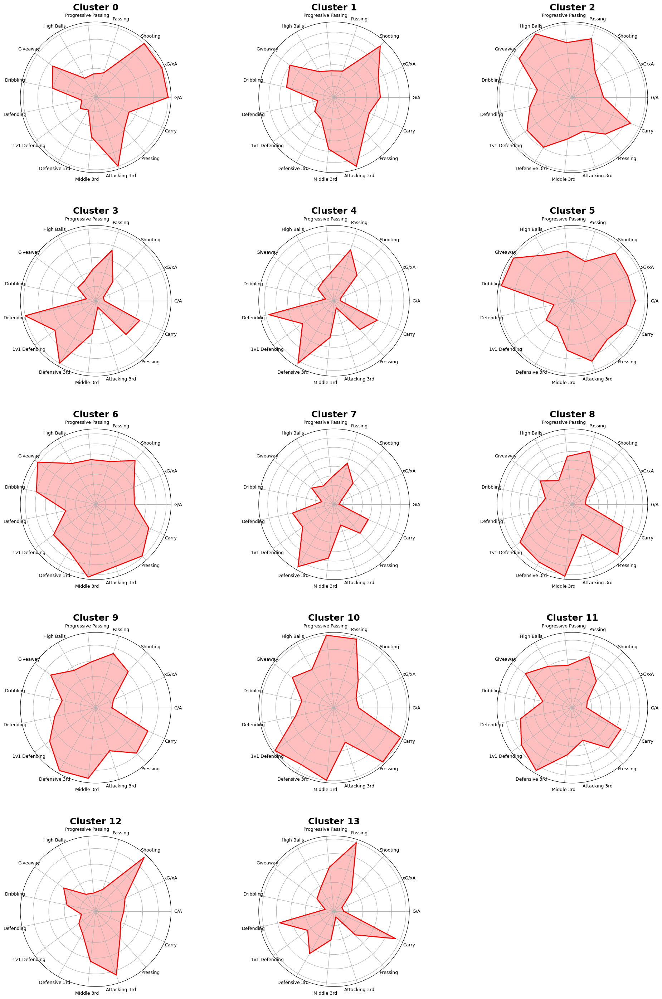

In [158]:
import matplotlib.pyplot as plt
import numpy as np

# Function to create a radar chart
def make_radar_chart(ax, stats, feature_names, num_vars, max_val):
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]
    stats = [s / max_val for s in stats]
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=9, rotation=45, ha="center")

# Assume 'full_merged_clustered_data' is your DataFrame with cluster labels
second_full_pca_clustered_data = second_full_pca_clustered_data.sort_values('cluster')
clusters = second_full_pca_clustered_data['cluster'].unique()
feature_names = second_full_pca_clustered_data.columns[1:]
num_vars = len(feature_names)
max_val = second_full_pca_clustered_data[feature_names].max().max()

# Adjust the number of rows and columns based on the number of clusters
n_clusters = len(clusters)
n_cols = 3
n_rows = (n_clusters // n_cols) + (n_clusters % n_cols > 0)

# Create a figure with appropriate size
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, subplot_kw=dict(polar=True), figsize=(25, n_rows * 7))
fig.subplots_adjust(hspace=0.35, wspace=0.1)

# Loop through clusters and create a radar chart for each
for i, cluster_label in enumerate(clusters):
    ax = axes.flatten()[i]
    cluster_data = second_full_pca_clustered_data[second_full_pca_clustered_data['cluster'] == cluster_label]
    stats = cluster_data.mean().drop('cluster').tolist()
    make_radar_chart(ax, stats, feature_names, num_vars, max_val)
    ax.set_title(f'Cluster {cluster_label}', size=18, fontweight='bold', position=(0.5, 100))  # Move title higher

# Hide any unused axes
for j in range(n_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()


In [159]:
players_in_cluster_3 = second_full_data[second_full_data['cluster'] ==0]

players_in_cluster_3.head(20)

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs,cluster,mins
69,Alexander Isak,2,17,2.3,14.8,78,50.0,0.22,0.19,330,...,4.0,49.0,54.0,34,40,499,72,38,0,2340
87,Álvaro Morata,9,10,4.9,10.3,54,42.6,0.19,0.19,457,...,8.0,48.0,51.0,27,27,580,74,39,0,2014
107,André Silva,7,21,5.5,19.0,107,49.5,0.20,0.18,583,...,5.0,44.0,56.0,30,32,697,97,58,0,2760
109,Andrea Belotti,6,9,7.1,10.0,102,33.3,0.09,0.10,501,...,7.0,52.0,49.0,51,51,844,162,62,0,2888
122,Andrej Kramarić,5,15,4.8,12.4,92,43.5,0.16,0.14,779,...,9.0,46.0,54.0,41,42,1019,172,48,0,2379
127,Andy Delort,9,15,5.8,10.2,91,37.4,0.16,0.11,558,...,7.0,44.0,53.0,38,39,657,86,41,0,2482
138,Ante Rebić,4,11,5.3,7.3,44,52.3,0.25,0.17,307,...,7.0,30.0,67.0,25,26,471,86,44,0,1776
143,Antoine Griezmann,7,12,5.5,12.4,68,44.1,0.18,0.18,1176,...,9.0,41.0,55.0,25,27,1118,101,24,0,2604
214,Boulaye Dia,1,9,1.6,9.5,58,37.9,0.16,0.16,502,...,14.0,48.0,48.0,48,49,747,94,69,0,2930
260,Che Adams,5,9,5.6,8.9,56,55.4,0.16,0.16,444,...,10.0,46.0,50.0,25,28,630,67,52,0,2667


In [160]:
second_p_90_data[second_p_90_data['player']=='Lionel Messi']

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90,cluster,mins
975,Lionel Messi,0.27,0.8,0.32,0.58,5.65,44.7,0.14,0.1,59.2,...,2.0,48.0,60.0,4.38,4.64,72.4,15.4,2.83,11,3023


In [161]:
first_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.570952,0.585407,0.835072,0.768035,0.747693,0.695808,0.800954,0.530285,0.309815,0.504062,0.285800,0.826782,0.753183,0.802768,0.746429
5,1,0.103680,0.102987,0.578941,0.972356,0.582940,0.372665,0.304582,0.111711,0.798780,0.509842,0.835140,0.795045,0.104247,0.876354,0.475712
0,2,0.612086,0.701433,0.967173,0.468022,0.195995,0.163234,0.555618,0.310879,0.205756,0.196305,0.158105,0.739377,0.870686,0.323486,0.556250
6,3,0.478069,0.535484,0.834567,0.602102,0.443245,0.559942,0.926925,1.000000,0.299611,0.512513,0.283131,0.748689,0.878736,0.696039,0.706809
2,4,0.104507,0.137985,0.468821,0.713032,0.466478,0.369131,0.469596,0.216164,0.591364,0.547725,0.573551,0.869047,0.345983,0.554018,0.629590
9,5,0.072411,0.086120,0.600566,0.748692,0.313031,0.278354,0.224396,0.077027,1.000000,0.486424,1.000000,0.667168,0.073615,0.539286,0.476894
4,6,0.197530,0.208102,0.653123,0.802361,0.564953,0.744898,0.749547,0.345810,0.641245,0.690933,0.567168,0.727165,0.513964,0.733325,0.617176
1,7,0.322429,0.373556,0.810985,0.655172,0.486759,1.000000,0.751237,0.375954,0.490748,0.472767,0.450161,0.672788,0.690545,0.616230,0.521844
7,8,0.425658,0.490948,0.865274,0.499545,0.284645,0.354886,0.769481,0.480303,0.292069,0.354130,0.262473,0.754700,0.866590,0.463129,0.693702
8,9,0.279391,0.339778,0.704049,0.620951,0.430472,0.411935,0.728681,0.453425,0.434945,0.633265,0.410927,0.850165,0.641276,0.567635,0.824560


In [162]:
first_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.570952,0.585407,0.835072,0.768035,0.747693,0.695808,0.800954,0.530285,0.309815,0.504062,0.285800,0.826782,0.753183,0.802768,0.746429
5,1,0.103680,0.102987,0.578941,0.972356,0.582940,0.372665,0.304582,0.111711,0.798780,0.509842,0.835140,0.795045,0.104247,0.876354,0.475712
0,2,0.612086,0.701433,0.967173,0.468022,0.195995,0.163234,0.555618,0.310879,0.205756,0.196305,0.158105,0.739377,0.870686,0.323486,0.556250
6,3,0.478069,0.535484,0.834567,0.602102,0.443245,0.559942,0.926925,1.000000,0.299611,0.512513,0.283131,0.748689,0.878736,0.696039,0.706809
2,4,0.104507,0.137985,0.468821,0.713032,0.466478,0.369131,0.469596,0.216164,0.591364,0.547725,0.573551,0.869047,0.345983,0.554018,0.629590
9,5,0.072411,0.086120,0.600566,0.748692,0.313031,0.278354,0.224396,0.077027,1.000000,0.486424,1.000000,0.667168,0.073615,0.539286,0.476894
4,6,0.197530,0.208102,0.653123,0.802361,0.564953,0.744898,0.749547,0.345810,0.641245,0.690933,0.567168,0.727165,0.513964,0.733325,0.617176
1,7,0.322429,0.373556,0.810985,0.655172,0.486759,1.000000,0.751237,0.375954,0.490748,0.472767,0.450161,0.672788,0.690545,0.616230,0.521844
7,8,0.425658,0.490948,0.865274,0.499545,0.284645,0.354886,0.769481,0.480303,0.292069,0.354130,0.262473,0.754700,0.866590,0.463129,0.693702
8,9,0.279391,0.339778,0.704049,0.620951,0.430472,0.411935,0.728681,0.453425,0.434945,0.633265,0.410927,0.850165,0.641276,0.567635,0.824560


In [163]:
second_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
6,0,0.131985,0.157248,0.362397,0.535522,0.450432,0.371301,0.447077,0.283264,0.423957,0.593088,0.704109,0.719983,0.335362,0.657215,0.524232
2,1,0.036967,0.060502,0.184159,0.228038,0.166912,0.185498,0.219372,0.128850,0.197859,0.230450,0.372972,0.362874,0.201850,0.266033,0.212792
13,2,1.000000,1.000000,1.000000,0.325710,0.289289,0.355115,0.730021,0.590656,0.186042,0.221941,0.182710,0.518833,1.000000,0.552098,0.457071
9,3,0.487381,0.511904,0.654884,0.429833,0.432333,0.576322,0.794761,0.686211,0.301434,0.489209,0.535688,0.770721,0.764410,0.740769,0.571935
12,4,0.114174,0.116712,0.351313,0.660537,0.370072,0.361576,0.304787,0.126140,1.000000,0.635746,1.000000,0.445905,0.095306,0.602176,0.589172
4,5,0.414874,0.431469,0.623779,0.248454,0.230299,0.340889,0.512168,0.456071,0.164376,0.221976,0.256432,0.493287,0.669872,0.425170,0.340793
8,6,0.927603,0.886616,0.902663,0.561600,0.659541,1.000000,1.000000,1.000000,0.247284,0.355671,0.370949,0.617545,0.842981,0.638767,0.777197
5,7,0.060387,0.072133,0.298108,0.479160,0.253769,0.256596,0.191867,0.081570,0.609798,0.330806,0.641262,0.333666,0.070778,0.348018,0.422954
1,8,0.265935,0.277331,0.403897,0.608673,0.499690,0.900569,0.742975,0.389532,0.585640,0.639655,0.780443,0.521641,0.418142,0.583899,0.613559
0,9,0.193849,0.220399,0.468301,0.132700,0.104238,0.143052,0.256254,0.189489,0.089052,0.117088,0.156454,0.320181,0.448592,0.227410,0.160559


In [164]:
pca_p_90_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.541580,0.588512,0.844729,0.755500,0.782324,1.000000,0.803455,0.534519,0.301143,0.372779,0.274280,0.761052,0.788902,0.822043,0.609780
4,1,0.128368,0.143162,0.713974,0.716893,0.485114,0.642989,0.710810,0.321232,0.747340,0.848184,0.665196,0.726187,0.445191,0.613702,0.671951
2,2,0.092986,0.134576,0.450850,0.709144,0.490137,0.412304,0.472865,0.223599,0.577481,0.549859,0.556030,0.888912,0.350089,0.558085,0.642746
6,3,0.435940,0.505962,0.825596,0.593657,0.446886,0.609818,0.889793,0.938702,0.306040,0.487965,0.280890,0.751730,0.863231,0.680057,0.692971
5,4,0.099243,0.098722,0.591905,1.000000,0.628427,0.411662,0.293469,0.109813,0.801227,0.484695,0.822804,0.810316,0.100875,0.925529,0.461742
12,5,0.826442,0.844244,1.000000,0.583091,0.389966,0.477241,0.781425,0.601113,0.229648,0.252892,0.177349,0.680579,0.958485,0.587386,0.562150
13,6,0.210662,0.248515,0.633858,0.995649,1.000000,0.647603,0.599677,0.350913,0.511875,0.745139,0.468104,0.967491,0.399500,1.000000,0.775240
14,7,0.075151,0.088466,0.586860,0.783948,0.423924,0.330499,0.329168,0.124267,0.990881,0.734496,0.957808,0.727454,0.120108,0.622705,0.633179
8,8,0.064916,0.079980,0.570928,0.754320,0.310034,0.321517,0.201527,0.067988,1.000000,0.408425,1.000000,0.662508,0.065922,0.544343,0.423363
10,9,0.134967,0.165687,0.647720,0.779738,0.562402,0.376288,0.536184,0.322959,0.592876,1.000000,0.585959,1.000000,0.331353,0.671194,1.000000


In [165]:
second_full_pca_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
12,0,1.000000,1.000000,1.000000,0.355284,0.323281,0.303374,0.734583,0.611956,0.196097,0.261830,0.202712,0.550079,1.000000,0.591313,0.503079
4,1,0.426564,0.445277,0.635633,0.253697,0.245484,0.272849,0.502469,0.446087,0.153374,0.219082,0.232701,0.478118,0.667401,0.420021,0.354996
1,2,0.426323,0.410033,0.465702,0.841104,0.751393,1.000000,0.898791,0.488796,0.590912,0.765172,0.787109,0.569354,0.486221,0.675809,0.870136
11,3,0.118828,0.117434,0.355675,0.735637,0.432782,0.313998,0.307662,0.131129,1.000000,0.697586,1.000000,0.455576,0.092629,0.628952,0.669292
5,4,0.053919,0.065789,0.295623,0.461106,0.245690,0.191368,0.171548,0.074469,0.573397,0.334620,0.619963,0.316334,0.063849,0.332783,0.408683
9,5,0.867147,0.836596,0.882694,0.568448,0.687581,0.729474,1.000000,1.000000,0.260202,0.446711,0.415971,0.685523,0.874465,0.717012,0.808356
10,6,0.384479,0.415999,0.584062,0.447038,0.446129,0.468208,0.711894,0.601949,0.303752,0.517096,0.532835,0.727288,0.647582,0.690440,0.576753
2,7,0.027190,0.038560,0.150192,0.227210,0.140095,0.111945,0.145421,0.066154,0.224038,0.204429,0.379884,0.285693,0.115203,0.205494,0.197480
6,8,0.148309,0.172443,0.386076,0.632746,0.546783,0.310156,0.450079,0.311821,0.440107,0.734490,0.757689,0.822043,0.357693,0.769237,0.628418
3,9,0.104106,0.124002,0.310598,0.364260,0.293639,0.276059,0.355633,0.219341,0.267872,0.364052,0.464002,0.453930,0.289096,0.390369,0.365393


# **FULLY MERGED**

In [166]:
merged_full= [
    'player',
    'assists_p_90',
    'npG_p_90',
    'xA_p_90',
    'npxG_p_90',
    'shots_p_90',
    'shot_on_target_pct',
    'goals_p_shot',
    'avg_shot_dist',
    'npxG_p_shot',
    'pass_cmp_p_90',
    'pass_cmp_pct',
    'short_cmp_p_90',
    'med_cmp_p_90',
    'long_cmp_p_90',
    'key_pass_p_90',
    'pass_final_3rd_p_90',
    'prog_pass_p_90',
    'cross_box_p_90',
    'through_ball_cmp_p_90',
    'switches_p_90',
    'crosses_p_90',
    'intercepted_pass_p_90',
    'blocked_pass_p_90',
    'sca_dribble_p_90',
    'sca_shot_p_90',
    'sca_live_pass_p_90',
    'sca_def_p_90',
    'gca_live_pass_p_90',
    'gca_dribble_p_90',
    'gca_shot_p_90',
    'gca_def_p_90',
    'tackle_won_p_90',
    'def_3rd_tackle_p_90',
    'mid_3rd_tackle_p_90',
    'att_3rd_tackle_p_90',
    'dribblers_tackled_p_90',
    'success_press_p_90',
    'def_3rd_press_p_90',
    'mid_3rd_press_p_90',
    'att_3rd_press_p_90',
    'blocks_p_90',
    'intercepts_p_90',
    'clearances_p_90',
    'pct_touch_def_3rd',
    'pct_touch_mid_3rd',
    'pct_touch_att_3rd',
    'success_dribble_p_90',
    'players_dribble_past_p_90',
    'carry_p_90',
    'prog_carry_p_90',
    'disposs_p_90',
    'assists',
    'npG',
    'xA',
    'npxG',
    'shots',
    'pass_cmp',
    'short_cmp',
    'med_cmp',
    'long_cmp',
    'key_pass',
    'pass_final_3rd',
    'prog_pass',
    'cross_box',
    'through_ball_cmp',
    'switches',
    'crosses',
    'intercepted_pass',
    'blocked_pass',
    'sca_dribble',
    'sca_shot',
    'sca_live_pass',
    'sca_def',
    'gca_live_pass',
    'gca_dribble',
    'gca_shot',
    'gca_def',
    'tackle_won',
    'def_3rd_tackle',
    'mid_3rd_tackle',
    'att_3rd_tackle',
    'dribblers_tackled',
    'success_press',
    'def_3rd_press',
    'mid_3rd_press',
    'att_3rd_press',
    'blocks',
    'intercepts',
    'clearances',
    'success_dribble',
    'players_dribble_past',
    'carry',
    'prog_carry',
    'disposs'
]


In [167]:
merged_full_data = data_outfield[merged_full]

In [168]:
merged_full_data

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,avg_shot_dist,npxG_p_shot,...,mid_3rd_press,att_3rd_press,blocks,intercepts,clearances,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,Aaron Connolly,0.11,0.23,0.02,0.40,2.61,34.8,0.09,13.7,0.15,...,58,59,9,0,1,8,8,124,17,15
1,Aaron Cresswell,0.23,0.00,0.17,0.03,0.54,21.1,0.00,24.6,0.05,...,90,18,48,36,99,6,8,1267,97,9
2,Aaron Hickey,0.00,0.00,0.04,0.01,0.36,33.3,0.00,28.1,0.03,...,34,15,17,12,15,8,10,322,34,13
3,Aaron Leya Iseka,0.00,0.18,0.06,0.21,1.61,33.3,0.11,14.8,0.13,...,56,61,6,2,4,14,16,205,30,20
4,Aarón Martín,0.18,0.00,0.07,0.01,0.35,16.7,0.00,22.4,0.03,...,93,22,26,17,50,15,15,631,81,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,Yves Bissouma,0.00,0.03,0.03,0.04,1.21,7.1,0.02,25.3,0.03,...,256,55,56,60,67,50,53,1470,157,31
1823,Zaydou Youssouf,0.07,0.07,0.05,0.06,1.09,26.7,0.07,22.8,0.06,...,121,32,24,22,13,24,24,495,33,31
1824,Zeki Çelik,0.08,0.11,0.10,0.03,0.60,37.5,0.19,20.6,0.05,...,213,62,63,33,70,28,31,1195,167,20
1825,Zinedine Ferhat,0.30,0.15,0.18,0.13,1.85,36.1,0.08,19.8,0.07,...,159,117,45,34,35,64,73,1171,149,68


In [169]:
merged_full_numeric_data = merged_full_data.drop('player', axis=1)

In [170]:
scaler = MinMaxScaler(feature_range=(0, 1))
merged_full_minmax_scaled_features = scaler.fit_transform(merged_full_numeric_data)

In [171]:
for col in second_full_numeric_data:
  merged_full_numeric_data[col]=merged_full_numeric_data[col]/merged_full_numeric_data[col].max()

In [172]:
merged_full_numeric_data

,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,avg_shot_dist,npxG_p_shot,pass_cmp_p_90,...,mid_3rd_press,att_3rd_press,blocks,intercepts,clearances,success_dribble,players_dribble_past,carry,prog_carry,disposs
0,0.11,0.23,0.02,0.40,2.61,0.348,0.09,13.7,0.312500,8.98,...,0.107407,0.171014,0.079646,0.000000,0.003745,0.05000,0.046243,0.050966,0.032882,0.141509
1,0.23,0.00,0.17,0.03,0.54,0.211,0.00,24.6,0.104167,43.80,...,0.166667,0.052174,0.424779,0.395604,0.370787,0.03750,0.046243,0.520756,0.187621,0.084906
2,0.00,0.00,0.04,0.01,0.36,0.333,0.00,28.1,0.062500,40.40,...,0.062963,0.043478,0.150442,0.131868,0.056180,0.05000,0.057803,0.132347,0.065764,0.122642
3,0.00,0.18,0.06,0.21,1.61,0.333,0.11,14.8,0.270833,13.50,...,0.103704,0.176812,0.053097,0.021978,0.014981,0.08750,0.092486,0.084258,0.058027,0.188679
4,0.18,0.00,0.07,0.01,0.35,0.167,0.00,22.4,0.062500,40.40,...,0.172222,0.063768,0.230088,0.186813,0.187266,0.09375,0.086705,0.259351,0.156673,0.103774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1822,0.00,0.03,0.03,0.04,1.21,0.071,0.02,25.3,0.062500,42.20,...,0.474074,0.159420,0.495575,0.659341,0.250936,0.31250,0.306358,0.604192,0.303675,0.292453
1823,0.07,0.07,0.05,0.06,1.09,0.267,0.07,22.8,0.125000,28.60,...,0.224074,0.092754,0.212389,0.241758,0.048689,0.15000,0.138728,0.203453,0.063830,0.292453
1824,0.08,0.11,0.10,0.03,0.60,0.375,0.19,20.6,0.104167,49.40,...,0.394444,0.179710,0.557522,0.362637,0.262172,0.17500,0.179191,0.491163,0.323017,0.188679
1825,0.30,0.15,0.18,0.13,1.85,0.361,0.08,19.8,0.145833,25.00,...,0.294444,0.339130,0.398230,0.373626,0.131086,0.40000,0.421965,0.481299,0.288201,0.641509


Explained Variance Ratio: [8.00881570e-01 9.05951291e-02 4.02336202e-02 2.40564367e-02
 1.59848466e-02 8.15913696e-03 4.85333171e-03 2.94772355e-03
 2.28826945e-03 1.63127050e-03 1.45924545e-03 1.21796552e-03
 7.49961381e-04 6.67259266e-04 5.66150024e-04 4.47425007e-04
 4.06455944e-04 3.55061279e-04 3.02916517e-04 2.94546245e-04
 2.68681137e-04 2.49393765e-04 2.38579137e-04 2.11485915e-04
 1.64622887e-04 9.90353706e-05 6.79454746e-05 6.46085045e-05
 5.82332628e-05 5.16913027e-05 4.83094910e-05 3.62874600e-05
 3.31387907e-05 3.03327420e-05 2.73550089e-05 2.63603303e-05
 2.21337573e-05 1.98276497e-05 1.82378430e-05 1.77150672e-05
 1.48851606e-05 1.44989874e-05 1.17300182e-05 9.41929303e-06
 8.91410667e-06 7.86889102e-06 7.58196786e-06 6.87080738e-06
 6.68384660e-06 6.01633329e-06 5.12858327e-06 4.54429034e-06
 4.33036113e-06 3.45890371e-06 3.04583719e-06 2.86482131e-06
 2.74027250e-06 2.68069739e-06 2.14942965e-06 2.12110273e-06
 1.84174600e-06 1.53450927e-06 1.39996888e-06 1.30134722e-0

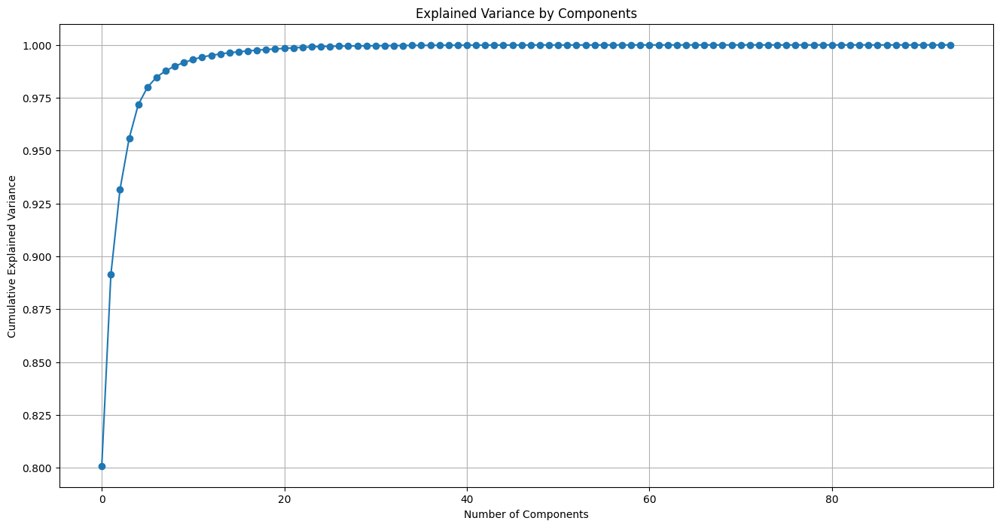

In [173]:
from sklearn.decomposition import PCA

pca = PCA()
X_pca = pca.fit_transform(merged_full_numeric_data)

print("Explained Variance Ratio:", pca.explained_variance_ratio_)

cumulative_variance = pca.explained_variance_ratio_.cumsum()
print("Cumulative Explained Variance:", cumulative_variance)

import matplotlib.pyplot as plt
plt.figure(figsize=(16,8))
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid(True)
plt.show()

In [174]:
pca = PCA(n_components=10)
X_pca = pca.fit_transform(merged_full_numeric_data)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

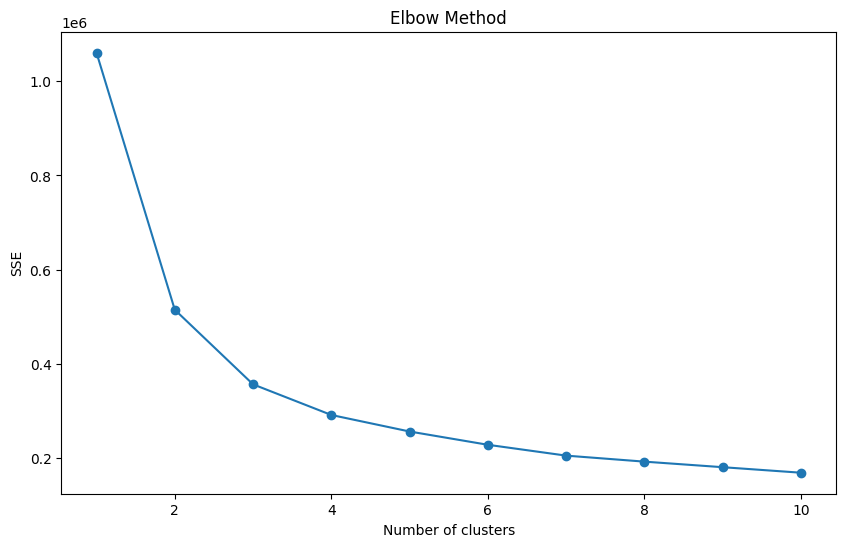

In [175]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    sse.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), sse, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

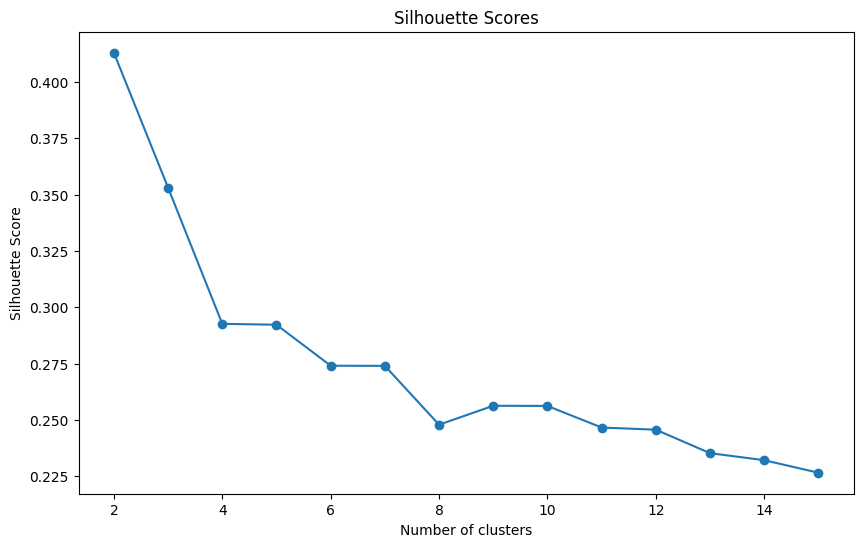

In [176]:
silhouette_scores = []
for k in range(2, 16):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_pca)
    score = silhouette_score(X_pca, kmeans.labels_)
    silhouette_scores.append(score)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 16), silhouette_scores, marker='o')
plt.title('Silhouette Scores')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.show()

In [177]:
kmeans = KMeans(n_clusters=15, random_state=42)
kmeans.fit(X_pca)
merged_full_data['cluster'] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-177-f447744c5618>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_full_data['cluster'] = kmeans.labels_


In [178]:
full_merged_cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=[f'PCA_{i+1}' for i in range(kmeans.cluster_centers_.shape[1])])
print(full_merged_cluster_centers)

        PCA_1      PCA_2     PCA_3     PCA_4     PCA_5     PCA_6     PCA_7  \
0  -32.282744   1.113052 -1.830810  0.979380  0.045342  2.504976 -0.507785   
1   13.944775  -2.572913  2.047393  2.067839  0.423889 -0.208612 -0.030582   
2   40.829738  -5.181375  0.046247  0.909355 -0.622601  1.346709  0.279001   
3    1.738631  10.199694 -0.691586  0.406427  0.345913 -1.193123  0.584745   
4   15.971977  11.620848 -1.339044 -2.397379 -0.081263 -0.166230 -0.173074   
5   30.332942  10.587577 -2.890851 -2.400669  0.040380  0.534501 -1.280971   
6   -9.704440  -5.883252 -2.282108 -2.166970 -0.105687 -0.889380 -0.052082   
7    1.838671  -1.705335  5.420935  0.925611 -0.549518 -0.517268  0.112712   
8    4.775493  -8.851491 -4.032156 -1.754690 -0.722366 -0.656238  0.440370   
9  -21.779053  -2.955984 -1.849031 -1.025588  0.518739  0.188808 -0.487187   
10  25.373287  -5.906698  0.195988  0.598222  0.872739  0.587838  0.524371   
11 -11.867070   0.202880  5.915238  1.601843 -0.013820 -0.832618

In [179]:
print(merged_full_data[['player', 'cluster']])

                  player  cluster
0         Aaron Connolly        0
1        Aaron Cresswell        7
2           Aaron Hickey        7
3       Aaron Leya Iseka        0
4           Aarón Martín        7
...                  ...      ...
1822       Yves Bissouma        7
1823     Zaydou Youssouf        6
1824          Zeki Çelik        1
1825     Zinedine Ferhat        6
1826  Zlatan Ibrahimović        9

[1827 rows x 2 columns]


In [180]:
players_in_cluster_3 = merged_full_data[merged_full_data['cluster'] == 13]['player']

players_in_cluster_3.head(20)

102           Ander Herrera
167             Arthur Melo
287         Clément Lenglet
542         Frenkie de Jong
628          Héctor Herrera
650      Idrissa Gana Gueye
818        Jordan Henderson
823              Jordi Alba
941             Kyle Walker
957         Leandro Paredes
1054       Manuel Locatelli
1063     Marcel Halstenberg
1076         Marco Verratti
1124          Mateo Kovačić
1171           Maxime López
1216         Miralem Pjanić
1262             Nathan Aké
1316    Oleksandr Zinchenko
1334         Óscar Mingueza
1424                Rafinha
Name: player, dtype: object

In [181]:
print(merged_full_data['cluster'].value_counts())

cluster
6     209
7     204
0     201
9     184
1     173
3     140
11    139
8     116
10    107
4      98
12     75
5      66
2      61
14     28
13     26
Name: count, dtype: int64


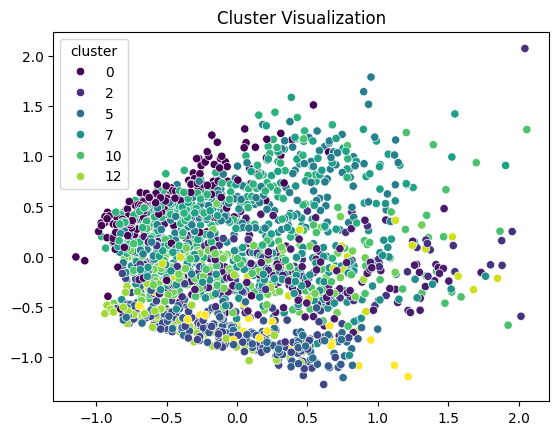

In [182]:
sns.scatterplot(x=principal_components[:,0], y=principal_components[:,1], hue=merged_full_data['cluster'], palette='viridis')
plt.title('Cluster Visualization')
plt.show()

In [183]:
original_space_centers = kmeans.cluster_centers_.dot(pca.components_)

In [184]:
original_space_centers = scaler.inverse_transform(pca.inverse_transform(kmeans.cluster_centers_))
original_cluster_centers = pd.DataFrame(original_space_centers, columns=merged_full_data.columns.drop(['player', 'cluster']))

print(original_cluster_centers)

    assists_p_90  npG_p_90   xA_p_90  npxG_p_90  shots_p_90  \
0       0.078644  0.344829  0.054012   0.256508   11.667993   
1       0.067966  0.071352  0.047902   0.052875    4.645920   
2       0.093618  0.089110  0.065019   0.060875    5.675912   
3       0.017148  0.054913  0.011189   0.043493    2.396058   
4       0.015466  0.051463  0.009560   0.039368    2.472952   
5       0.019628  0.053665  0.012319   0.039543    2.533713   
6       0.116517  0.241822  0.078894   0.175909   10.411500   
7       0.063110  0.051191  0.045452   0.038276    4.340785   
8       0.144403  0.250042  0.097073   0.178103   10.949825   
9       0.096639  0.281632  0.065932   0.208399   10.860220   
10      0.092391  0.107940  0.063896   0.078103    6.430972   
11      0.041853  0.059727  0.031420   0.047866    4.203098   
12      0.000653  0.078806 -0.000073   0.062680    2.634111   
13      0.086905  0.093877  0.060234   0.064344    5.234402   
14      0.033610  0.058480  0.021399   0.040297    3.07

In [185]:
cluster_groups = merged_full_data.groupby('cluster')
cluster_summary = cluster_groups.describe()

print(cluster_summary)


        assists_p_90                                                      \
               count      mean       std  min    25%   50%     75%   max   
cluster                                                                    
0              201.0  0.093134  0.089217  0.0  0.000  0.08  0.1500  0.38   
1              173.0  0.083584  0.095436  0.0  0.000  0.06  0.1200  0.72   
2               61.0  0.120492  0.096167  0.0  0.050  0.11  0.1700  0.41   
3              140.0  0.031357  0.054972  0.0  0.000  0.00  0.0500  0.28   
4               98.0  0.020714  0.038909  0.0  0.000  0.00  0.0300  0.18   
5               66.0  0.027424  0.043969  0.0  0.000  0.00  0.0400  0.26   
6              209.0  0.151818  0.109261  0.0  0.080  0.14  0.2200  0.67   
7              204.0  0.083137  0.091031  0.0  0.000  0.06  0.1200  0.54   
8              116.0  0.228362  0.150881  0.0  0.110  0.21  0.2900  0.76   
9              184.0  0.119457  0.099982  0.0  0.040  0.11  0.1900  0.49   
10          

In [186]:
merged_full_data['mins']=data_outfield['mins']


<ipython-input-186-25cc9c21d647>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_full_data['mins']=data_outfield['mins']


In [187]:
average_min_per_cluster = merged_full_data.groupby('cluster')['mins'].mean().reset_index()

# Rename columns for clarity
average_min_per_cluster.columns = ['cluster', 'average_min']

print(average_min_per_cluster)

    cluster  average_min
0         0  1517.512438
1         1  1814.878613
2         2  1895.032787
3         3  1831.121429
4         4  1848.489796
5         5  1853.166667
6         6  1702.851675
7         7  1845.637255
8         8  1672.655172
9         9  1510.201087
10       10  1696.280374
11       11  1681.719424
12       12  1789.240000
13       13  1854.884615
14       14  1873.678571


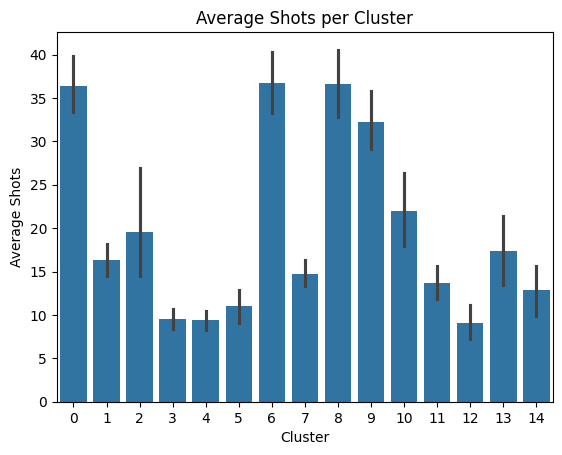

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Visualize average 'shots' across clusters
sns.barplot(x=merged_full_data['cluster'], y=merged_full_data['shots'])
plt.title('Average Shots per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Shots')
plt.show()

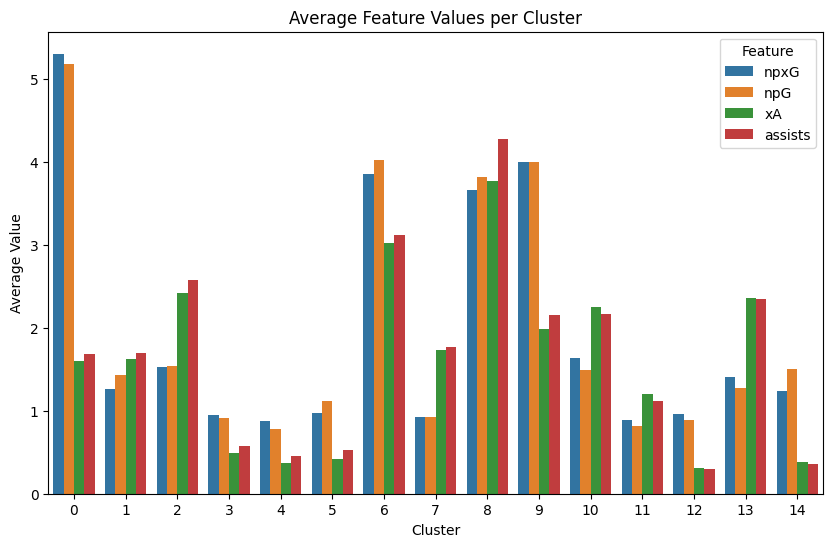

In [189]:
feature_means = merged_full_data.groupby('cluster')[['npxG', 'npG', 'xA', 'assists']].mean().reset_index()

melted_data = feature_means.melt(id_vars="cluster", var_name="feature", value_name="average")

plt.figure(figsize=(10, 6))
sns.barplot(x='cluster', y='average', hue='feature', data=melted_data)
plt.title('Average Feature Values per Cluster')
plt.xlabel('Cluster')
plt.ylabel('Average Value')
plt.legend(title='Feature')
plt.show()

# **Fully merged Cat**

In [205]:
merged_categories = {
    'G/A': ['assists_p_90', 'npG_p_90', 'assists', 'npG'],
    'xG/xA': ['xA_p_90', 'npxG_p_90', 'xA', 'npxG'],
    'Shooting': [
        'shots_p_90', 'shot_on_target_pct', 'goals_p_shot', 'avg_shot_dist', 'npxG_p_shot',
        'sca_shot_p_90', 'gca_shot_p_90', 'shots', 'sca_shot', 'gca_shot'
    ],
    'Passing': [
        'pass_cmp_p_90', 'pass_cmp_pct', 'short_cmp_p_90', 'med_cmp_p_90', 'long_cmp_p_90',
        'sca_live_pass_p_90', 'gca_live_pass_p_90', 'pass_cmp', 'short_cmp', 'med_cmp',
        'long_cmp', 'sca_live_pass', 'gca_live_pass'
    ],
    'Progressive Passing': [
        'key_pass_p_90', 'pass_final_3rd_p_90', 'prog_pass_p_90', 'through_ball_cmp_p_90',
        'key_pass', 'pass_final_3rd', 'prog_pass', 'through_ball_cmp'
    ],
    'High Balls': [
        'cross_box_p_90', 'switches_p_90', 'crosses_p_90', 'cross_box', 'switches', 'crosses'
    ],
    'Giveaway': [
        'intercepted_pass_p_90', 'blocked_pass_p_90', 'disposs_p_90', 'intercepted_pass',
        'blocked_pass', 'disposs'
    ],
    'Dribbling': [
        'sca_dribble_p_90', 'gca_dribble_p_90', 'success_dribble_p_90', 'players_dribble_past_p_90',
        'sca_dribble', 'gca_dribble', 'success_dribble', 'players_dribble_past'
    ],
    'Defending': [
        'sca_def_p_90', 'gca_def_p_90', 'blocks_p_90', 'intercepts_p_90', 'clearances_p_90',
        'sca_def', 'gca_def', 'blocks', 'intercepts', 'clearances'
    ],
    '1v1 Defending': [
        'tackle_won_p_90', 'dribblers_tackled_p_90', 'tackle_won', 'dribblers_tackled'
    ],
    'Defensive 3rd': [
        'def_3rd_tackle_p_90', 'def_3rd_press_p_90', 'pct_touch_def_3rd',
        'def_3rd_tackle', 'def_3rd_press', 'pct_touch_def_3rd'
    ],
    'Middle 3rd': [
        'mid_3rd_tackle_p_90', 'mid_3rd_press_p_90', 'pct_touch_mid_3rd',
        'mid_3rd_tackle', 'mid_3rd_press', 'pct_touch_mid_3rd'
    ],
    'Attacking 3rd': [
        'att_3rd_tackle_p_90', 'att_3rd_press_p_90', 'pct_touch_att_3rd',
        'att_3rd_tackle', 'att_3rd_press', 'pct_touch_att_3rd'
    ],
    'Pressing': ['success_press_p_90', 'success_press'],
    'Carry': ['carry_p_90', 'prog_carry_p_90', 'carry', 'prog_carry']
}


In [206]:
full_merged_clustered_data=pd.DataFrame(index=merged_full_data['cluster'].unique())

In [207]:
for category, features in merged_categories.items():
    full_merged_clustered_data[category] = merged_full_data.groupby('cluster')[features].mean().mean(axis=1)

In [208]:
for category in categories:
    full_merged_clustered_data[category] = full_merged_clustered_data[category] / full_merged_clustered_data[category].max()

In [209]:
full_merged_clustered_data.reset_index(inplace=True)
full_merged_clustered_data.rename(columns={"index": "cluster"}, inplace=True)

In [210]:
full_merged_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
0,0,0.850305,0.933448,0.980149,0.170593,0.161622,0.245991,0.591861,0.372955,0.220769,0.279753,0.237947,0.760096,1.000000,0.671607,0.224283
1,7,0.331263,0.357770,0.686322,0.498708,0.483248,0.887780,0.754787,0.429586,0.622249,0.918651,0.852147,0.916827,0.486465,0.950741,0.511101
2,10,0.453105,0.523129,0.762851,0.633569,0.663984,0.818408,0.779210,0.543096,0.459745,0.887549,0.675911,1.000000,0.581846,0.993252,0.680763
3,1,0.385772,0.387723,0.709658,0.589556,0.548150,0.749305,0.775985,0.432672,0.590989,0.974734,0.818036,0.949366,0.505391,1.000000,0.604169
4,2,0.505121,0.528147,0.721944,0.845158,0.863556,1.000000,0.798875,0.570707,0.566236,1.000000,0.720998,0.942545,0.542666,0.969545,0.867825
5,8,1.000000,1.000000,1.000000,0.446478,0.517811,0.947062,1.000000,1.000000,0.290307,0.577927,0.425199,0.843550,0.932133,0.875645,0.609590
6,9,0.761688,0.808268,0.951245,0.229108,0.236678,0.489332,0.771789,0.604032,0.273707,0.455652,0.397004,0.811559,0.947139,0.787095,0.333944
7,6,0.878452,0.923933,0.988763,0.341838,0.388208,0.791428,0.969657,0.882730,0.303426,0.564146,0.473819,0.861569,0.938383,0.866111,0.493010
8,4,0.150154,0.167200,0.478868,0.622450,0.383993,0.469686,0.330281,0.142736,0.960622,0.673897,0.967061,0.600718,0.096444,0.659384,0.580407
9,3,0.183846,0.192714,0.517557,0.503119,0.339161,0.483110,0.395623,0.172419,0.933631,0.739294,1.000000,0.649359,0.179241,0.734188,0.459822


In [211]:
pca_p_90_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
10,0,0.073605,0.084200,0.607787,0.727527,0.307124,0.291530,0.225658,0.073538,1.000000,0.481833,1.000000,0.669163,0.075072,0.509697,0.484470
13,1,0.861310,0.875705,1.000000,0.576709,0.382919,0.473718,0.801914,0.610150,0.225456,0.253455,0.181522,0.683674,0.964302,0.573817,0.567882
9,2,0.394843,0.445210,0.770334,0.692221,0.596888,0.557878,0.835421,0.528784,0.408943,0.765163,0.372288,0.899829,0.677790,0.691004,0.970338
7,3,0.120724,0.166516,0.546418,0.702981,0.488005,0.354220,0.478596,0.259540,0.503385,0.593648,0.517904,0.954818,0.355167,0.552138,0.743364
4,4,0.148379,0.158629,0.767396,0.700265,0.473315,0.623867,0.751136,0.352559,0.734863,0.905812,0.662988,0.740132,0.455169,0.598216,0.735766
3,5,0.567184,0.600271,0.841563,0.748915,0.763408,0.869737,0.822662,0.542347,0.276842,0.368990,0.268738,0.796521,0.775873,0.788080,0.640280
5,6,0.089779,0.100331,0.563109,0.948453,0.545863,0.402142,0.291966,0.106791,0.820258,0.486628,0.861986,0.782765,0.092791,0.838320,0.476206
12,7,0.124454,0.161731,0.596524,0.811104,0.593703,0.378134,0.521390,0.279059,0.603644,1.000000,0.599300,1.000000,0.303544,0.686797,1.000000
11,8,1.000000,1.000000,0.906307,0.709087,0.742493,0.931581,1.000000,0.913134,0.260257,0.418357,0.198363,0.687364,1.000000,0.857410,0.716564
8,9,0.299891,0.382373,0.756872,0.557549,0.349148,0.525645,0.762347,0.454044,0.366214,0.442404,0.353688,0.778461,0.754604,0.519668,0.709323


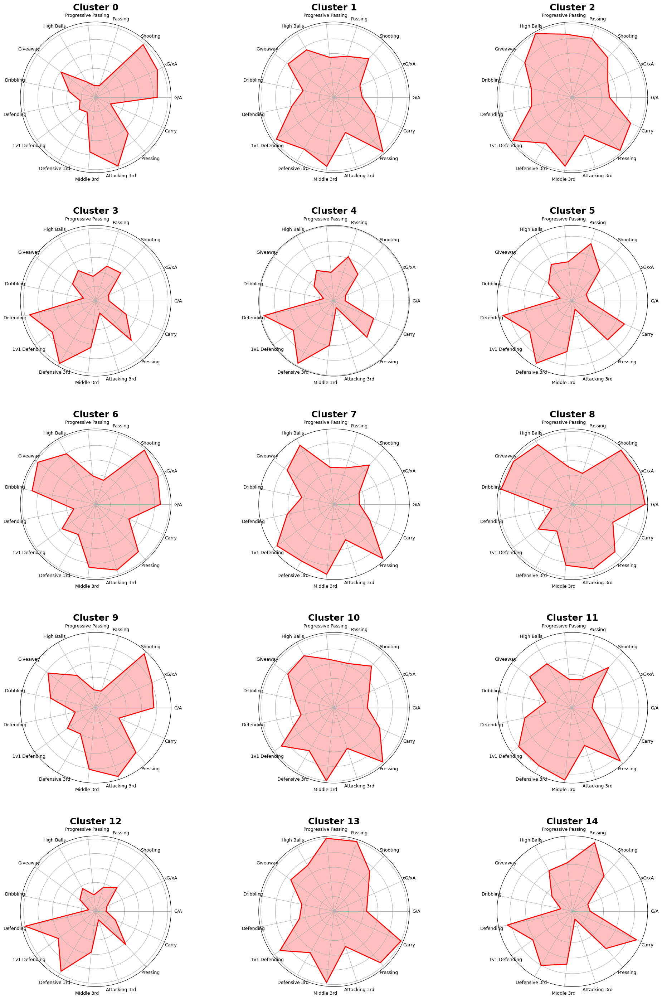

In [242]:
import matplotlib.pyplot as plt
import numpy as np

# Function to create a radar chart
def make_radar_chart(ax, stats, feature_names, num_vars, max_val):
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]
    angles += angles[:1]
    stats = [s / max_val for s in stats]
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=9, rotation=45, ha="center")

# Assume 'full_merged_clustered_data' is your DataFrame with cluster labels
full_merged_clustered_data = full_merged_clustered_data.sort_values('cluster')
clusters = full_merged_clustered_data['cluster'].unique()
feature_names = full_merged_clustered_data.columns[1:]
num_vars = len(feature_names)
max_val = full_merged_clustered_data[feature_names].max().max()

# Adjust the number of rows and columns based on the number of clusters
n_clusters = len(clusters)
n_cols = 3
n_rows = (n_clusters // n_cols) + (n_clusters % n_cols > 0)

# Create a figure with appropriate size
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, subplot_kw=dict(polar=True), figsize=(25, n_rows * 7))
fig.subplots_adjust(hspace=0.35, wspace=0.1)

# Loop through clusters and create a radar chart for each
for i, cluster_label in enumerate(clusters):
    ax = axes.flatten()[i]
    cluster_data = full_merged_clustered_data[full_merged_clustered_data['cluster'] == cluster_label]
    stats = cluster_data.mean().drop('cluster').tolist()
    make_radar_chart(ax, stats, feature_names, num_vars, max_val)
    ax.set_title(f'Cluster {cluster_label}', size=18, fontweight='bold', position=(0.5, 100))  # Move title higher

# Hide any unused axes
for j in range(n_clusters, len(axes.flatten())):
    axes.flatten()[j].set_visible(False)

plt.show()


In [213]:
players_in_cluster_3 = second_full_data[second_full_data['cluster'] ==0]

players_in_cluster_3.head(20)

,player,assists,npG,xA,npxG,shots,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble,players_dribble_past,carry,prog_carry,disposs,cluster,mins
69,Alexander Isak,2,17,2.3,14.8,78,50.0,0.22,0.19,330,...,4.0,49.0,54.0,34,40,499,72,38,0,2340
87,Álvaro Morata,9,10,4.9,10.3,54,42.6,0.19,0.19,457,...,8.0,48.0,51.0,27,27,580,74,39,0,2014
107,André Silva,7,21,5.5,19.0,107,49.5,0.20,0.18,583,...,5.0,44.0,56.0,30,32,697,97,58,0,2760
109,Andrea Belotti,6,9,7.1,10.0,102,33.3,0.09,0.10,501,...,7.0,52.0,49.0,51,51,844,162,62,0,2888
122,Andrej Kramarić,5,15,4.8,12.4,92,43.5,0.16,0.14,779,...,9.0,46.0,54.0,41,42,1019,172,48,0,2379
127,Andy Delort,9,15,5.8,10.2,91,37.4,0.16,0.11,558,...,7.0,44.0,53.0,38,39,657,86,41,0,2482
138,Ante Rebić,4,11,5.3,7.3,44,52.3,0.25,0.17,307,...,7.0,30.0,67.0,25,26,471,86,44,0,1776
143,Antoine Griezmann,7,12,5.5,12.4,68,44.1,0.18,0.18,1176,...,9.0,41.0,55.0,25,27,1118,101,24,0,2604
214,Boulaye Dia,1,9,1.6,9.5,58,37.9,0.16,0.16,502,...,14.0,48.0,48.0,48,49,747,94,69,0,2930
260,Che Adams,5,9,5.6,8.9,56,55.4,0.16,0.16,444,...,10.0,46.0,50.0,25,28,630,67,52,0,2667


In [214]:
second_p_90_data[second_p_90_data['player']=='Lionel Messi']

,player,assists_p_90,npG_p_90,xA_p_90,npxG_p_90,shots_p_90,shot_on_target_pct,goals_p_shot,npxG_p_shot,pass_cmp_p_90,...,pct_touch_def_3rd,pct_touch_mid_3rd,pct_touch_att_3rd,success_dribble_p_90,players_dribble_past_p_90,carry_p_90,prog_carry_p_90,disposs_p_90,cluster,mins
975,Lionel Messi,0.27,0.8,0.32,0.58,5.65,44.7,0.14,0.1,59.2,...,2.0,48.0,60.0,4.38,4.64,72.4,15.4,2.83,8,3023


In [215]:
first_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.570952,0.585407,0.835072,0.768035,0.747693,0.695808,0.800954,0.530285,0.309815,0.504062,0.285800,0.826782,0.753183,0.802768,0.746429
5,1,0.103680,0.102987,0.578941,0.972356,0.582940,0.372665,0.304582,0.111711,0.798780,0.509842,0.835140,0.795045,0.104247,0.876354,0.475712
0,2,0.612086,0.701433,0.967173,0.468022,0.195995,0.163234,0.555618,0.310879,0.205756,0.196305,0.158105,0.739377,0.870686,0.323486,0.556250
6,3,0.478069,0.535484,0.834567,0.602102,0.443245,0.559942,0.926925,1.000000,0.299611,0.512513,0.283131,0.748689,0.878736,0.696039,0.706809
2,4,0.104507,0.137985,0.468821,0.713032,0.466478,0.369131,0.469596,0.216164,0.591364,0.547725,0.573551,0.869047,0.345983,0.554018,0.629590
9,5,0.072411,0.086120,0.600566,0.748692,0.313031,0.278354,0.224396,0.077027,1.000000,0.486424,1.000000,0.667168,0.073615,0.539286,0.476894
4,6,0.197530,0.208102,0.653123,0.802361,0.564953,0.744898,0.749547,0.345810,0.641245,0.690933,0.567168,0.727165,0.513964,0.733325,0.617176
1,7,0.322429,0.373556,0.810985,0.655172,0.486759,1.000000,0.751237,0.375954,0.490748,0.472767,0.450161,0.672788,0.690545,0.616230,0.521844
7,8,0.425658,0.490948,0.865274,0.499545,0.284645,0.354886,0.769481,0.480303,0.292069,0.354130,0.262473,0.754700,0.866590,0.463129,0.693702
8,9,0.279391,0.339778,0.704049,0.620951,0.430472,0.411935,0.728681,0.453425,0.434945,0.633265,0.410927,0.850165,0.641276,0.567635,0.824560


In [216]:
first_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
3,0,0.570952,0.585407,0.835072,0.768035,0.747693,0.695808,0.800954,0.530285,0.309815,0.504062,0.285800,0.826782,0.753183,0.802768,0.746429
5,1,0.103680,0.102987,0.578941,0.972356,0.582940,0.372665,0.304582,0.111711,0.798780,0.509842,0.835140,0.795045,0.104247,0.876354,0.475712
0,2,0.612086,0.701433,0.967173,0.468022,0.195995,0.163234,0.555618,0.310879,0.205756,0.196305,0.158105,0.739377,0.870686,0.323486,0.556250
6,3,0.478069,0.535484,0.834567,0.602102,0.443245,0.559942,0.926925,1.000000,0.299611,0.512513,0.283131,0.748689,0.878736,0.696039,0.706809
2,4,0.104507,0.137985,0.468821,0.713032,0.466478,0.369131,0.469596,0.216164,0.591364,0.547725,0.573551,0.869047,0.345983,0.554018,0.629590
9,5,0.072411,0.086120,0.600566,0.748692,0.313031,0.278354,0.224396,0.077027,1.000000,0.486424,1.000000,0.667168,0.073615,0.539286,0.476894
4,6,0.197530,0.208102,0.653123,0.802361,0.564953,0.744898,0.749547,0.345810,0.641245,0.690933,0.567168,0.727165,0.513964,0.733325,0.617176
1,7,0.322429,0.373556,0.810985,0.655172,0.486759,1.000000,0.751237,0.375954,0.490748,0.472767,0.450161,0.672788,0.690545,0.616230,0.521844
7,8,0.425658,0.490948,0.865274,0.499545,0.284645,0.354886,0.769481,0.480303,0.292069,0.354130,0.262473,0.754700,0.866590,0.463129,0.693702
8,9,0.279391,0.339778,0.704049,0.620951,0.430472,0.411935,0.728681,0.453425,0.434945,0.633265,0.410927,0.850165,0.641276,0.567635,0.824560


In [217]:
second_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
6,0,0.131985,0.157248,0.362397,0.535522,0.450432,0.371301,0.447077,0.283264,0.423957,0.593088,0.704109,0.719983,0.335362,0.657215,0.524232
2,1,0.036967,0.060502,0.184159,0.228038,0.166912,0.185498,0.219372,0.128850,0.197859,0.230450,0.372972,0.362874,0.201850,0.266033,0.212792
13,2,1.000000,1.000000,1.000000,0.325710,0.289289,0.355115,0.730021,0.590656,0.186042,0.221941,0.182710,0.518833,1.000000,0.552098,0.457071
9,3,0.487381,0.511904,0.654884,0.429833,0.432333,0.576322,0.794761,0.686211,0.301434,0.489209,0.535688,0.770721,0.764410,0.740769,0.571935
12,4,0.114174,0.116712,0.351313,0.660537,0.370072,0.361576,0.304787,0.126140,1.000000,0.635746,1.000000,0.445905,0.095306,0.602176,0.589172
4,5,0.414874,0.431469,0.623779,0.248454,0.230299,0.340889,0.512168,0.456071,0.164376,0.221976,0.256432,0.493287,0.669872,0.425170,0.340793
8,6,0.927603,0.886616,0.902663,0.561600,0.659541,1.000000,1.000000,1.000000,0.247284,0.355671,0.370949,0.617545,0.842981,0.638767,0.777197
5,7,0.060387,0.072133,0.298108,0.479160,0.253769,0.256596,0.191867,0.081570,0.609798,0.330806,0.641262,0.333666,0.070778,0.348018,0.422954
1,8,0.265935,0.277331,0.403897,0.608673,0.499690,0.900569,0.742975,0.389532,0.585640,0.639655,0.780443,0.521641,0.418142,0.583899,0.613559
0,9,0.193849,0.220399,0.468301,0.132700,0.104238,0.143052,0.256254,0.189489,0.089052,0.117088,0.156454,0.320181,0.448592,0.227410,0.160559


In [218]:
pca_p_90_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Carry,Pressing
10,0,0.073605,0.084200,0.607787,0.727527,0.307124,0.291530,0.225658,0.073538,1.000000,0.481833,1.000000,0.669163,0.075072,0.509697,0.484470
13,1,0.861310,0.875705,1.000000,0.576709,0.382919,0.473718,0.801914,0.610150,0.225456,0.253455,0.181522,0.683674,0.964302,0.573817,0.567882
9,2,0.394843,0.445210,0.770334,0.692221,0.596888,0.557878,0.835421,0.528784,0.408943,0.765163,0.372288,0.899829,0.677790,0.691004,0.970338
7,3,0.120724,0.166516,0.546418,0.702981,0.488005,0.354220,0.478596,0.259540,0.503385,0.593648,0.517904,0.954818,0.355167,0.552138,0.743364
4,4,0.148379,0.158629,0.767396,0.700265,0.473315,0.623867,0.751136,0.352559,0.734863,0.905812,0.662988,0.740132,0.455169,0.598216,0.735766
3,5,0.567184,0.600271,0.841563,0.748915,0.763408,0.869737,0.822662,0.542347,0.276842,0.368990,0.268738,0.796521,0.775873,0.788080,0.640280
5,6,0.089779,0.100331,0.563109,0.948453,0.545863,0.402142,0.291966,0.106791,0.820258,0.486628,0.861986,0.782765,0.092791,0.838320,0.476206
12,7,0.124454,0.161731,0.596524,0.811104,0.593703,0.378134,0.521390,0.279059,0.603644,1.000000,0.599300,1.000000,0.303544,0.686797,1.000000
11,8,1.000000,1.000000,0.906307,0.709087,0.742493,0.931581,1.000000,0.913134,0.260257,0.418357,0.198363,0.687364,1.000000,0.857410,0.716564
8,9,0.299891,0.382373,0.756872,0.557549,0.349148,0.525645,0.762347,0.454044,0.366214,0.442404,0.353688,0.778461,0.754604,0.519668,0.709323


In [219]:
second_full_pca_clustered_data

,cluster,G/A,xG/xA,Shooting,Passing,Progressive Passing,High Balls,Giveaway,Dribbling,Defending,1v1 Defending,Defensive 3rd,Middle 3rd,Attacking 3rd,Pressing,Carry
12,0,1.000000,1.000000,1.000000,0.355284,0.323281,0.303374,0.734583,0.611956,0.196097,0.261830,0.202712,0.550079,1.000000,0.591313,0.503079
4,1,0.426564,0.445277,0.635633,0.253697,0.245484,0.272849,0.502469,0.446087,0.153374,0.219082,0.232701,0.478118,0.667401,0.420021,0.354996
1,2,0.426323,0.410033,0.465702,0.841104,0.751393,1.000000,0.898791,0.488796,0.590912,0.765172,0.787109,0.569354,0.486221,0.675809,0.870136
11,3,0.118828,0.117434,0.355675,0.735637,0.432782,0.313998,0.307662,0.131129,1.000000,0.697586,1.000000,0.455576,0.092629,0.628952,0.669292
5,4,0.053919,0.065789,0.295623,0.461106,0.245690,0.191368,0.171548,0.074469,0.573397,0.334620,0.619963,0.316334,0.063849,0.332783,0.408683
9,5,0.867147,0.836596,0.882694,0.568448,0.687581,0.729474,1.000000,1.000000,0.260202,0.446711,0.415971,0.685523,0.874465,0.717012,0.808356
10,6,0.384479,0.415999,0.584062,0.447038,0.446129,0.468208,0.711894,0.601949,0.303752,0.517096,0.532835,0.727288,0.647582,0.690440,0.576753
2,7,0.027190,0.038560,0.150192,0.227210,0.140095,0.111945,0.145421,0.066154,0.224038,0.204429,0.379884,0.285693,0.115203,0.205494,0.197480
6,8,0.148309,0.172443,0.386076,0.632746,0.546783,0.310156,0.450079,0.311821,0.440107,0.734490,0.757689,0.822043,0.357693,0.769237,0.628418
3,9,0.104106,0.124002,0.310598,0.364260,0.293639,0.276059,0.355633,0.219341,0.267872,0.364052,0.464002,0.453930,0.289096,0.390369,0.365393


# **Comparison**

In [ ]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment

# Function to calculate centroids
def calculate_centroids(data):
    return data.groupby('cluster').mean().drop(columns='cluster', errors='ignore')

# Function to calculate pairwise distances between centroids of two datasets
def calculate_pairwise_distances(centroids1, centroids2):
    return cdist(centroids1, centroids2, metric='euclidean')

# Function to find the most similar clusters based on the distance matrix
def find_most_similar_clusters(distance_matrix):
    row_ind, col_ind = linear_sum_assignment(distance_matrix)
    return list(zip(row_ind, col_ind, distance_matrix[row_ind, col_ind]))

# Ensure 'cluster' column exists
datasets = {
    'first_clustered_data': first_clustered_data,
    'second_clustered_data': second_clustered_data,
    'pca_p_90_clustered_data': pca_p_90_clustered_data,
    'second_full_pca_clustered_data': second_full_pca_clustered_data
}

for name, data in datasets.items():
    if 'cluster' not in data.columns:
        raise KeyError(f"'cluster' column not found in {name}")

# Calculate centroids for each dataset
centroids = {}
for name, data in datasets.items():
    centroids[name] = calculate_centroids(data)

# Create pairwise distance matrices
distance_matrices = {}
dataset_names = list(datasets.keys())

for i in range(len(dataset_names)):
    for j in range(i+1, len(dataset_names)):
        name1, name2 = dataset_names[i], dataset_names[j]
        distances = calculate_pairwise_distances(centroids[name1], centroids[name2])
        distance_matrices[(name1, name2)] = distances

# Find most similar clusters
similar_clusters = {}

for (name1, name2), distance_matrix in distance_matrices.items():
    similar_clusters[(name1, name2)] = find_most_similar_clusters(distance_matrix)

# Aggregate the most similar clusters across all datasets
aggregated_similar_clusters = {cluster: {} for cluster in range(len(centroids[dataset_names[0]]))}

for cluster in aggregated_similar_clusters.keys():
    for (name1, name2), clusters in similar_clusters.items():
        for cluster1, cluster2, distance in clusters:
            if cluster1 == cluster or cluster2 == cluster:
                aggregated_similar_clusters[cluster][name1] = cluster1
                aggregated_similar_clusters[cluster][name2] = cluster2

# Print the consolidated results
print("Most Similar Clusters Across All Datasets:")
for cluster, datasets in aggregated_similar_clusters.items():
    print(f"Cluster {cluster}: {', '.join([f'{dataset} Cluster {datasets[dataset]}' for dataset in datasets])}")


Most Similar Clusters Across All Datasets:
Cluster 0: first_clustered_data Cluster 9, second_clustered_data Cluster 11, pca_p_90_clustered_data Cluster 10, second_full_pca_clustered_data Cluster 0
Cluster 1: first_clustered_data Cluster 13, second_clustered_data Cluster 1, pca_p_90_clustered_data Cluster 7, second_full_pca_clustered_data Cluster 1
Cluster 2: first_clustered_data Cluster 11, second_clustered_data Cluster 2, pca_p_90_clustered_data Cluster 2, second_full_pca_clustered_data Cluster 13
Cluster 3: first_clustered_data Cluster 3, second_clustered_data Cluster 9, pca_p_90_clustered_data Cluster 9, second_full_pca_clustered_data Cluster 3
Cluster 4: first_clustered_data Cluster 14, second_clustered_data Cluster 6, pca_p_90_clustered_data Cluster 8, second_full_pca_clustered_data Cluster 4
Cluster 5: first_clustered_data Cluster 5, second_clustered_data Cluster 5, pca_p_90_clustered_data Cluster 6, second_full_pca_clustered_data Cluster 5
Cluster 6: first_clustered_data Cluster


Comparing first_clustered_data and second_clustered_data:
Cluster 0 in first_clustered_data is most similar to Cluster 13 in second_clustered_data with a distance of 0.84
Cluster 1 in first_clustered_data is most similar to Cluster 12 in second_clustered_data with a distance of 0.74
Cluster 2 in first_clustered_data is most similar to Cluster 9 in second_clustered_data with a distance of 1.19
Cluster 3 in first_clustered_data is most similar to Cluster 3 in second_clustered_data with a distance of 0.53
Cluster 4 in first_clustered_data is most similar to Cluster 10 in second_clustered_data with a distance of 1.29
Cluster 5 in first_clustered_data is most similar to Cluster 4 in second_clustered_data with a distance of 0.42
Cluster 6 in first_clustered_data is most similar to Cluster 8 in second_clustered_data with a distance of 0.51
Cluster 7 in first_clustered_data is most similar to Cluster 11 in second_clustered_data with a distance of 1.09
Cluster 8 in first_clustered_data is most

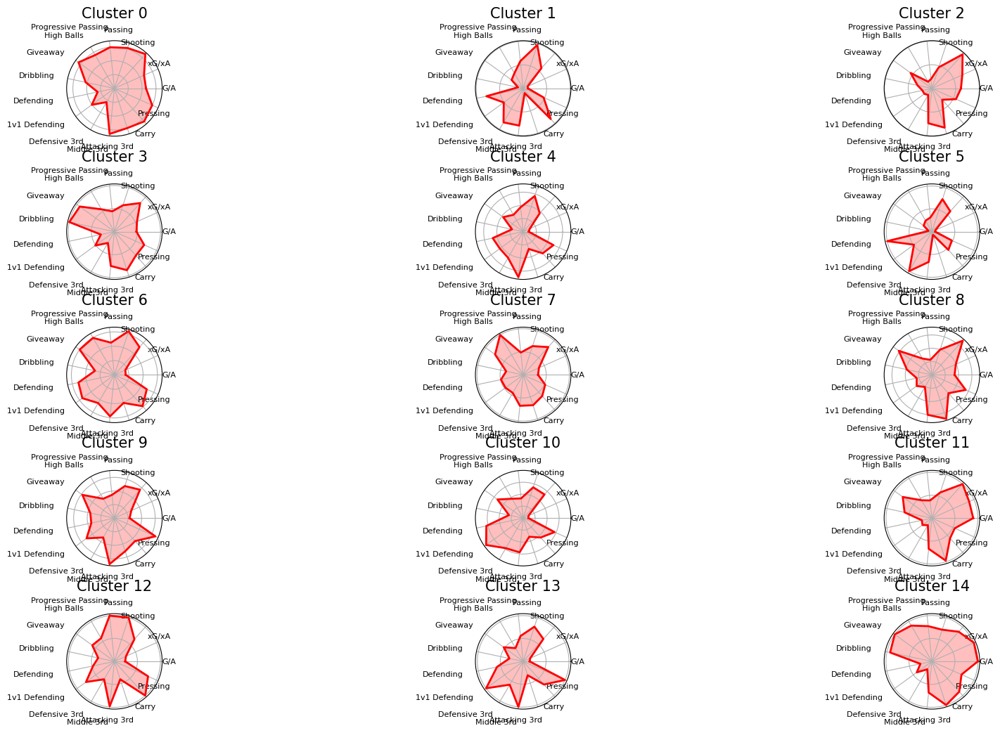

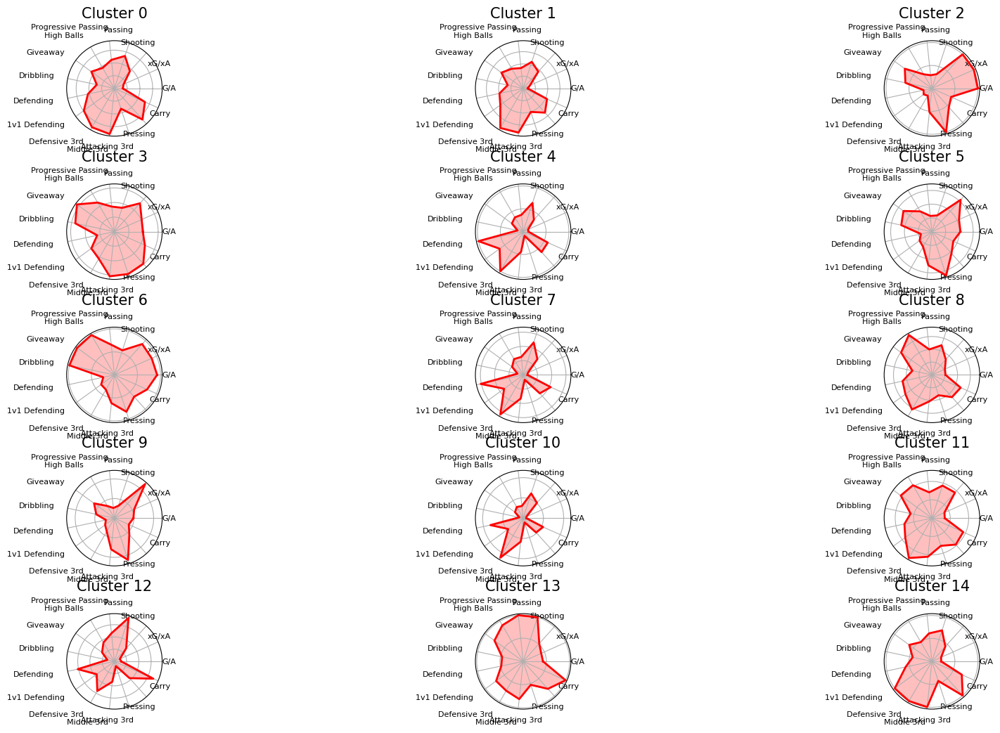

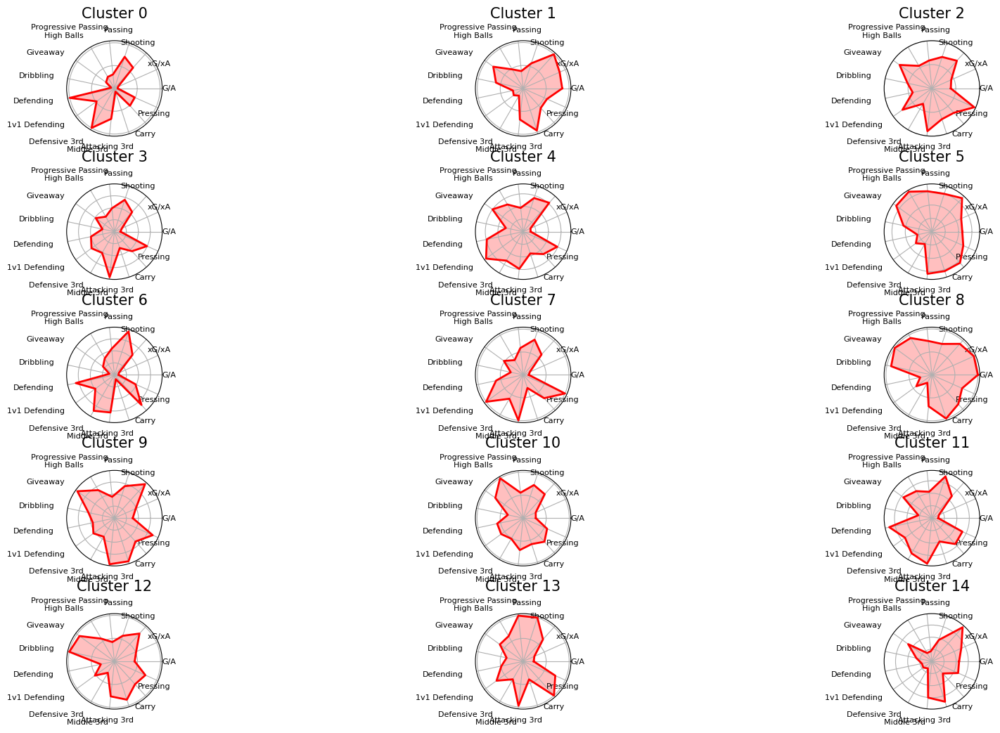

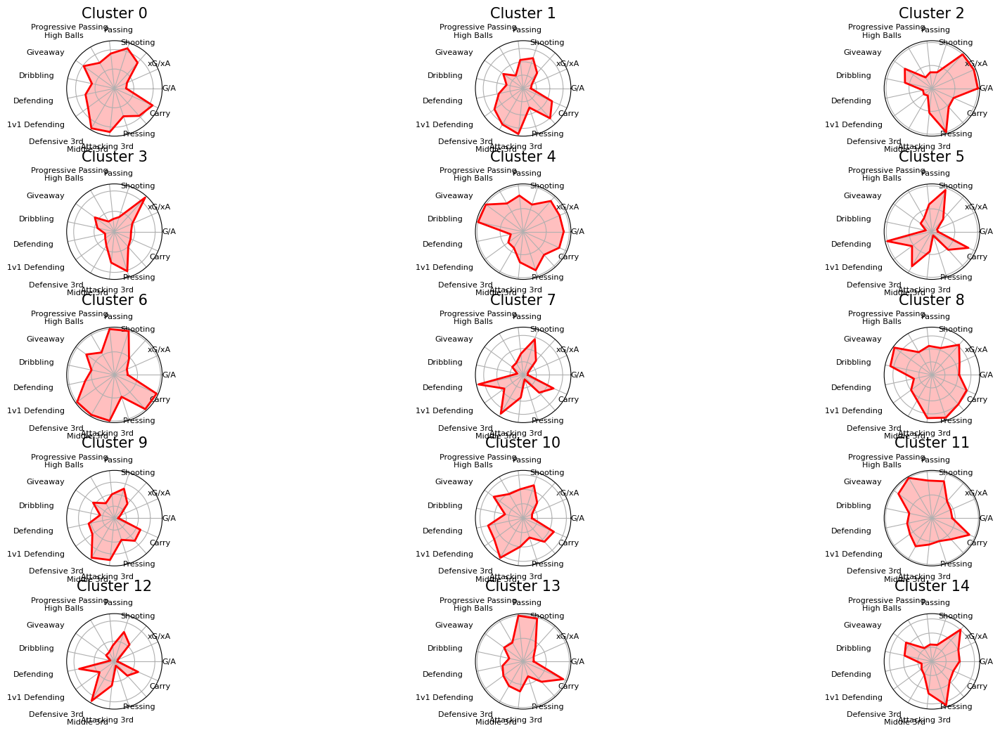

In [ ]:
import pandas as pd
import numpy as np
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
import matplotlib.pyplot as plt

# Function to calculate centroids
def calculate_centroids(data):
    return data.groupby('cluster').mean().drop(columns='cluster', errors='ignore')

# Function to calculate pairwise distances between centroids of two datasets
def calculate_pairwise_distances(centroids1, centroids2):
    return cdist(centroids1, centroids2, metric='euclidean')

# Function to find the most similar clusters based on the distance matrix
def find_most_similar_clusters(distance_matrix):
    row_ind, col_ind = linear_sum_assignment(distance_matrix)
    return list(zip(row_ind, col_ind, distance_matrix[row_ind, col_ind]))

# Function to create a radar chart
def make_radar_chart(ax, stats, feature_names, num_vars, max_val):
    # Define angle for each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    stats += stats[:1]  # Repeat the first value at the end to close the circle
    angles += angles[:1]

    # Normalize stats for consistent axis limits
    stats = [s / max_val for s in stats]  # Normalize data

    # Plot data and fill area
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.plot(angles, stats, color='red', linewidth=2)
    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(feature_names, fontsize=8, rotation=45, ha="right")

# Ensure 'cluster' column exists
datasets = {
    'first_clustered_data': first_clustered_data,
    'second_clustered_data': second_clustered_data,
    'pca_p_90_clustered_data': pca_p_90_clustered_data,
    'second_full_pca_clustered_data': second_full_pca_clustered_data
}

for name, data in datasets.items():
    if 'cluster' not in data.columns:
        raise KeyError(f"'cluster' column not found in {name}")

# Calculate centroids for each dataset
centroids = {}
for name, data in datasets.items():
    centroids[name] = calculate_centroids(data)

# Create pairwise distance matrices
distance_matrices = {}
dataset_names = list(datasets.keys())

for i in range(len(dataset_names)):
    for j in range(i+1, len(dataset_names)):
        name1, name2 = dataset_names[i], dataset_names[j]
        distances = calculate_pairwise_distances(centroids[name1], centroids[name2])
        distance_matrices[(name1, name2)] = distances

# Find most similar clusters
similar_clusters = {}

for (name1, name2), distance_matrix in distance_matrices.items():
    similar_clusters[(name1, name2)] = find_most_similar_clusters(distance_matrix)

# Print results
for (name1, name2), clusters in similar_clusters.items():
    print(f"\nComparing {name1} and {name2}:")
    for cluster1, cluster2, distance in clusters:
        print(f"Cluster {cluster1} in {name1} is most similar to Cluster {cluster2} in {name2} with a distance of {distance:.2f}")

# Visualization of clusters
for name, centroid_data in centroids.items():
    clusters = centroid_data.index
    feature_names = centroid_data.columns
    num_vars = len(feature_names)
    max_val = centroid_data.values.max()  # Max value for normalization

    # Create a large figure to hold all subplots
    fig, axes = plt.subplots(nrows=(len(clusters) // 3 + 1), ncols=3, subplot_kw=dict(polar=True), figsize=(20, 15))
    fig.subplots_adjust(hspace=0.5, wspace=0.5)

    # Loop through clusters and create a radar chart for each
    for i, cluster_label in enumerate(clusters):
        ax = axes.flatten()[i]
        stats = centroid_data.loc[cluster_label].values.tolist()
        make_radar_chart(ax, stats, feature_names, num_vars, max_val)
        ax.set_title(f'Cluster {cluster_label}', size=15, position=(0.5, 1.1))

    # Hide any unused axes
    for j in range(len(clusters), len(axes.flatten())):
        axes.flatten()[j].set_visible(False)

    plt.show()
